In [ ]:
pip install deep-pipe

In [ ]:
import torch
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F

from torch.autograd import Variable
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import datasets, models, transforms
from torchvision.models.resnet import ResNet, BasicBlock

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import time, os, copy
from PIL import Image
import natsort
import cv2
import random 


from PIL import Image
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import cv2
from tqdm import tqdm

import torch
import nibabel as nib
from torch.utils.data import Dataset
from torch.utils.data import random_split
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler

from statistics import mean

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive') #, force_remount = True

Mounted at /content/gdrive


# Model

In [ ]:
from torch import nn
from dpipe.layers.resblock import ResBlock2d
from dpipe.layers.conv import PreActivation2d


class UNet2D(nn.Module):
    def __init__(self, n_chans_in, n_chans_out, kernel_size=3, padding=1, pooling_size=2, n_filters_init=8,
                 dropout=False, p=0.1):
        super().__init__()
        self.kernel_size = kernel_size
        self.padding = padding
        self.pooling_size = pooling_size
        n = n_filters_init
        if dropout:
            dropout_layer = nn.Dropout(p)
        else:
            dropout_layer = nn.Identity()

        self.init_path = nn.Sequential(
            nn.Conv2d(n_chans_in, n, self.kernel_size, padding=self.padding, bias=False),
            nn.ReLU(),
            ResBlock2d(n, n, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n, n, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n, n, kernel_size=self.kernel_size, padding=self.padding)
        )
        self.shortcut0 = nn.Conv2d(n, n, 1)

        self.down1 = nn.Sequential(
            nn.BatchNorm2d(n),
            nn.Conv2d(n, n * 2, kernel_size=pooling_size, stride=pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer,
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding)
        )
        self.shortcut1 = nn.Conv2d(n * 2, n * 2, 1)

        self.down2 = nn.Sequential(
            nn.BatchNorm2d(n * 2),
            nn.Conv2d(n * 2, n * 4, kernel_size=pooling_size, stride=pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer,
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding)
        )
        self.shortcut2 = nn.Conv2d(n * 4, n * 4, 1)

        self.down3 = nn.Sequential(
            nn.BatchNorm2d(n * 4),
            nn.Conv2d(n * 4, n * 8, kernel_size=pooling_size, stride=pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer,
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            dropout_layer
        )

        self.up3 = nn.Sequential(
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            nn.BatchNorm2d(n * 8),
            nn.ConvTranspose2d(n * 8, n * 4, kernel_size=self.pooling_size, stride=self.pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer
        )

        self.up2 = nn.Sequential(
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            nn.BatchNorm2d(n * 4),
            nn.ConvTranspose2d(n * 4, n * 2, kernel_size=self.pooling_size, stride=self.pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer
        )

        self.up1 = nn.Sequential(
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            nn.BatchNorm2d(n * 2),
            nn.ConvTranspose2d(n * 2, n, kernel_size=self.pooling_size, stride=self.pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer
        )

        self.out_path = nn.Sequential(
            ResBlock2d(n, n, kernel_size=1),
            PreActivation2d(n, n_chans_out, kernel_size=1),
            nn.BatchNorm2d(n_chans_out)
        )

    def forward(self, x):
        x0 = self.init_path(x)
        x1 = self.down1(x0)
        x2 = self.down2(x1)
        x3 = self.down3(x2)

        x2_up = self.up3(x3)
        x1_up = self.up2(x2_up + self.shortcut2(x2))
        x0_up = self.up1(x1_up + self.shortcut1(x1))
        x_out = self.out_path(x0_up + self.shortcut0(x0))

        return F.sigmoid(x_out)

# Dataset

In [ ]:
class ScanDataset(Dataset):
    def __init__(self, mode = 'train'):
      
      self.original_images = np.load('/content/gdrive/MyDrive/GE/ge3_'+ mode + '_original_images.npy')
      self.mask_images = np.load('/content/gdrive/MyDrive/GE/ge3_'+ mode + '_mask_images.npy')

    def __len__(self):
        return len(self.original_images)

    def __getitem__(self, idx):

        original_batch = torch.from_numpy(self.original_images[idx]).float()
        mask_batch = torch.from_numpy(self.mask_images[idx]).float()

        return original_batch, mask_batch

In [ ]:
train_data = ScanDataset( mode = 'train' )
print(len(train_data))

8088


In [ ]:
val_data = ScanDataset( mode = 'val' )
print(len(val_data))

2552


In [ ]:
test_data = ScanDataset( mode = 'test' )
print(len(test_data))

In [ ]:
100 * 288 * 288

In [ ]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
      
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()  
                                 
        dice_loss = 1 - (2.*intersection + smooth)/( (inputs**2).sum() + (targets**2).sum() + smooth)  

        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE, BCE, dice_loss

In [ ]:
def plotting(path, current_epoch, batch_idx, original, mask, pred):
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
  fig.set_size_inches(6, 8, forward=True)
  fig.set_dpi(120)
  fig.tight_layout()
  ax1.imshow(original[0][0].detach().cpu().numpy(), cmap = 'gray')
  ax2.imshow(mask[0][0].detach().cpu().numpy(), cmap = 'gray')
  ax3.imshow(pred[0][0].detach().cpu().numpy(), cmap = 'gray')
  ax1.set_title('original')
  ax2.set_title('mask')
  ax3.set_title('pred')
  plt.savefig(path + str(current_epoch) + '_' + str(batch_idx))
  plt.pause(0.00001)

# Training

In [ ]:
batch_size = 16
train_loader = torch.utils.data.DataLoader(dataset = train_data, batch_size = batch_size, shuffle = True ,num_workers = 0)

val_batch_size = 16
val_loader = torch.utils.data.DataLoader(dataset = val_data, batch_size = val_batch_size, shuffle = True ,num_workers = 0)

In [ ]:
def train(model, train_loader, optimizer, loss_func, current_epoch, device):
  
  # Set training mode
  model.train()

  # Initialize Loss histories
  loss_hist = []  
  BCE_loss_hist = []
  dice_loss_hist = []


  # Iterate over dataloader
  for batch_idx, data in enumerate(train_loader):

      optimizer.zero_grad()

      original = torch.unsqueeze(data[0].float(), axis = 1).to(device) 

      mask = torch.unsqueeze(data[1].float(), axis = 1).to(device)

      pred = model(original)

      loss, BCE, dice_loss = loss_func(pred, mask)

      # PRINT EVERY 10 BATCHES
      if batch_idx %  10 == 0:
        print( "Train: Epoch",current_epoch,"| Batch:",batch_idx,"| Combined Loss:", loss.item(),"| BCE",BCE.item(),"| dice_loss",dice_loss.item() )

      # PLOT EVERY 100 BATCHES
      if batch_idx % 100 == 0:
        plotting('/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/train/plot_',current_epoch, batch_idx, original, mask, pred)

      loss_hist.append(loss.item())
      BCE_loss_hist.append(BCE.item())
      dice_loss_hist.append(dice_loss.item())

      loss.backward()

      optimizer.step()

  return model, optimizer, loss_hist, BCE_loss_hist, dice_loss_hist


In [ ]:
@torch.no_grad()
def val(model, val_loader, loss_func, current_epoch, device):

  model.eval()
  
  val_loss_hist = []
  val_BCE_loss_hist = []
  val_dice_loss_hist = []

  with torch.no_grad():

    for batch_idx, data in enumerate(val_loader):

        original = torch.unsqueeze(data[0].float(), axis = 1).to(device)
        
        mask = torch.unsqueeze(data[1].float(), axis = 1).to(device)

        pred = model(original)

        val_loss, val_BCE, val_dice_loss = loss_func(pred, mask)

        if batch_idx % 10 == 0:
          print( "Val: Epoch",current_epoch,"| Batch:",batch_idx,"| Combined Loss:", val_loss.item(),"| BCE",val_BCE.item(),"| dice_loss",val_dice_loss.item() )
  

        if batch_idx % 30 == 0:
          plotting('/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/val/plot_', current_epoch, batch_idx, original, mask, pred)

        val_loss_hist.append(val_loss.item())
        val_BCE_loss_hist.append(val_BCE.item())
        val_dice_loss_hist.append(val_dice_loss.item())


  return val_loss_hist, val_BCE_loss_hist, val_dice_loss_hist

In [ ]:
device

device(type='cuda')

In [ ]:
model = UNet2D(1,1).to(device)

optimizer = optim.Adam( model.parameters(), lr = 0.001 )

loss_func = DiceBCELoss()

In [ ]:
no_of_epochs = 15 #16

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Train: Epoch 0 | Batch: 0 | Combined Loss: 1.7296228408813477 | BCE 0.8302974104881287 | dice_loss 0.899325430393219


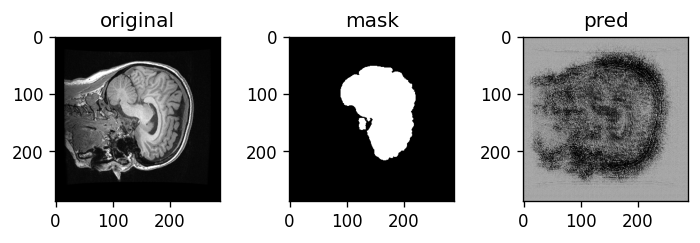

Train: Epoch 0 | Batch: 10 | Combined Loss: 1.3005053997039795 | BCE 0.6727920174598694 | dice_loss 0.6277133226394653
Train: Epoch 0 | Batch: 20 | Combined Loss: 1.1229848861694336 | BCE 0.5924981832504272 | dice_loss 0.5304867029190063
Train: Epoch 0 | Batch: 30 | Combined Loss: 1.068366289138794 | BCE 0.5481855869293213 | dice_loss 0.5201807618141174
Train: Epoch 0 | Batch: 40 | Combined Loss: 1.0106524229049683 | BCE 0.515172004699707 | dice_loss 0.49548041820526123
Train: Epoch 0 | Batch: 50 | Combined Loss: 1.0241100788116455 | BCE 0.5099344253540039 | dice_loss 0.5141757130622864
Train: Epoch 0 | Batch: 60 | Combined Loss: 1.0683391094207764 | BCE 0.5149917602539062 | dice_loss 0.5533473491668701
Train: Epoch 0 | Batch: 70 | Combined Loss: 1.0307540893554688 | BCE 0.5014511942863464 | dice_loss 0.5293028354644775
Train: Epoch 0 | Batch: 80 | Combined Loss: 1.1195638179779053 | BCE 0.5190866589546204 | dice_loss 0.6004772186279297
Train: Epoch 0 | Batch: 90 | Combined Loss: 1.037

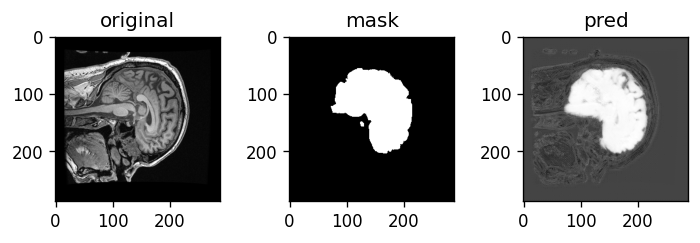

Train: Epoch 0 | Batch: 110 | Combined Loss: 0.8794379234313965 | BCE 0.4511374533176422 | dice_loss 0.42830049991607666
Train: Epoch 0 | Batch: 120 | Combined Loss: 0.9345569610595703 | BCE 0.463088721036911 | dice_loss 0.4714682102203369
Train: Epoch 0 | Batch: 130 | Combined Loss: 1.1266305446624756 | BCE 0.5008929371833801 | dice_loss 0.6257375478744507
Train: Epoch 0 | Batch: 140 | Combined Loss: 0.964365541934967 | BCE 0.46330875158309937 | dice_loss 0.5010567903518677
Train: Epoch 0 | Batch: 150 | Combined Loss: 1.1780009269714355 | BCE 0.5063700079917908 | dice_loss 0.6716309785842896
Train: Epoch 0 | Batch: 160 | Combined Loss: 1.0878427028656006 | BCE 0.4838287830352783 | dice_loss 0.604013979434967
Train: Epoch 0 | Batch: 170 | Combined Loss: 0.8632510900497437 | BCE 0.430279403924942 | dice_loss 0.432971715927124
Train: Epoch 0 | Batch: 180 | Combined Loss: 0.8455312252044678 | BCE 0.4239802360534668 | dice_loss 0.421550989151001
Train: Epoch 0 | Batch: 190 | Combined Loss:

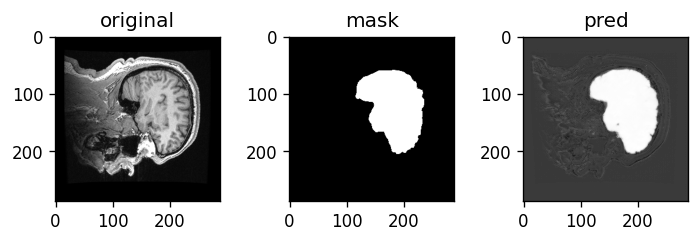

Train: Epoch 0 | Batch: 210 | Combined Loss: 0.9121111631393433 | BCE 0.4419906437397003 | dice_loss 0.47012054920196533
Train: Epoch 0 | Batch: 220 | Combined Loss: 0.9391571283340454 | BCE 0.4365875720977783 | dice_loss 0.5025695562362671
Train: Epoch 0 | Batch: 230 | Combined Loss: 0.8841366767883301 | BCE 0.42401349544525146 | dice_loss 0.4601231813430786
Train: Epoch 0 | Batch: 240 | Combined Loss: 0.9874894618988037 | BCE 0.44332876801490784 | dice_loss 0.5441606640815735
Train: Epoch 0 | Batch: 250 | Combined Loss: 0.7505046725273132 | BCE 0.3865266442298889 | dice_loss 0.3639780282974243
Train: Epoch 0 | Batch: 260 | Combined Loss: 0.893537163734436 | BCE 0.41620540618896484 | dice_loss 0.4773317575454712
Train: Epoch 0 | Batch: 270 | Combined Loss: 0.8502755165100098 | BCE 0.40336504578590393 | dice_loss 0.44691044092178345
Train: Epoch 0 | Batch: 280 | Combined Loss: 0.7388876676559448 | BCE 0.37603995203971863 | dice_loss 0.3628476858139038
Train: Epoch 0 | Batch: 290 | Comb

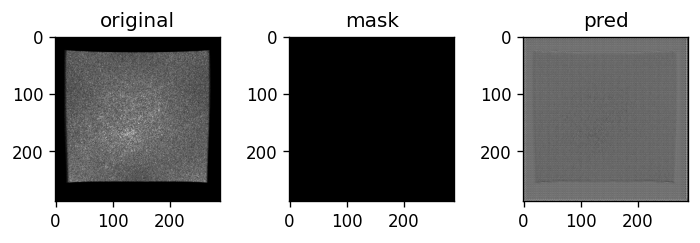

Train: Epoch 0 | Batch: 310 | Combined Loss: 0.8416182994842529 | BCE 0.39334431290626526 | dice_loss 0.44827401638031006
Train: Epoch 0 | Batch: 320 | Combined Loss: 0.8169224262237549 | BCE 0.38587358593940735 | dice_loss 0.43104881048202515
Train: Epoch 0 | Batch: 330 | Combined Loss: 0.7636780142784119 | BCE 0.37143826484680176 | dice_loss 0.3922397494316101
Train: Epoch 0 | Batch: 340 | Combined Loss: 0.7815191745758057 | BCE 0.37291309237480164 | dice_loss 0.40860605239868164
Train: Epoch 0 | Batch: 350 | Combined Loss: 0.7726836204528809 | BCE 0.3688407838344574 | dice_loss 0.4038428068161011
Train: Epoch 0 | Batch: 360 | Combined Loss: 0.631252646446228 | BCE 0.33364683389663696 | dice_loss 0.29760581254959106
Train: Epoch 0 | Batch: 370 | Combined Loss: 0.6734774112701416 | BCE 0.3430628478527069 | dice_loss 0.3304145336151123
Train: Epoch 0 | Batch: 380 | Combined Loss: 0.7244857549667358 | BCE 0.3520152270793915 | dice_loss 0.372470498085022
Train: Epoch 0 | Batch: 390 | Com

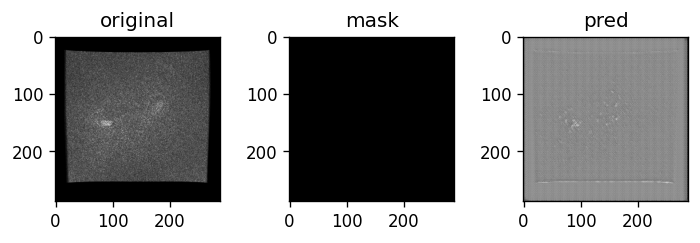

Train: Epoch 0 | Batch: 410 | Combined Loss: 0.764966607093811 | BCE 0.3568226397037506 | dice_loss 0.4081439971923828
Train: Epoch 0 | Batch: 420 | Combined Loss: 0.6545929908752441 | BCE 0.32971951365470886 | dice_loss 0.3248734474182129
Train: Epoch 0 | Batch: 430 | Combined Loss: 0.6895477771759033 | BCE 0.33617913722991943 | dice_loss 0.3533686399459839
Train: Epoch 0 | Batch: 440 | Combined Loss: 0.927777111530304 | BCE 0.3805031180381775 | dice_loss 0.5472739934921265
Train: Epoch 0 | Batch: 450 | Combined Loss: 0.6076575517654419 | BCE 0.3133276700973511 | dice_loss 0.2943298816680908
Train: Epoch 0 | Batch: 460 | Combined Loss: 0.6368979215621948 | BCE 0.3179551661014557 | dice_loss 0.3189427852630615
Train: Epoch 0 | Batch: 470 | Combined Loss: 0.7620646953582764 | BCE 0.3427805006504059 | dice_loss 0.41928422451019287
Train: Epoch 0 | Batch: 480 | Combined Loss: 0.591059684753418 | BCE 0.3040708005428314 | dice_loss 0.28698891401290894
Train: Epoch 0 | Batch: 490 | Combined 

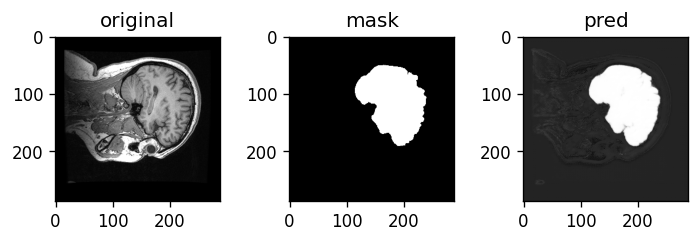

Avg train loss for epoch  --> 0.8627317570179347 | BCE: 0.419998170064372 | dice_loss: 0.44273358842600946
Val: Epoch 0 | Batch: 0 | Combined Loss: 0.6003677845001221 | BCE 0.3154926002025604 | dice_loss 0.28487521409988403


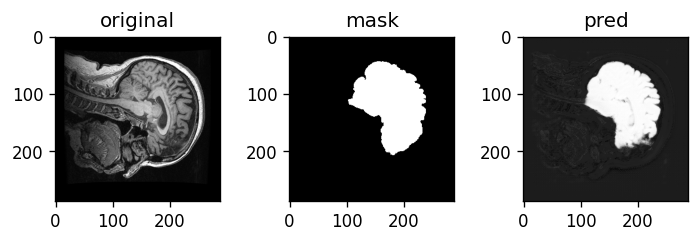

Val: Epoch 0 | Batch: 10 | Combined Loss: 0.6457602977752686 | BCE 0.31779947876930237 | dice_loss 0.3279608488082886
Val: Epoch 0 | Batch: 20 | Combined Loss: 0.66911780834198 | BCE 0.31784793734550476 | dice_loss 0.35126984119415283
Val: Epoch 0 | Batch: 30 | Combined Loss: 0.5876088738441467 | BCE 0.31623679399490356 | dice_loss 0.27137207984924316


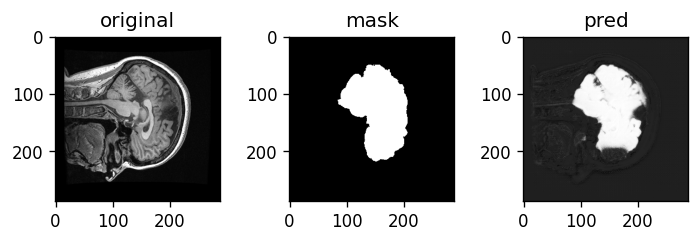

Val: Epoch 0 | Batch: 40 | Combined Loss: 0.6634656190872192 | BCE 0.31726035475730896 | dice_loss 0.3462052345275879
Val: Epoch 0 | Batch: 50 | Combined Loss: 0.7246552109718323 | BCE 0.32299649715423584 | dice_loss 0.40165871381759644
Val: Epoch 0 | Batch: 60 | Combined Loss: 0.7114964723587036 | BCE 0.32298341393470764 | dice_loss 0.38851308822631836


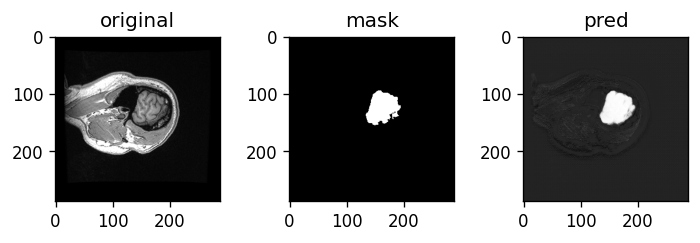

Val: Epoch 0 | Batch: 70 | Combined Loss: 0.6933209896087646 | BCE 0.31843432784080505 | dice_loss 0.374886691570282
Val: Epoch 0 | Batch: 80 | Combined Loss: 0.7314236164093018 | BCE 0.32536646723747253 | dice_loss 0.40605711936950684
Val: Epoch 0 | Batch: 90 | Combined Loss: 0.7502554655075073 | BCE 0.32066571712493896 | dice_loss 0.42958974838256836


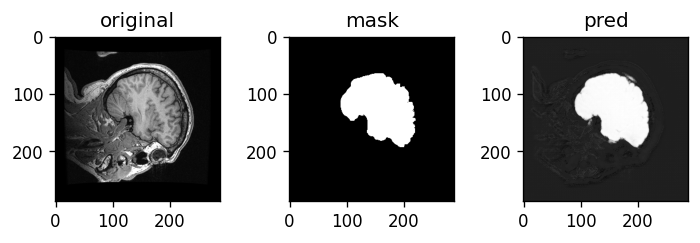

Val: Epoch 0 | Batch: 100 | Combined Loss: 0.5972694754600525 | BCE 0.3132181763648987 | dice_loss 0.2840512990951538
Val: Epoch 0 | Batch: 110 | Combined Loss: 0.6650506258010864 | BCE 0.32033368945121765 | dice_loss 0.34471696615219116
Val: Epoch 0 | Batch: 120 | Combined Loss: 0.6165850162506104 | BCE 0.3159479796886444 | dice_loss 0.30063700675964355


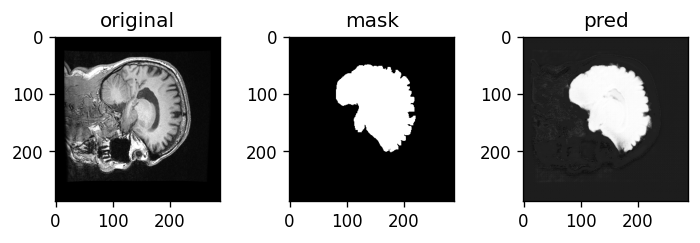

Val: Epoch 0 | Batch: 130 | Combined Loss: 0.6398000121116638 | BCE 0.32238131761550903 | dice_loss 0.3174186944961548
Val: Epoch 0 | Batch: 140 | Combined Loss: 0.612576425075531 | BCE 0.3148452043533325 | dice_loss 0.2977312207221985
Val: Epoch 0 | Batch: 150 | Combined Loss: 0.6842595338821411 | BCE 0.31837040185928345 | dice_loss 0.36588913202285767


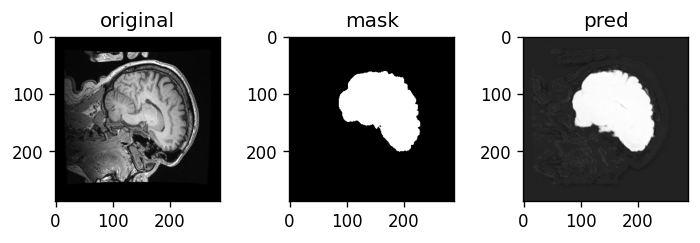

Average val loss for epoch  --> 0.6694518558681011 | BCE: 0.3190915122628212 | dice_loss: 0.35036034546792505
****************************************************************************************************
Train: Epoch 1 | Batch: 0 | Combined Loss: 0.6886501312255859 | BCE 0.32455652952194214 | dice_loss 0.3640936017036438


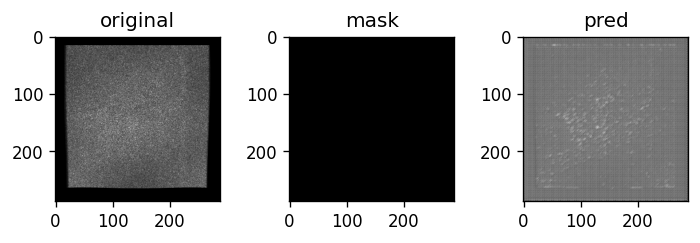

Train: Epoch 1 | Batch: 10 | Combined Loss: 0.5508517026901245 | BCE 0.2905322313308716 | dice_loss 0.26031947135925293
Train: Epoch 1 | Batch: 20 | Combined Loss: 0.6677981615066528 | BCE 0.3135164976119995 | dice_loss 0.3542816638946533
Train: Epoch 1 | Batch: 30 | Combined Loss: 0.7810619473457336 | BCE 0.3352527618408203 | dice_loss 0.44580918550491333
Train: Epoch 1 | Batch: 40 | Combined Loss: 0.6387649774551392 | BCE 0.3042599856853485 | dice_loss 0.33450502157211304
Train: Epoch 1 | Batch: 50 | Combined Loss: 0.5594491958618164 | BCE 0.285774290561676 | dice_loss 0.2736749053001404
Train: Epoch 1 | Batch: 60 | Combined Loss: 0.475975900888443 | BCE 0.26379480957984924 | dice_loss 0.21218109130859375
Train: Epoch 1 | Batch: 70 | Combined Loss: 0.7152409553527832 | BCE 0.3135652244091034 | dice_loss 0.4016757011413574
Train: Epoch 1 | Batch: 80 | Combined Loss: 0.7252830266952515 | BCE 0.3154771029949188 | dice_loss 0.40980589389801025
Train: Epoch 1 | Batch: 90 | Combined Loss: 

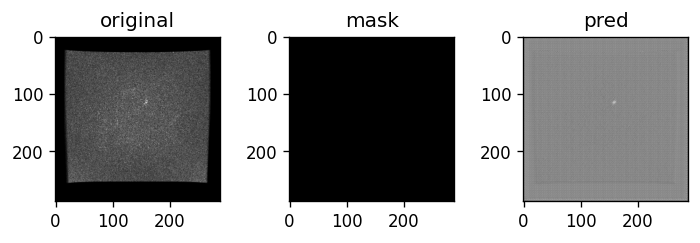

Train: Epoch 1 | Batch: 110 | Combined Loss: 0.5132465362548828 | BCE 0.26699545979499817 | dice_loss 0.24625110626220703
Train: Epoch 1 | Batch: 120 | Combined Loss: 0.640961766242981 | BCE 0.29279932379722595 | dice_loss 0.3481624722480774
Train: Epoch 1 | Batch: 130 | Combined Loss: 0.5413451194763184 | BCE 0.27024248242378235 | dice_loss 0.2711026668548584
Train: Epoch 1 | Batch: 140 | Combined Loss: 0.48826950788497925 | BCE 0.25712835788726807 | dice_loss 0.23114114999771118
Train: Epoch 1 | Batch: 150 | Combined Loss: 0.4912533164024353 | BCE 0.25806206464767456 | dice_loss 0.23319125175476074
Train: Epoch 1 | Batch: 160 | Combined Loss: 0.6058385372161865 | BCE 0.2817077934741974 | dice_loss 0.3241307735443115
Train: Epoch 1 | Batch: 170 | Combined Loss: 0.46700119972229004 | BCE 0.2507254481315613 | dice_loss 0.21627575159072876
Train: Epoch 1 | Batch: 180 | Combined Loss: 0.5510114431381226 | BCE 0.267598956823349 | dice_loss 0.28341245651245117
Train: Epoch 1 | Batch: 190 | 

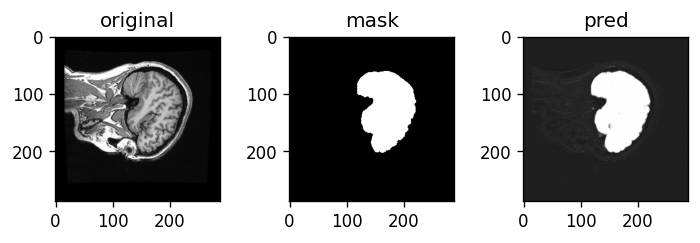

Train: Epoch 1 | Batch: 210 | Combined Loss: 0.5782516598701477 | BCE 0.2688567638397217 | dice_loss 0.309394896030426
Train: Epoch 1 | Batch: 220 | Combined Loss: 0.43830686807632446 | BCE 0.2359732836484909 | dice_loss 0.20233356952667236
Train: Epoch 1 | Batch: 230 | Combined Loss: 0.5881460309028625 | BCE 0.267456591129303 | dice_loss 0.32068943977355957
Train: Epoch 1 | Batch: 240 | Combined Loss: 0.5287591218948364 | BCE 0.25464826822280884 | dice_loss 0.2741108536720276
Train: Epoch 1 | Batch: 250 | Combined Loss: 0.491780549287796 | BCE 0.24478766322135925 | dice_loss 0.24699288606643677
Train: Epoch 1 | Batch: 260 | Combined Loss: 0.44160932302474976 | BCE 0.23408512771129608 | dice_loss 0.20752418041229248
Train: Epoch 1 | Batch: 270 | Combined Loss: 0.4813374876976013 | BCE 0.24123543500900269 | dice_loss 0.24010205268859863
Train: Epoch 1 | Batch: 280 | Combined Loss: 0.5851024389266968 | BCE 0.259564071893692 | dice_loss 0.32553839683532715
Train: Epoch 1 | Batch: 290 | Co

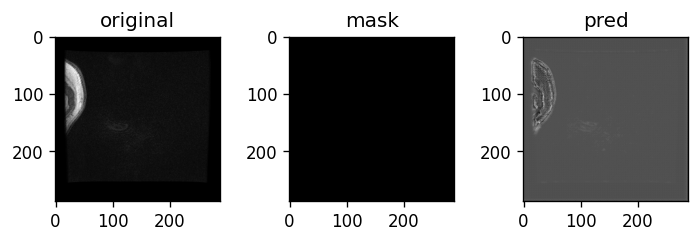

Train: Epoch 1 | Batch: 310 | Combined Loss: 0.4522865414619446 | BCE 0.230423703789711 | dice_loss 0.22186285257339478
Train: Epoch 1 | Batch: 320 | Combined Loss: 0.4853792190551758 | BCE 0.23641645908355713 | dice_loss 0.24896275997161865
Train: Epoch 1 | Batch: 330 | Combined Loss: 0.30009132623672485 | BCE 0.18814130127429962 | dice_loss 0.11195003986358643
Train: Epoch 1 | Batch: 340 | Combined Loss: 0.4019690155982971 | BCE 0.21524594724178314 | dice_loss 0.18672305345535278
Train: Epoch 1 | Batch: 350 | Combined Loss: 0.4827691614627838 | BCE 0.23245128989219666 | dice_loss 0.25031787157058716
Train: Epoch 1 | Batch: 360 | Combined Loss: 0.3657912611961365 | BCE 0.20458944141864777 | dice_loss 0.1612018346786499
Train: Epoch 1 | Batch: 370 | Combined Loss: 0.49276918172836304 | BCE 0.23314064741134644 | dice_loss 0.2596285343170166
Train: Epoch 1 | Batch: 380 | Combined Loss: 0.4372124671936035 | BCE 0.21992535889148712 | dice_loss 0.2172871232032776
Train: Epoch 1 | Batch: 390

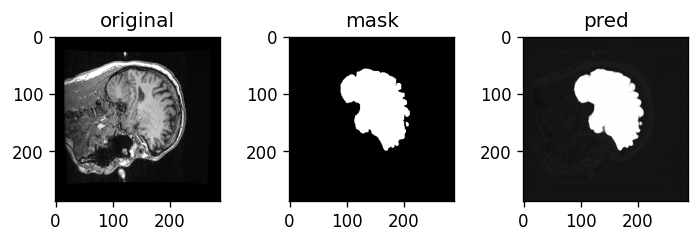

Train: Epoch 1 | Batch: 410 | Combined Loss: 0.43516457080841064 | BCE 0.21608896553516388 | dice_loss 0.21907562017440796
Train: Epoch 1 | Batch: 420 | Combined Loss: 0.3105674982070923 | BCE 0.18493397533893585 | dice_loss 0.12563353776931763
Train: Epoch 1 | Batch: 430 | Combined Loss: 0.37003880739212036 | BCE 0.19947953522205353 | dice_loss 0.17055928707122803
Train: Epoch 1 | Batch: 440 | Combined Loss: 0.42619776725769043 | BCE 0.21159781515598297 | dice_loss 0.21459996700286865
Train: Epoch 1 | Batch: 450 | Combined Loss: 0.49017488956451416 | BCE 0.22351215779781342 | dice_loss 0.26666271686553955
Train: Epoch 1 | Batch: 460 | Combined Loss: 0.3539286255836487 | BCE 0.1940748244524002 | dice_loss 0.15985381603240967
Train: Epoch 1 | Batch: 470 | Combined Loss: 0.36855193972587585 | BCE 0.1969127357006073 | dice_loss 0.17163920402526855
Train: Epoch 1 | Batch: 480 | Combined Loss: 0.5348864793777466 | BCE 0.22734305262565613 | dice_loss 0.30754339694976807
Train: Epoch 1 | Batc

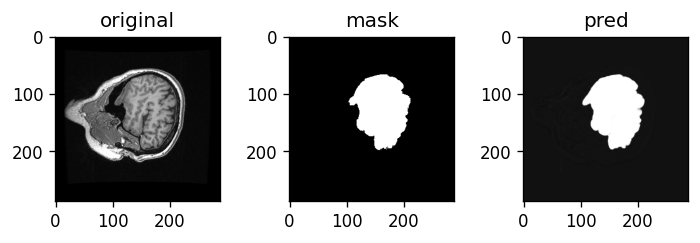

Avg train loss for epoch  --> 0.5012088585276848 | BCE: 0.2479380648656796 | dice_loss: 0.25327079416263715
Val: Epoch 1 | Batch: 0 | Combined Loss: 0.40094077587127686 | BCE 0.20253033936023712 | dice_loss 0.19841045141220093


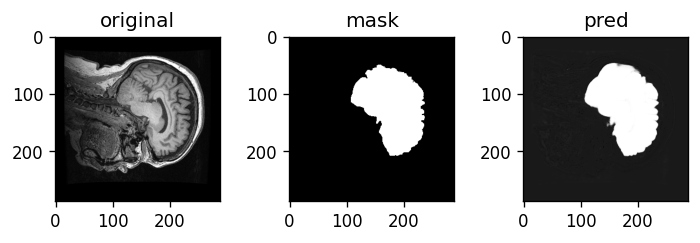

Val: Epoch 1 | Batch: 10 | Combined Loss: 0.331024169921875 | BCE 0.19498467445373535 | dice_loss 0.13603949546813965
Val: Epoch 1 | Batch: 20 | Combined Loss: 0.43668797612190247 | BCE 0.2012297809123993 | dice_loss 0.23545819520950317
Val: Epoch 1 | Batch: 30 | Combined Loss: 0.383728563785553 | BCE 0.1986960917711258 | dice_loss 0.18503248691558838


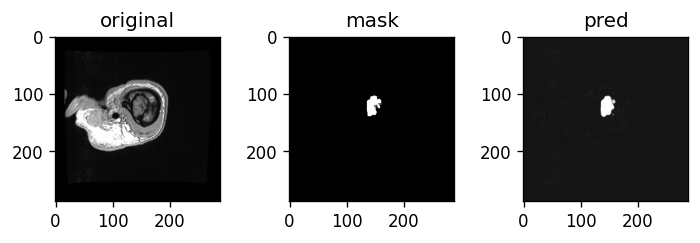

Val: Epoch 1 | Batch: 40 | Combined Loss: 0.4087909162044525 | BCE 0.2013353407382965 | dice_loss 0.207455575466156
Val: Epoch 1 | Batch: 50 | Combined Loss: 0.3726857900619507 | BCE 0.19793981313705444 | dice_loss 0.17474597692489624
Val: Epoch 1 | Batch: 60 | Combined Loss: 0.31474971771240234 | BCE 0.19238384068012238 | dice_loss 0.12236589193344116


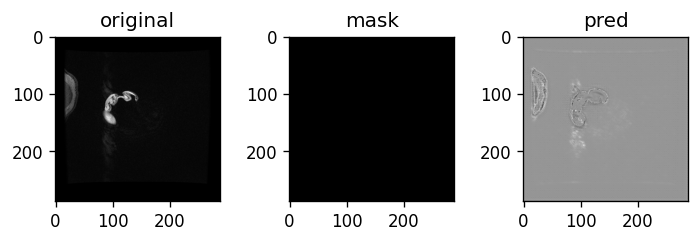

Val: Epoch 1 | Batch: 70 | Combined Loss: 0.370053231716156 | BCE 0.19981907308101654 | dice_loss 0.17023414373397827
Val: Epoch 1 | Batch: 80 | Combined Loss: 0.37935712933540344 | BCE 0.1989881694316864 | dice_loss 0.18036895990371704
Val: Epoch 1 | Batch: 90 | Combined Loss: 0.3639566898345947 | BCE 0.1988823562860489 | dice_loss 0.16507434844970703


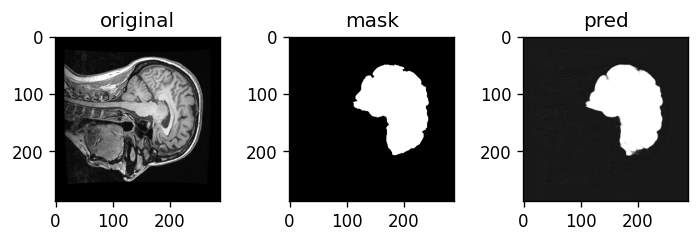

Val: Epoch 1 | Batch: 100 | Combined Loss: 0.3296981155872345 | BCE 0.1958199441432953 | dice_loss 0.1338781714439392
Val: Epoch 1 | Batch: 110 | Combined Loss: 0.36590105295181274 | BCE 0.20019733905792236 | dice_loss 0.16570371389389038
Val: Epoch 1 | Batch: 120 | Combined Loss: 0.4091220498085022 | BCE 0.20020557940006256 | dice_loss 0.20891648530960083


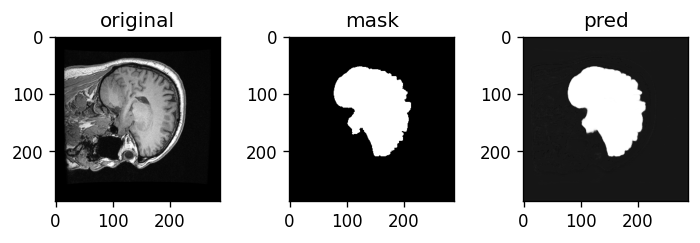

Val: Epoch 1 | Batch: 130 | Combined Loss: 0.3772513270378113 | BCE 0.19862373173236847 | dice_loss 0.178627610206604
Val: Epoch 1 | Batch: 140 | Combined Loss: 0.3732612133026123 | BCE 0.19878464937210083 | dice_loss 0.17447656393051147
Val: Epoch 1 | Batch: 150 | Combined Loss: 0.32056814432144165 | BCE 0.19471709430217743 | dice_loss 0.12585103511810303


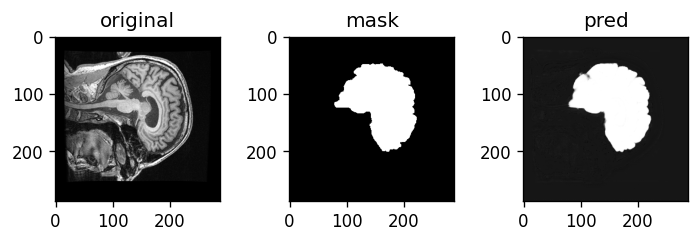

Average val loss for epoch  --> 0.38864352833479643 | BCE: 0.1997988018207252 | dice_loss: 0.18884472735226154
****************************************************************************************************
Train: Epoch 2 | Batch: 0 | Combined Loss: 0.37065988779067993 | BCE 0.19371072947978973 | dice_loss 0.176949143409729


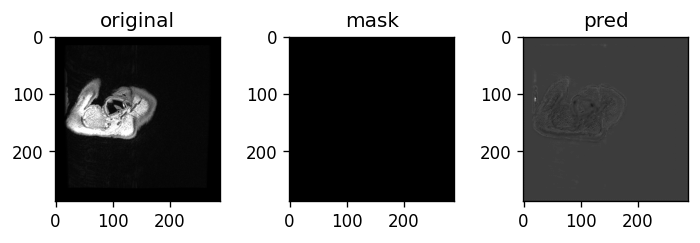

Train: Epoch 2 | Batch: 10 | Combined Loss: 0.32577431201934814 | BCE 0.18182629346847534 | dice_loss 0.1439480185508728
Train: Epoch 2 | Batch: 20 | Combined Loss: 0.3543090224266052 | BCE 0.18830011785030365 | dice_loss 0.16600888967514038
Train: Epoch 2 | Batch: 30 | Combined Loss: 0.32489001750946045 | BCE 0.18097078800201416 | dice_loss 0.1439192295074463
Train: Epoch 2 | Batch: 40 | Combined Loss: 0.427684485912323 | BCE 0.2024078369140625 | dice_loss 0.2252766489982605
Train: Epoch 2 | Batch: 50 | Combined Loss: 0.3786243796348572 | BCE 0.19125182926654816 | dice_loss 0.18737256526947021
Train: Epoch 2 | Batch: 60 | Combined Loss: 0.43032142519950867 | BCE 0.20058700442314148 | dice_loss 0.2297344207763672
Train: Epoch 2 | Batch: 70 | Combined Loss: 0.3187342882156372 | BCE 0.17657677829265594 | dice_loss 0.14215749502182007
Train: Epoch 2 | Batch: 80 | Combined Loss: 0.40479403734207153 | BCE 0.19496089220046997 | dice_loss 0.20983314514160156
Train: Epoch 2 | Batch: 90 | Combi

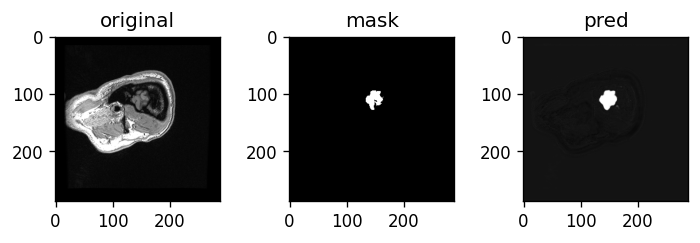

Train: Epoch 2 | Batch: 110 | Combined Loss: 0.2650880217552185 | BCE 0.15955400466918945 | dice_loss 0.10553401708602905
Train: Epoch 2 | Batch: 120 | Combined Loss: 0.4261985421180725 | BCE 0.19524550437927246 | dice_loss 0.23095303773880005
Train: Epoch 2 | Batch: 130 | Combined Loss: 0.26859739422798157 | BCE 0.15945646166801453 | dice_loss 0.10914093255996704
Train: Epoch 2 | Batch: 140 | Combined Loss: 0.3735230565071106 | BCE 0.18460118770599365 | dice_loss 0.18892186880111694
Train: Epoch 2 | Batch: 150 | Combined Loss: 0.36019062995910645 | BCE 0.180747851729393 | dice_loss 0.17944276332855225
Train: Epoch 2 | Batch: 160 | Combined Loss: 0.3259051740169525 | BCE 0.17226579785346985 | dice_loss 0.15363937616348267
Train: Epoch 2 | Batch: 170 | Combined Loss: 0.23783664405345917 | BCE 0.14826159179210663 | dice_loss 0.08957505226135254
Train: Epoch 2 | Batch: 180 | Combined Loss: 0.2547312378883362 | BCE 0.1528977006673813 | dice_loss 0.1018335223197937
Train: Epoch 2 | Batch: 1

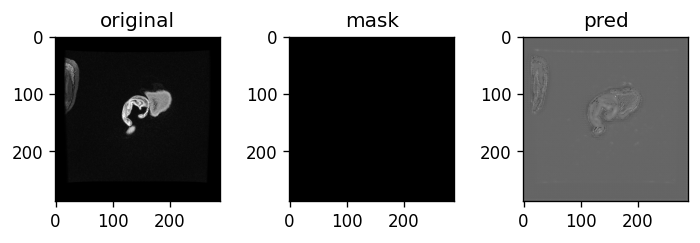

Train: Epoch 2 | Batch: 210 | Combined Loss: 0.290757417678833 | BCE 0.16064845025539398 | dice_loss 0.13010895252227783
Train: Epoch 2 | Batch: 220 | Combined Loss: 0.2646889388561249 | BCE 0.1534765660762787 | dice_loss 0.11121237277984619
Train: Epoch 2 | Batch: 230 | Combined Loss: 0.34888187050819397 | BCE 0.17206117510795593 | dice_loss 0.17682069540023804
Train: Epoch 2 | Batch: 240 | Combined Loss: 0.24097347259521484 | BCE 0.14578872919082642 | dice_loss 0.09518474340438843
Train: Epoch 2 | Batch: 250 | Combined Loss: 0.4502480924129486 | BCE 0.19005313515663147 | dice_loss 0.26019495725631714
Train: Epoch 2 | Batch: 260 | Combined Loss: 0.325003445148468 | BCE 0.16764360666275024 | dice_loss 0.15735983848571777
Train: Epoch 2 | Batch: 270 | Combined Loss: 0.2060660421848297 | BCE 0.13345155119895935 | dice_loss 0.07261449098587036
Train: Epoch 2 | Batch: 280 | Combined Loss: 0.24912673234939575 | BCE 0.14606499671936035 | dice_loss 0.1030617356300354
Train: Epoch 2 | Batch: 2

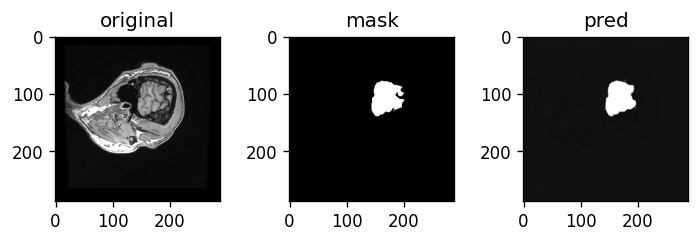

Train: Epoch 2 | Batch: 310 | Combined Loss: 0.21369317173957825 | BCE 0.1343962848186493 | dice_loss 0.07929688692092896
Train: Epoch 2 | Batch: 320 | Combined Loss: 0.2726232409477234 | BCE 0.15072502195835114 | dice_loss 0.12189823389053345
Train: Epoch 2 | Batch: 330 | Combined Loss: 0.2548230290412903 | BCE 0.1463366001844406 | dice_loss 0.10848641395568848
Train: Epoch 2 | Batch: 340 | Combined Loss: 0.1889043152332306 | BCE 0.1251588761806488 | dice_loss 0.06374543905258179
Train: Epoch 2 | Batch: 350 | Combined Loss: 0.21881099045276642 | BCE 0.13429392874240875 | dice_loss 0.08451706171035767
Train: Epoch 2 | Batch: 360 | Combined Loss: 0.2880045175552368 | BCE 0.15248526632785797 | dice_loss 0.13551926612854004
Train: Epoch 2 | Batch: 370 | Combined Loss: 0.43377089500427246 | BCE 0.17763803899288177 | dice_loss 0.2561328411102295
Train: Epoch 2 | Batch: 380 | Combined Loss: 0.2632850110530853 | BCE 0.14557847380638123 | dice_loss 0.1177065372467041
Train: Epoch 2 | Batch: 39

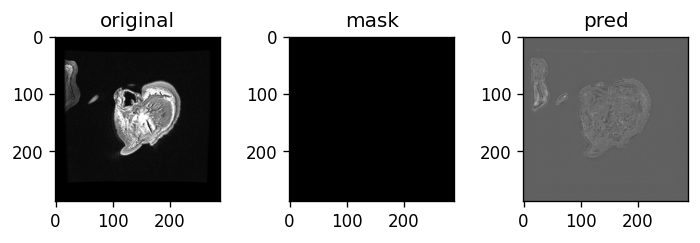

Train: Epoch 2 | Batch: 410 | Combined Loss: 0.23841017484664917 | BCE 0.13862621784210205 | dice_loss 0.09978395700454712
Train: Epoch 2 | Batch: 420 | Combined Loss: 0.22339031100273132 | BCE 0.1332273781299591 | dice_loss 0.09016293287277222
Train: Epoch 2 | Batch: 430 | Combined Loss: 0.25589147210121155 | BCE 0.1422981321811676 | dice_loss 0.11359333992004395
Train: Epoch 2 | Batch: 440 | Combined Loss: 0.2249782681465149 | BCE 0.13369256258010864 | dice_loss 0.09128570556640625
Train: Epoch 2 | Batch: 450 | Combined Loss: 0.23363202810287476 | BCE 0.13551771640777588 | dice_loss 0.09811431169509888
Train: Epoch 2 | Batch: 460 | Combined Loss: 0.2316179722547531 | BCE 0.13404302299022675 | dice_loss 0.09757494926452637
Train: Epoch 2 | Batch: 470 | Combined Loss: 0.23906081914901733 | BCE 0.1354244351387024 | dice_loss 0.10363638401031494
Train: Epoch 2 | Batch: 480 | Combined Loss: 0.19715338945388794 | BCE 0.12323594093322754 | dice_loss 0.0739174485206604
Train: Epoch 2 | Batch

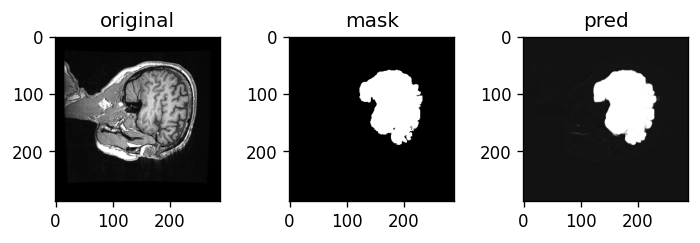

Avg train loss for epoch  --> 0.29863021407909546 | BCE: 0.16020176699569103 | dice_loss: 0.13842844668584378
Val: Epoch 2 | Batch: 0 | Combined Loss: 0.21271207928657532 | BCE 0.1298767626285553 | dice_loss 0.08283531665802002


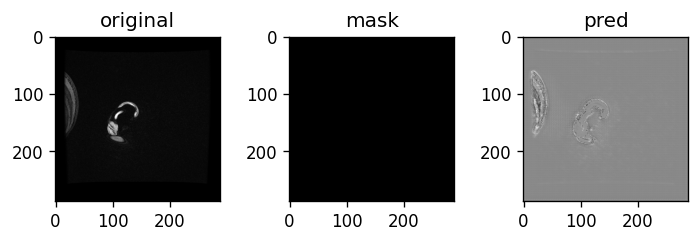

Val: Epoch 2 | Batch: 10 | Combined Loss: 0.2624083161354065 | BCE 0.13258497416973114 | dice_loss 0.12982332706451416
Val: Epoch 2 | Batch: 20 | Combined Loss: 0.23722468316555023 | BCE 0.1319916695356369 | dice_loss 0.10523301362991333
Val: Epoch 2 | Batch: 30 | Combined Loss: 0.22321797907352448 | BCE 0.13176174461841583 | dice_loss 0.09145623445510864


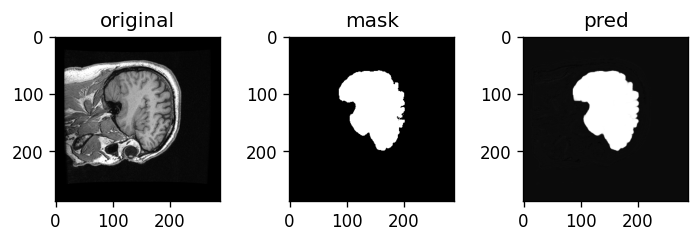

Val: Epoch 2 | Batch: 40 | Combined Loss: 0.21878142654895782 | BCE 0.1301802545785904 | dice_loss 0.08860117197036743
Val: Epoch 2 | Batch: 50 | Combined Loss: 0.2972106635570526 | BCE 0.1341749131679535 | dice_loss 0.16303575038909912
Val: Epoch 2 | Batch: 60 | Combined Loss: 0.251989483833313 | BCE 0.13259488344192505 | dice_loss 0.11939460039138794


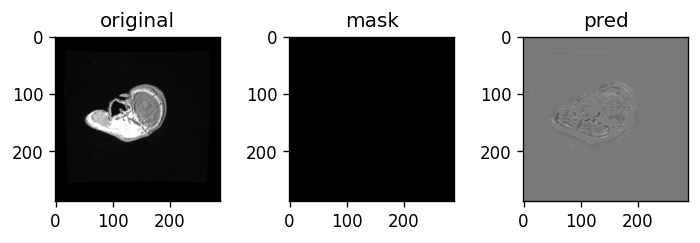

Val: Epoch 2 | Batch: 70 | Combined Loss: 0.33206722140312195 | BCE 0.13352110981941223 | dice_loss 0.19854611158370972
Val: Epoch 2 | Batch: 80 | Combined Loss: 0.22542572021484375 | BCE 0.13110220432281494 | dice_loss 0.09432351589202881
Val: Epoch 2 | Batch: 90 | Combined Loss: 0.21616891026496887 | BCE 0.12958040833473206 | dice_loss 0.08658850193023682


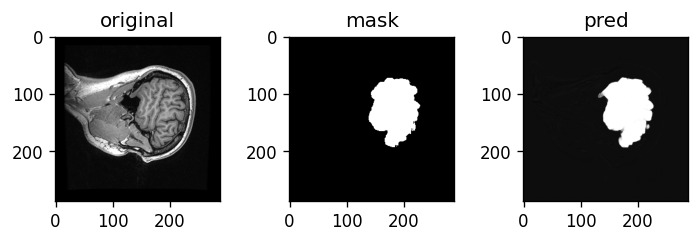

Val: Epoch 2 | Batch: 100 | Combined Loss: 0.22441807389259338 | BCE 0.1311033070087433 | dice_loss 0.0933147668838501
Val: Epoch 2 | Batch: 110 | Combined Loss: 0.2415553331375122 | BCE 0.1309664249420166 | dice_loss 0.1105889081954956
Val: Epoch 2 | Batch: 120 | Combined Loss: 0.26093342900276184 | BCE 0.13405820727348328 | dice_loss 0.12687522172927856


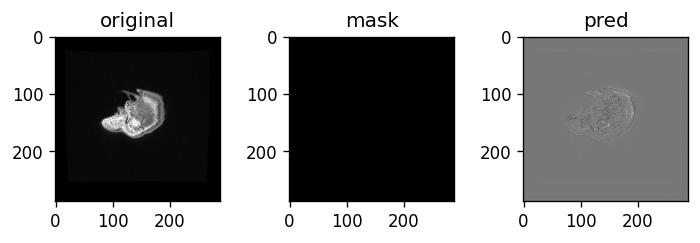

Val: Epoch 2 | Batch: 130 | Combined Loss: 0.2192002534866333 | BCE 0.13029593229293823 | dice_loss 0.08890432119369507
Val: Epoch 2 | Batch: 140 | Combined Loss: 0.23044858872890472 | BCE 0.1307927817106247 | dice_loss 0.09965580701828003
Val: Epoch 2 | Batch: 150 | Combined Loss: 0.21692803502082825 | BCE 0.12957653403282166 | dice_loss 0.08735150098800659


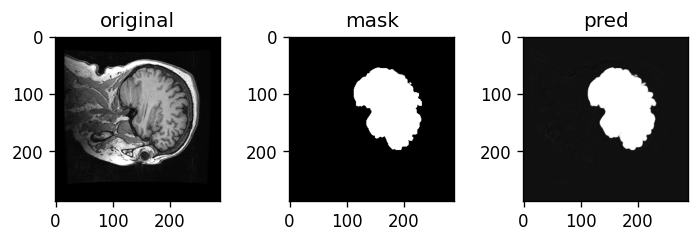

Average val loss for epoch  --> 0.23214643383398653 | BCE: 0.13106132615357638 | dice_loss: 0.10108510740101337
****************************************************************************************************
Train: Epoch 3 | Batch: 0 | Combined Loss: 0.18726728856563568 | BCE 0.11940722167491913 | dice_loss 0.06786006689071655


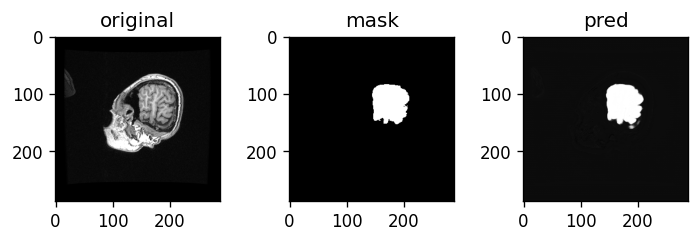

Train: Epoch 3 | Batch: 10 | Combined Loss: 0.22596010565757751 | BCE 0.1313190758228302 | dice_loss 0.09464102983474731
Train: Epoch 3 | Batch: 20 | Combined Loss: 0.33401626348495483 | BCE 0.15409648418426514 | dice_loss 0.1799197793006897
Train: Epoch 3 | Batch: 30 | Combined Loss: 0.2681007981300354 | BCE 0.13959382474422455 | dice_loss 0.12850695848464966
Train: Epoch 3 | Batch: 40 | Combined Loss: 0.4048346281051636 | BCE 0.1625157594680786 | dice_loss 0.24231886863708496
Train: Epoch 3 | Batch: 50 | Combined Loss: 0.20654290914535522 | BCE 0.12349015474319458 | dice_loss 0.08305275440216064
Train: Epoch 3 | Batch: 60 | Combined Loss: 0.2148093581199646 | BCE 0.12591403722763062 | dice_loss 0.08889532089233398
Train: Epoch 3 | Batch: 70 | Combined Loss: 0.26611995697021484 | BCE 0.13854871690273285 | dice_loss 0.1275712251663208
Train: Epoch 3 | Batch: 80 | Combined Loss: 0.23132836818695068 | BCE 0.12955725193023682 | dice_loss 0.10177111625671387
Train: Epoch 3 | Batch: 90 | Co

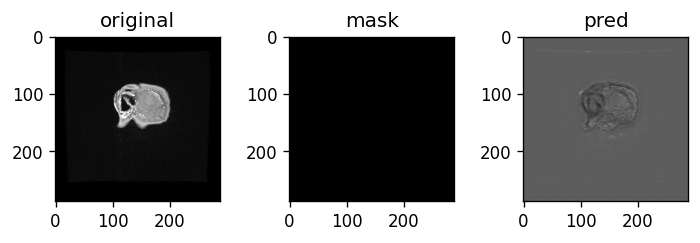

Train: Epoch 3 | Batch: 110 | Combined Loss: 0.21326887607574463 | BCE 0.12339992076158524 | dice_loss 0.08986896276473999
Train: Epoch 3 | Batch: 120 | Combined Loss: 0.29768937826156616 | BCE 0.14141638576984406 | dice_loss 0.1562730073928833
Train: Epoch 3 | Batch: 130 | Combined Loss: 0.19084426760673523 | BCE 0.11626985669136047 | dice_loss 0.07457441091537476
Train: Epoch 3 | Batch: 140 | Combined Loss: 0.1766984760761261 | BCE 0.11153557896614075 | dice_loss 0.06516289710998535
Train: Epoch 3 | Batch: 150 | Combined Loss: 0.15453535318374634 | BCE 0.10373377054929733 | dice_loss 0.05080157518386841
Train: Epoch 3 | Batch: 160 | Combined Loss: 0.19926628470420837 | BCE 0.11812159419059753 | dice_loss 0.08114469051361084
Train: Epoch 3 | Batch: 170 | Combined Loss: 0.2143530696630478 | BCE 0.12177400290966034 | dice_loss 0.09257906675338745
Train: Epoch 3 | Batch: 180 | Combined Loss: 0.21643602848052979 | BCE 0.12197518348693848 | dice_loss 0.09446084499359131
Train: Epoch 3 | Ba

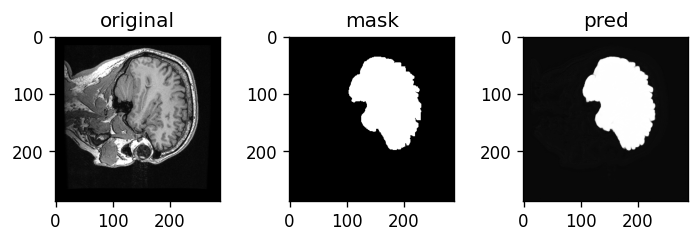

Train: Epoch 3 | Batch: 210 | Combined Loss: 0.17940524220466614 | BCE 0.11102970689535141 | dice_loss 0.06837552785873413
Train: Epoch 3 | Batch: 220 | Combined Loss: 0.20729483664035797 | BCE 0.11784280836582184 | dice_loss 0.08945202827453613
Train: Epoch 3 | Batch: 230 | Combined Loss: 0.20443180203437805 | BCE 0.11717960983514786 | dice_loss 0.08725219964981079
Train: Epoch 3 | Batch: 240 | Combined Loss: 0.18166637420654297 | BCE 0.11099178344011307 | dice_loss 0.0706745982170105
Train: Epoch 3 | Batch: 250 | Combined Loss: 0.19770115613937378 | BCE 0.11469428986310959 | dice_loss 0.0830068588256836
Train: Epoch 3 | Batch: 260 | Combined Loss: 0.24099025130271912 | BCE 0.12489507347345352 | dice_loss 0.11609518527984619
Train: Epoch 3 | Batch: 270 | Combined Loss: 0.17873862385749817 | BCE 0.10860244184732437 | dice_loss 0.0701361894607544
Train: Epoch 3 | Batch: 280 | Combined Loss: 0.21799105405807495 | BCE 0.11887692660093307 | dice_loss 0.09911412000656128
Train: Epoch 3 | Ba

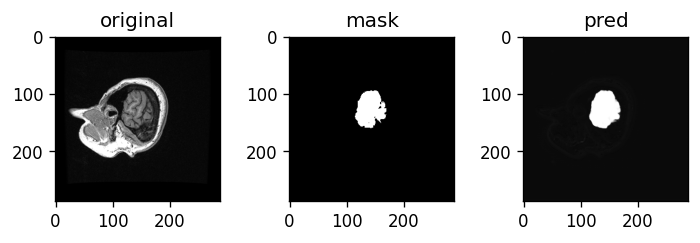

Train: Epoch 3 | Batch: 310 | Combined Loss: 0.15611791610717773 | BCE 0.10039132088422775 | dice_loss 0.055726587772369385
Train: Epoch 3 | Batch: 320 | Combined Loss: 0.18858087062835693 | BCE 0.11049122363328934 | dice_loss 0.0780896544456482
Train: Epoch 3 | Batch: 330 | Combined Loss: 0.1588059961795807 | BCE 0.10088487714529037 | dice_loss 0.05792111158370972
Train: Epoch 3 | Batch: 340 | Combined Loss: 0.18811094760894775 | BCE 0.10921890288591385 | dice_loss 0.0788920521736145
Train: Epoch 3 | Batch: 350 | Combined Loss: 0.20485448837280273 | BCE 0.1131439134478569 | dice_loss 0.09171056747436523
Train: Epoch 3 | Batch: 360 | Combined Loss: 0.12731805443763733 | BCE 0.08870408684015274 | dice_loss 0.038613975048065186
Train: Epoch 3 | Batch: 370 | Combined Loss: 0.15763819217681885 | BCE 0.09961866587400436 | dice_loss 0.05801951885223389
Train: Epoch 3 | Batch: 380 | Combined Loss: 0.16764524579048157 | BCE 0.10256030410528183 | dice_loss 0.06508493423461914
Train: Epoch 3 | B

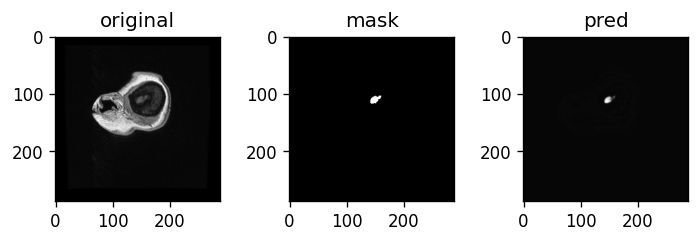

Train: Epoch 3 | Batch: 410 | Combined Loss: 0.1459084451198578 | BCE 0.09480031579732895 | dice_loss 0.05110812187194824
Train: Epoch 3 | Batch: 420 | Combined Loss: 0.1726294457912445 | BCE 0.10287938266992569 | dice_loss 0.06975007057189941
Train: Epoch 3 | Batch: 430 | Combined Loss: 0.16362768411636353 | BCE 0.10029399394989014 | dice_loss 0.06333369016647339
Train: Epoch 3 | Batch: 440 | Combined Loss: 0.22104060649871826 | BCE 0.11472750455141068 | dice_loss 0.10631310939788818
Train: Epoch 3 | Batch: 450 | Combined Loss: 0.16592326760292053 | BCE 0.10025604814291 | dice_loss 0.06566721200942993
Train: Epoch 3 | Batch: 460 | Combined Loss: 0.14409351348876953 | BCE 0.093077652156353 | dice_loss 0.05101585388183594
Train: Epoch 3 | Batch: 470 | Combined Loss: 0.11745365709066391 | BCE 0.08275225013494492 | dice_loss 0.034701406955718994
Train: Epoch 3 | Batch: 480 | Combined Loss: 0.14678359031677246 | BCE 0.09368395060300827 | dice_loss 0.053099632263183594
Train: Epoch 3 | Batc

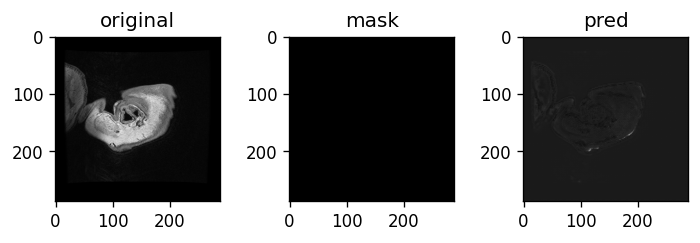

Avg train loss for epoch  --> 0.19373597571324455 | BCE: 0.1126369459208528 | dice_loss: 0.08109902970404494
Val: Epoch 3 | Batch: 0 | Combined Loss: 0.1511937379837036 | BCE 0.09695559740066528 | dice_loss 0.05423814058303833


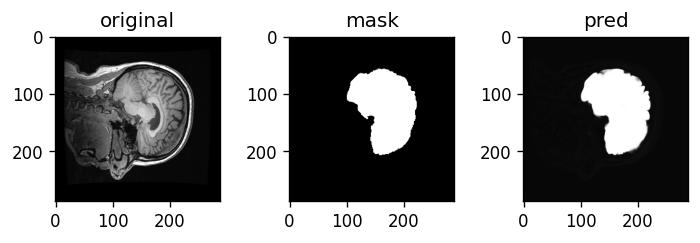

Val: Epoch 3 | Batch: 10 | Combined Loss: 0.15050241351127625 | BCE 0.09715685248374939 | dice_loss 0.053345561027526855
Val: Epoch 3 | Batch: 20 | Combined Loss: 0.15675856173038483 | BCE 0.09645701944828033 | dice_loss 0.06030154228210449
Val: Epoch 3 | Batch: 30 | Combined Loss: 0.2068786472082138 | BCE 0.09834007918834686 | dice_loss 0.10853856801986694


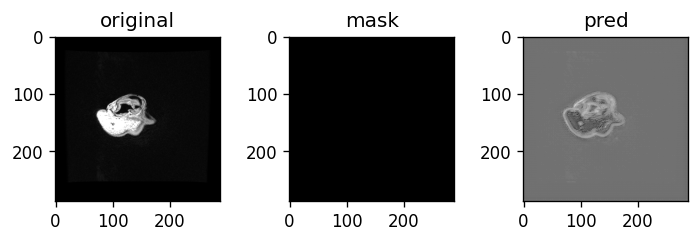

Val: Epoch 3 | Batch: 40 | Combined Loss: 0.16664326190948486 | BCE 0.09602248668670654 | dice_loss 0.07062077522277832
Val: Epoch 3 | Batch: 50 | Combined Loss: 0.14401549100875854 | BCE 0.094562828540802 | dice_loss 0.04945266246795654
Val: Epoch 3 | Batch: 60 | Combined Loss: 0.14731261134147644 | BCE 0.09536997228860855 | dice_loss 0.051942646503448486


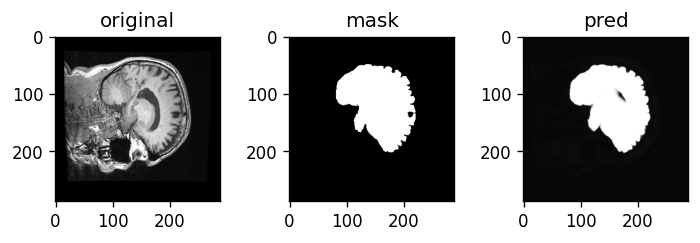

Val: Epoch 3 | Batch: 70 | Combined Loss: 0.15787112712860107 | BCE 0.09627091139554977 | dice_loss 0.0616002082824707
Val: Epoch 3 | Batch: 80 | Combined Loss: 0.15364131331443787 | BCE 0.09599611908197403 | dice_loss 0.057645201683044434
Val: Epoch 3 | Batch: 90 | Combined Loss: 0.15752479434013367 | BCE 0.09765265136957169 | dice_loss 0.05987215042114258


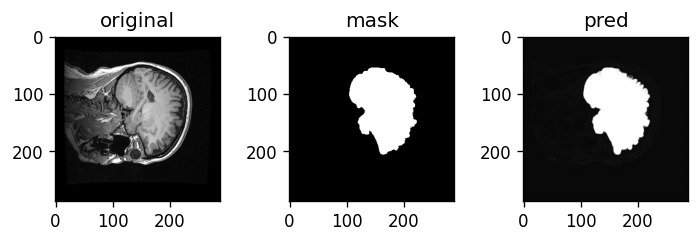

Val: Epoch 3 | Batch: 100 | Combined Loss: 0.14410637319087982 | BCE 0.09679041802883148 | dice_loss 0.04731595516204834
Val: Epoch 3 | Batch: 110 | Combined Loss: 0.15322665870189667 | BCE 0.09577427804470062 | dice_loss 0.057452380657196045
Val: Epoch 3 | Batch: 120 | Combined Loss: 0.15169620513916016 | BCE 0.09712754935026169 | dice_loss 0.05456864833831787


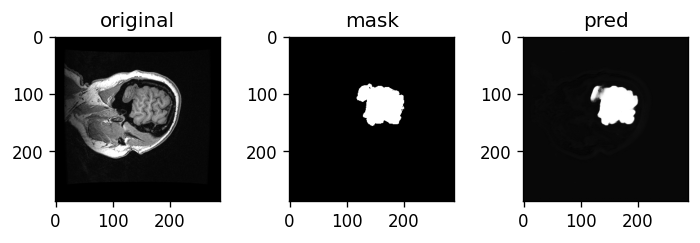

Val: Epoch 3 | Batch: 130 | Combined Loss: 0.15510737895965576 | BCE 0.09530484676361084 | dice_loss 0.05980253219604492
Val: Epoch 3 | Batch: 140 | Combined Loss: 0.2229073941707611 | BCE 0.09643921256065369 | dice_loss 0.12646818161010742
Val: Epoch 3 | Batch: 150 | Combined Loss: 0.21190285682678223 | BCE 0.10175938159227371 | dice_loss 0.11014348268508911


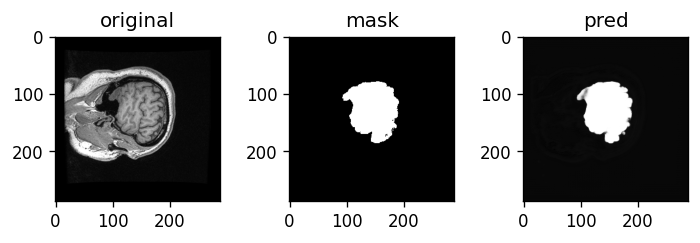

Average val loss for epoch  --> 0.16015123575925827 | BCE: 0.09636330823414027 | dice_loss: 0.06378792710602284
****************************************************************************************************
Train: Epoch 4 | Batch: 0 | Combined Loss: 0.1671590954065323 | BCE 0.09934206306934357 | dice_loss 0.06781703233718872


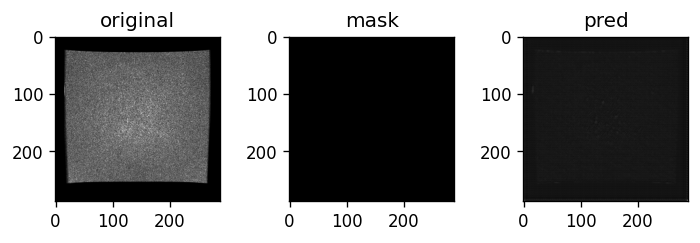

Train: Epoch 4 | Batch: 10 | Combined Loss: 0.13213522732257843 | BCE 0.08786679804325104 | dice_loss 0.04426842927932739
Train: Epoch 4 | Batch: 20 | Combined Loss: 0.13859140872955322 | BCE 0.09008979052305222 | dice_loss 0.04850161075592041
Train: Epoch 4 | Batch: 30 | Combined Loss: 0.1508159339427948 | BCE 0.09403596073389053 | dice_loss 0.05677998065948486
Train: Epoch 4 | Batch: 40 | Combined Loss: 0.22142145037651062 | BCE 0.11099515110254288 | dice_loss 0.11042630672454834
Train: Epoch 4 | Batch: 50 | Combined Loss: 0.16111989319324493 | BCE 0.0974348932504654 | dice_loss 0.06368499994277954
Train: Epoch 4 | Batch: 60 | Combined Loss: 0.17054113745689392 | BCE 0.09978000074625015 | dice_loss 0.07076114416122437
Train: Epoch 4 | Batch: 70 | Combined Loss: 0.21258601546287537 | BCE 0.11665650457143784 | dice_loss 0.09592950344085693
Train: Epoch 4 | Batch: 80 | Combined Loss: 0.1781221628189087 | BCE 0.10073918849229813 | dice_loss 0.07738298177719116
Train: Epoch 4 | Batch: 90 

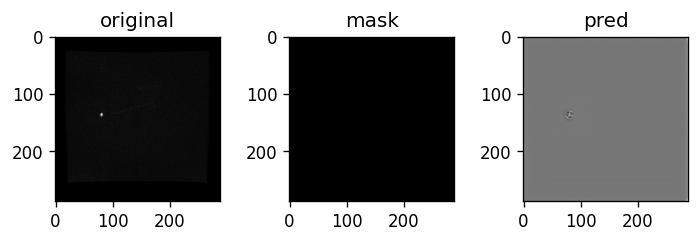

Train: Epoch 4 | Batch: 110 | Combined Loss: 0.1267980933189392 | BCE 0.08414632081985474 | dice_loss 0.04265177249908447
Train: Epoch 4 | Batch: 120 | Combined Loss: 0.17348706722259521 | BCE 0.09845752269029617 | dice_loss 0.07502955198287964
Train: Epoch 4 | Batch: 130 | Combined Loss: 0.16409644484519958 | BCE 0.0963534414768219 | dice_loss 0.06774300336837769
Train: Epoch 4 | Batch: 140 | Combined Loss: 0.130178302526474 | BCE 0.08492973446846008 | dice_loss 0.045248568058013916
Train: Epoch 4 | Batch: 150 | Combined Loss: 0.15612104535102844 | BCE 0.09315147250890732 | dice_loss 0.06296956539154053
Train: Epoch 4 | Batch: 160 | Combined Loss: 0.1270432472229004 | BCE 0.0834418460726738 | dice_loss 0.043601393699645996
Train: Epoch 4 | Batch: 170 | Combined Loss: 0.12486332654953003 | BCE 0.08256751298904419 | dice_loss 0.04229581356048584
Train: Epoch 4 | Batch: 180 | Combined Loss: 0.126114159822464 | BCE 0.08289554715156555 | dice_loss 0.04321861267089844
Train: Epoch 4 | Batch

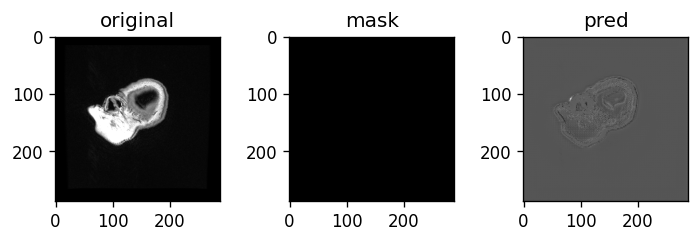

Train: Epoch 4 | Batch: 210 | Combined Loss: 0.13253168761730194 | BCE 0.08464537560939789 | dice_loss 0.04788631200790405
Train: Epoch 4 | Batch: 220 | Combined Loss: 0.12320364266633987 | BCE 0.08123189955949783 | dice_loss 0.04197174310684204
Train: Epoch 4 | Batch: 230 | Combined Loss: 0.12776847183704376 | BCE 0.08269275724887848 | dice_loss 0.04507571458816528
Train: Epoch 4 | Batch: 240 | Combined Loss: 0.15834331512451172 | BCE 0.09183114767074585 | dice_loss 0.06651216745376587
Train: Epoch 4 | Batch: 250 | Combined Loss: 0.12086576968431473 | BCE 0.07979721575975418 | dice_loss 0.04106855392456055
Train: Epoch 4 | Batch: 260 | Combined Loss: 0.10804801434278488 | BCE 0.0746486708521843 | dice_loss 0.033399343490600586
Train: Epoch 4 | Batch: 270 | Combined Loss: 0.1094045415520668 | BCE 0.07519308477640152 | dice_loss 0.03421145677566528
Train: Epoch 4 | Batch: 280 | Combined Loss: 0.16293330490589142 | BCE 0.09342671930789948 | dice_loss 0.06950658559799194
Train: Epoch 4 | 

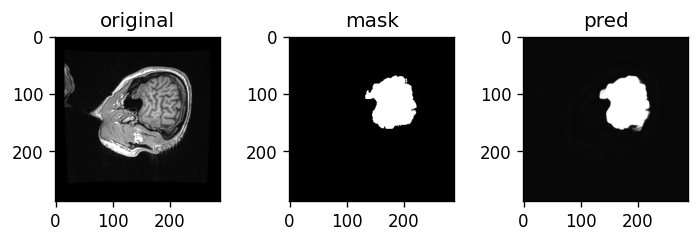

Train: Epoch 4 | Batch: 310 | Combined Loss: 0.10895083844661713 | BCE 0.07441024482250214 | dice_loss 0.03454059362411499
Train: Epoch 4 | Batch: 320 | Combined Loss: 0.14263004064559937 | BCE 0.08573586493730545 | dice_loss 0.05689418315887451
Train: Epoch 4 | Batch: 330 | Combined Loss: 0.11686092615127563 | BCE 0.07726651430130005 | dice_loss 0.039594411849975586
Train: Epoch 4 | Batch: 340 | Combined Loss: 0.18729136884212494 | BCE 0.09620462357997894 | dice_loss 0.091086745262146
Train: Epoch 4 | Batch: 350 | Combined Loss: 0.10788742452859879 | BCE 0.07373688369989395 | dice_loss 0.034150540828704834
Train: Epoch 4 | Batch: 360 | Combined Loss: 0.1316368579864502 | BCE 0.08172320574522018 | dice_loss 0.049913644790649414
Train: Epoch 4 | Batch: 370 | Combined Loss: 0.14211010932922363 | BCE 0.08590006828308105 | dice_loss 0.05621004104614258
Train: Epoch 4 | Batch: 380 | Combined Loss: 0.10368236899375916 | BCE 0.07131806015968323 | dice_loss 0.03236430883407593
Train: Epoch 4 |

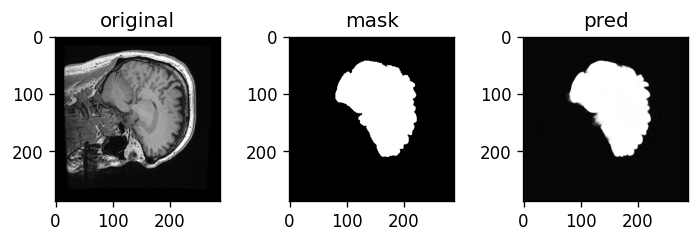

Train: Epoch 4 | Batch: 410 | Combined Loss: 0.15784193575382233 | BCE 0.08984513580799103 | dice_loss 0.0679967999458313
Train: Epoch 4 | Batch: 420 | Combined Loss: 0.10732468217611313 | BCE 0.0725681409239769 | dice_loss 0.03475654125213623
Train: Epoch 4 | Batch: 430 | Combined Loss: 0.1184694692492485 | BCE 0.07650428265333176 | dice_loss 0.04196518659591675
Train: Epoch 4 | Batch: 440 | Combined Loss: 0.10115717351436615 | BCE 0.06971745193004608 | dice_loss 0.03143972158432007
Train: Epoch 4 | Batch: 450 | Combined Loss: 0.20274224877357483 | BCE 0.09647777676582336 | dice_loss 0.10626447200775146
Train: Epoch 4 | Batch: 460 | Combined Loss: 0.11993490904569626 | BCE 0.07653289288282394 | dice_loss 0.043402016162872314
Train: Epoch 4 | Batch: 470 | Combined Loss: 0.10246548056602478 | BCE 0.06992009282112122 | dice_loss 0.032545387744903564
Train: Epoch 4 | Batch: 480 | Combined Loss: 0.10005969554185867 | BCE 0.06880254298448563 | dice_loss 0.03125715255737305
Train: Epoch 4 | 

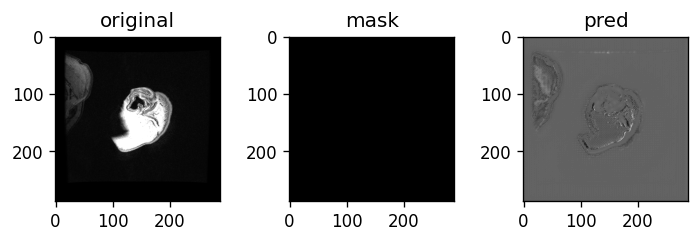

Avg train loss for epoch  --> 0.13810294533788922 | BCE: 0.08510102193964564 | dice_loss: 0.05300192352340156
Val: Epoch 4 | Batch: 0 | Combined Loss: 0.1138770803809166 | BCE 0.07657047361135483 | dice_loss 0.03730660676956177


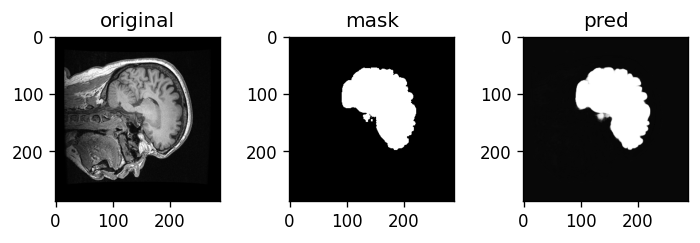

Val: Epoch 4 | Batch: 10 | Combined Loss: 0.11902967095375061 | BCE 0.0775398313999176 | dice_loss 0.04148983955383301
Val: Epoch 4 | Batch: 20 | Combined Loss: 0.12358729541301727 | BCE 0.07636962831020355 | dice_loss 0.04721766710281372
Val: Epoch 4 | Batch: 30 | Combined Loss: 0.12592586874961853 | BCE 0.07683197408914566 | dice_loss 0.04909390211105347


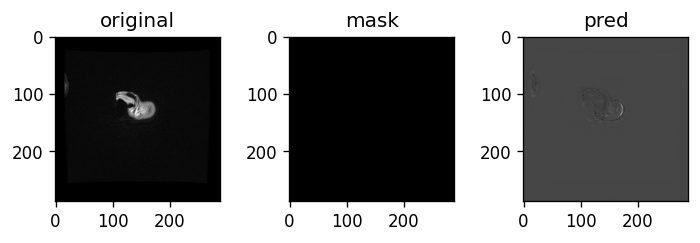

Val: Epoch 4 | Batch: 40 | Combined Loss: 0.1194135770201683 | BCE 0.07613786309957504 | dice_loss 0.04327571392059326
Val: Epoch 4 | Batch: 50 | Combined Loss: 0.11428839713335037 | BCE 0.07563412934541702 | dice_loss 0.03865426778793335
Val: Epoch 4 | Batch: 60 | Combined Loss: 0.11416647583246231 | BCE 0.07542387396097183 | dice_loss 0.03874260187149048


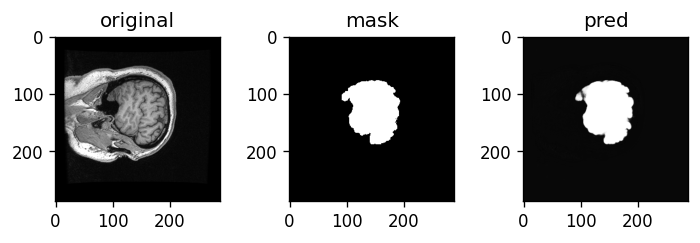

Val: Epoch 4 | Batch: 70 | Combined Loss: 0.11439889669418335 | BCE 0.07573974132537842 | dice_loss 0.03865915536880493
Val: Epoch 4 | Batch: 80 | Combined Loss: 0.10777758806943893 | BCE 0.07524793595075607 | dice_loss 0.03252965211868286
Val: Epoch 4 | Batch: 90 | Combined Loss: 0.1175222396850586 | BCE 0.0756257176399231 | dice_loss 0.0418965220451355


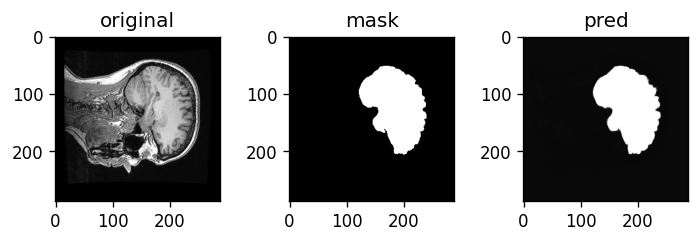

Val: Epoch 4 | Batch: 100 | Combined Loss: 0.1452401578426361 | BCE 0.0783284530043602 | dice_loss 0.06691169738769531
Val: Epoch 4 | Batch: 110 | Combined Loss: 0.10578767210245132 | BCE 0.0750713124871254 | dice_loss 0.030716359615325928
Val: Epoch 4 | Batch: 120 | Combined Loss: 0.1168779581785202 | BCE 0.07564114034175873 | dice_loss 0.041236817836761475


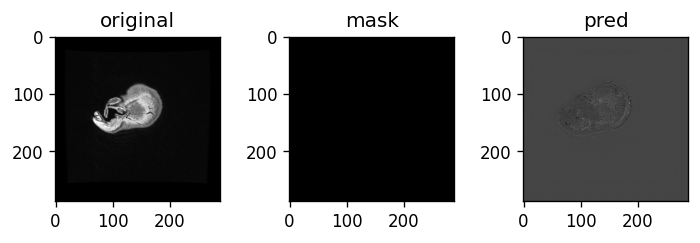

Val: Epoch 4 | Batch: 130 | Combined Loss: 0.13322748243808746 | BCE 0.07666976749897003 | dice_loss 0.05655771493911743
Val: Epoch 4 | Batch: 140 | Combined Loss: 0.11405042558908463 | BCE 0.07537148147821426 | dice_loss 0.03867894411087036
Val: Epoch 4 | Batch: 150 | Combined Loss: 0.10598350316286087 | BCE 0.07537771016359329 | dice_loss 0.030605792999267578


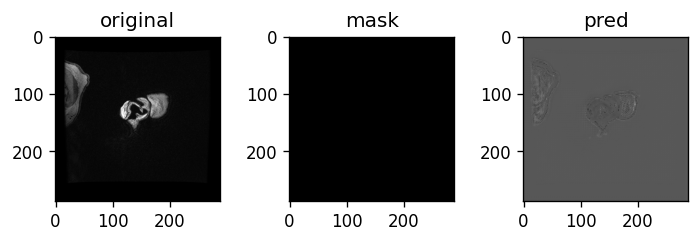

Average val loss for epoch  --> 0.11960029667243362 | BCE: 0.07645197468809783 | dice_loss: 0.04314832203090191
****************************************************************************************************
Train: Epoch 5 | Batch: 0 | Combined Loss: 0.13553979992866516 | BCE 0.08062323927879333 | dice_loss 0.054916560649871826


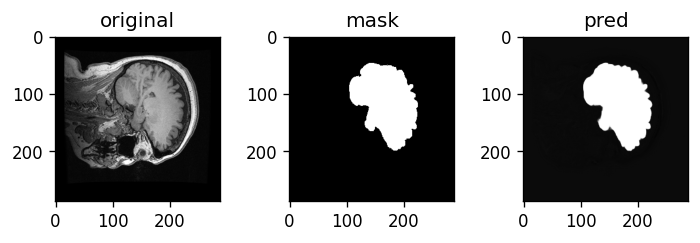

Train: Epoch 5 | Batch: 10 | Combined Loss: 0.14522147178649902 | BCE 0.08308625221252441 | dice_loss 0.06213521957397461
Train: Epoch 5 | Batch: 20 | Combined Loss: 0.14180494844913483 | BCE 0.08190794289112091 | dice_loss 0.059897005558013916
Train: Epoch 5 | Batch: 30 | Combined Loss: 0.10681779682636261 | BCE 0.07084079086780548 | dice_loss 0.03597700595855713
Train: Epoch 5 | Batch: 40 | Combined Loss: 0.1387968510389328 | BCE 0.08082042634487152 | dice_loss 0.05797642469406128
Train: Epoch 5 | Batch: 50 | Combined Loss: 0.13741305470466614 | BCE 0.08041205257177353 | dice_loss 0.05700099468231201
Train: Epoch 5 | Batch: 60 | Combined Loss: 0.21228419244289398 | BCE 0.09489308297634125 | dice_loss 0.11739110946655273
Train: Epoch 5 | Batch: 70 | Combined Loss: 0.10577863454818726 | BCE 0.07012367248535156 | dice_loss 0.03565496206283569
Train: Epoch 5 | Batch: 80 | Combined Loss: 0.12667399644851685 | BCE 0.07690203934907913 | dice_loss 0.04977196455001831
Train: Epoch 5 | Batch: 

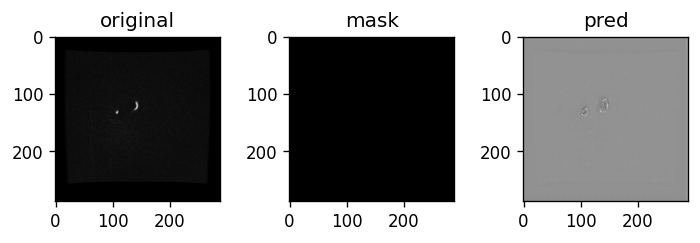

Train: Epoch 5 | Batch: 110 | Combined Loss: 0.08588839322328568 | BCE 0.06153494864702225 | dice_loss 0.024353444576263428
Train: Epoch 5 | Batch: 120 | Combined Loss: 0.09388012439012527 | BCE 0.0645105317234993 | dice_loss 0.029369592666625977
Train: Epoch 5 | Batch: 130 | Combined Loss: 0.12629327178001404 | BCE 0.07619502395391464 | dice_loss 0.0500982403755188
Train: Epoch 5 | Batch: 140 | Combined Loss: 0.0874183177947998 | BCE 0.06178295612335205 | dice_loss 0.025635361671447754
Train: Epoch 5 | Batch: 150 | Combined Loss: 0.10367561876773834 | BCE 0.0680408626794815 | dice_loss 0.035634756088256836
Train: Epoch 5 | Batch: 160 | Combined Loss: 0.11369653791189194 | BCE 0.0715649351477623 | dice_loss 0.04213160276412964
Train: Epoch 5 | Batch: 170 | Combined Loss: 0.1073354184627533 | BCE 0.06943640112876892 | dice_loss 0.037899017333984375
Train: Epoch 5 | Batch: 180 | Combined Loss: 0.08741332590579987 | BCE 0.0614217072725296 | dice_loss 0.025991618633270264
Train: Epoch 5 | 

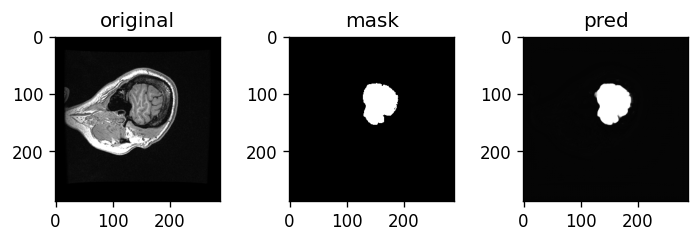

Train: Epoch 5 | Batch: 210 | Combined Loss: 0.11721690744161606 | BCE 0.07206817716360092 | dice_loss 0.04514873027801514
Train: Epoch 5 | Batch: 220 | Combined Loss: 0.10954954475164413 | BCE 0.06952681392431259 | dice_loss 0.04002273082733154
Train: Epoch 5 | Batch: 230 | Combined Loss: 0.0886504128575325 | BCE 0.06181526929140091 | dice_loss 0.026835143566131592
Train: Epoch 5 | Batch: 240 | Combined Loss: 0.11136708408594131 | BCE 0.07003489881753922 | dice_loss 0.0413321852684021
Train: Epoch 5 | Batch: 250 | Combined Loss: 0.07269899547100067 | BCE 0.05406127870082855 | dice_loss 0.01863771677017212
Train: Epoch 5 | Batch: 260 | Combined Loss: 0.07945071160793304 | BCE 0.05698101222515106 | dice_loss 0.022469699382781982
Train: Epoch 5 | Batch: 270 | Combined Loss: 0.08485698699951172 | BCE 0.0592491589486599 | dice_loss 0.025607824325561523
Train: Epoch 5 | Batch: 280 | Combined Loss: 0.09839891642332077 | BCE 0.06498032063245773 | dice_loss 0.03341859579086304
Train: Epoch 5 |

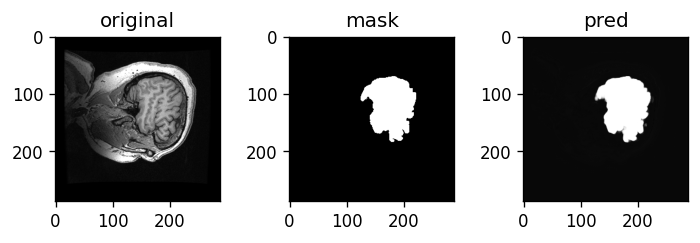

Train: Epoch 5 | Batch: 310 | Combined Loss: 0.11667600274085999 | BCE 0.07060226798057556 | dice_loss 0.046073734760284424
Train: Epoch 5 | Batch: 320 | Combined Loss: 0.09944325685501099 | BCE 0.06464874744415283 | dice_loss 0.034794509410858154
Train: Epoch 5 | Batch: 330 | Combined Loss: 0.11588847637176514 | BCE 0.07000333070755005 | dice_loss 0.04588514566421509
Train: Epoch 5 | Batch: 340 | Combined Loss: 0.08642591536045074 | BCE 0.05946262553334236 | dice_loss 0.02696329355239868
Train: Epoch 5 | Batch: 350 | Combined Loss: 0.07969795912504196 | BCE 0.056628935039043427 | dice_loss 0.023069024085998535
Train: Epoch 5 | Batch: 360 | Combined Loss: 0.08000390976667404 | BCE 0.0567963644862175 | dice_loss 0.023207545280456543
Train: Epoch 5 | Batch: 370 | Combined Loss: 0.10030316561460495 | BCE 0.06473337858915329 | dice_loss 0.03556978702545166
Train: Epoch 5 | Batch: 380 | Combined Loss: 0.09617074579000473 | BCE 0.06319990009069443 | dice_loss 0.0329708456993103
Train: Epoch 

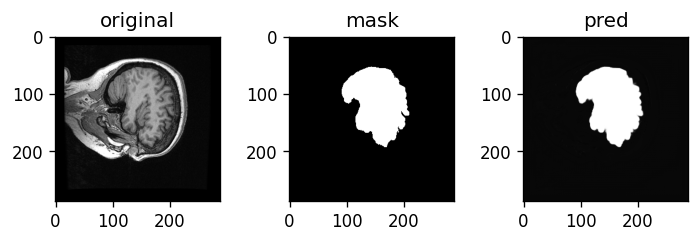

Train: Epoch 5 | Batch: 410 | Combined Loss: 0.07254301011562347 | BCE 0.05278138816356659 | dice_loss 0.019761621952056885
Train: Epoch 5 | Batch: 420 | Combined Loss: 0.09380058944225311 | BCE 0.06183444336056709 | dice_loss 0.03196614980697632
Train: Epoch 5 | Batch: 430 | Combined Loss: 0.11588047444820404 | BCE 0.06866006553173065 | dice_loss 0.04722040891647339
Train: Epoch 5 | Batch: 440 | Combined Loss: 0.0751713290810585 | BCE 0.05369368940591812 | dice_loss 0.02147763967514038
Train: Epoch 5 | Batch: 450 | Combined Loss: 0.07489386200904846 | BCE 0.05316266790032387 | dice_loss 0.021731197834014893
Train: Epoch 5 | Batch: 460 | Combined Loss: 0.1018177717924118 | BCE 0.06423281133174896 | dice_loss 0.03758496046066284
Train: Epoch 5 | Batch: 470 | Combined Loss: 0.12101077288389206 | BCE 0.07004301995038986 | dice_loss 0.0509677529335022
Train: Epoch 5 | Batch: 480 | Combined Loss: 0.08852978050708771 | BCE 0.0590372197329998 | dice_loss 0.029492557048797607
Train: Epoch 5 | 

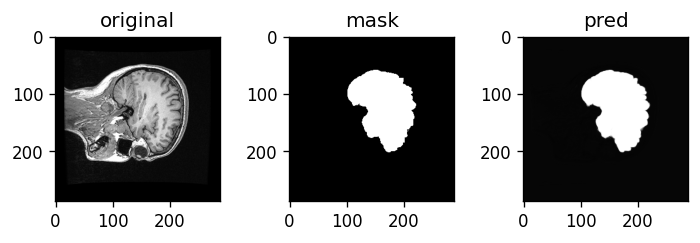

Avg train loss for epoch  --> 0.1007084760211202 | BCE: 0.06534134210805177 | dice_loss: 0.03536713406031311
Val: Epoch 5 | Batch: 0 | Combined Loss: 0.08619320392608643 | BCE 0.058423396199941635 | dice_loss 0.027769804000854492


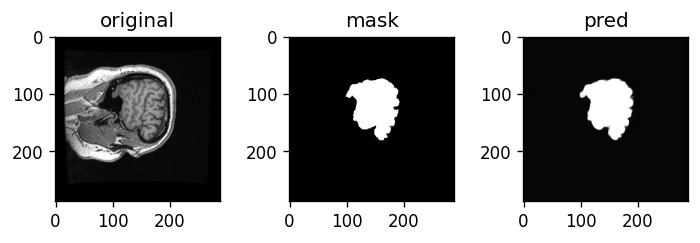

Val: Epoch 5 | Batch: 10 | Combined Loss: 0.08723530173301697 | BCE 0.05834087356925011 | dice_loss 0.028894424438476562
Val: Epoch 5 | Batch: 20 | Combined Loss: 0.0815824568271637 | BCE 0.05839821323752403 | dice_loss 0.023184239864349365
Val: Epoch 5 | Batch: 30 | Combined Loss: 0.08646909892559052 | BCE 0.058878108859062195 | dice_loss 0.02759099006652832


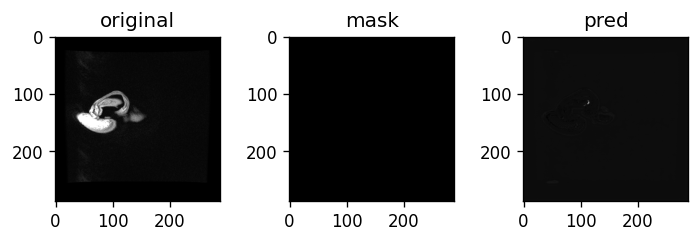

Val: Epoch 5 | Batch: 40 | Combined Loss: 0.09113918244838715 | BCE 0.0601419061422348 | dice_loss 0.030997276306152344
Val: Epoch 5 | Batch: 50 | Combined Loss: 0.09673886001110077 | BCE 0.06163857504725456 | dice_loss 0.03510028123855591
Val: Epoch 5 | Batch: 60 | Combined Loss: 0.08352988958358765 | BCE 0.05925298109650612 | dice_loss 0.024276912212371826


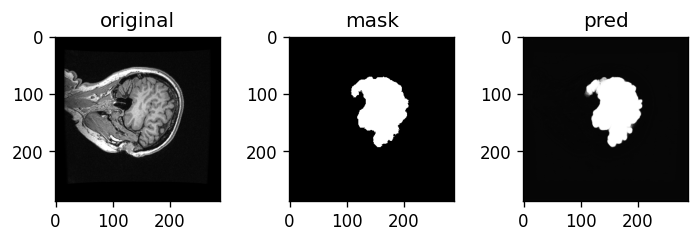

Val: Epoch 5 | Batch: 70 | Combined Loss: 0.08954764902591705 | BCE 0.05941582843661308 | dice_loss 0.030131816864013672
Val: Epoch 5 | Batch: 80 | Combined Loss: 0.08965613692998886 | BCE 0.05878760665655136 | dice_loss 0.0308685302734375
Val: Epoch 5 | Batch: 90 | Combined Loss: 0.08965587615966797 | BCE 0.05899244546890259 | dice_loss 0.03066343069076538


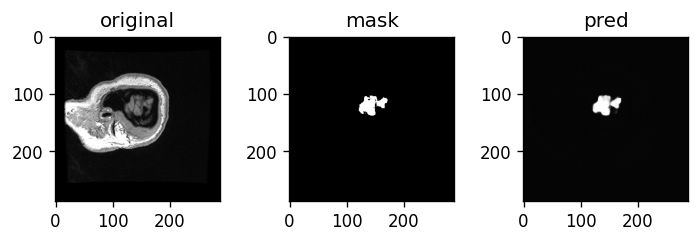

Val: Epoch 5 | Batch: 100 | Combined Loss: 0.09094122797250748 | BCE 0.05976472049951553 | dice_loss 0.031176507472991943
Val: Epoch 5 | Batch: 110 | Combined Loss: 0.08661672472953796 | BCE 0.058032602071762085 | dice_loss 0.02858412265777588
Val: Epoch 5 | Batch: 120 | Combined Loss: 0.08948367834091187 | BCE 0.061046306043863297 | dice_loss 0.028437376022338867


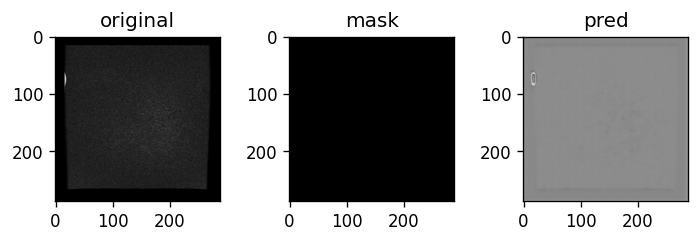

Val: Epoch 5 | Batch: 130 | Combined Loss: 0.08718612790107727 | BCE 0.05920282006263733 | dice_loss 0.02798330783843994
Val: Epoch 5 | Batch: 140 | Combined Loss: 0.08606857061386108 | BCE 0.05875707045197487 | dice_loss 0.027311503887176514
Val: Epoch 5 | Batch: 150 | Combined Loss: 0.0903070867061615 | BCE 0.0585465133190155 | dice_loss 0.031760573387145996


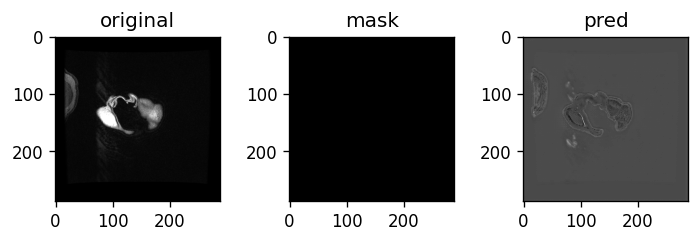

Average val loss for epoch  --> 0.08910962888039649 | BCE: 0.059184019058011475 | dice_loss: 0.02992560975253582
****************************************************************************************************
Train: Epoch 6 | Batch: 0 | Combined Loss: 0.07111525535583496 | BCE 0.05158054828643799 | dice_loss 0.019534707069396973


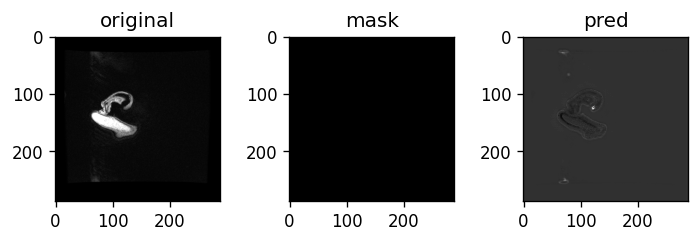

Train: Epoch 6 | Batch: 10 | Combined Loss: 0.09572349488735199 | BCE 0.06162713095545769 | dice_loss 0.034096360206604004
Train: Epoch 6 | Batch: 20 | Combined Loss: 0.07404313236474991 | BCE 0.0527973547577858 | dice_loss 0.02124577760696411
Train: Epoch 6 | Batch: 30 | Combined Loss: 0.07772035151720047 | BCE 0.053841836750507355 | dice_loss 0.023878514766693115
Train: Epoch 6 | Batch: 40 | Combined Loss: 0.07277484238147736 | BCE 0.05192770063877106 | dice_loss 0.0208471417427063
Train: Epoch 6 | Batch: 50 | Combined Loss: 0.07308577001094818 | BCE 0.05201224982738495 | dice_loss 0.021073520183563232
Train: Epoch 6 | Batch: 60 | Combined Loss: 0.10737808048725128 | BCE 0.06472565233707428 | dice_loss 0.042652428150177
Train: Epoch 6 | Batch: 70 | Combined Loss: 0.09279026091098785 | BCE 0.05986442044377327 | dice_loss 0.03292584419250488
Train: Epoch 6 | Batch: 80 | Combined Loss: 0.12531742453575134 | BCE 0.06920459121465683 | dice_loss 0.056112825870513916
Train: Epoch 6 | Batch:

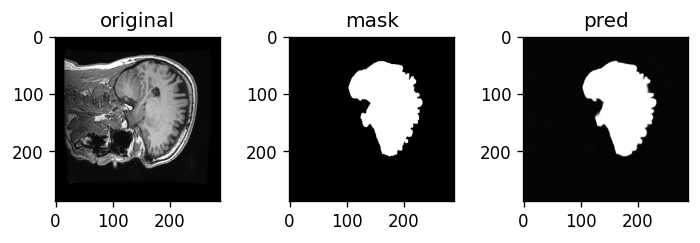

Train: Epoch 6 | Batch: 110 | Combined Loss: 0.06030350178480148 | BCE 0.04504220932722092 | dice_loss 0.015261292457580566
Train: Epoch 6 | Batch: 120 | Combined Loss: 0.08386847376823425 | BCE 0.05631628260016441 | dice_loss 0.02755218744277954
Train: Epoch 6 | Batch: 130 | Combined Loss: 0.09018594026565552 | BCE 0.05848372355103493 | dice_loss 0.03170222043991089
Train: Epoch 6 | Batch: 140 | Combined Loss: 0.07130815088748932 | BCE 0.0510946661233902 | dice_loss 0.02021348476409912
Train: Epoch 6 | Batch: 150 | Combined Loss: 0.069302998483181 | BCE 0.0498020276427269 | dice_loss 0.0195009708404541
Train: Epoch 6 | Batch: 160 | Combined Loss: 0.08123113214969635 | BCE 0.05438448488712311 | dice_loss 0.026846647262573242
Train: Epoch 6 | Batch: 170 | Combined Loss: 0.09357248246669769 | BCE 0.05927478149533272 | dice_loss 0.03429770469665527
Train: Epoch 6 | Batch: 180 | Combined Loss: 0.07672324776649475 | BCE 0.052781786769628525 | dice_loss 0.023941457271575928
Train: Epoch 6 | 

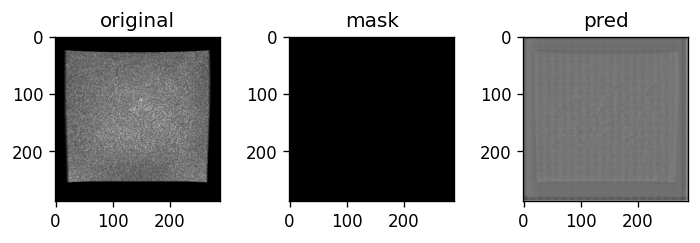

Train: Epoch 6 | Batch: 210 | Combined Loss: 0.10727636516094208 | BCE 0.06311558187007904 | dice_loss 0.04416078329086304
Train: Epoch 6 | Batch: 220 | Combined Loss: 0.08251824975013733 | BCE 0.05477818846702576 | dice_loss 0.027740061283111572
Train: Epoch 6 | Batch: 230 | Combined Loss: 0.08211802691221237 | BCE 0.054346852004528046 | dice_loss 0.027771174907684326
Train: Epoch 6 | Batch: 240 | Combined Loss: 0.08773539215326309 | BCE 0.056526102125644684 | dice_loss 0.031209290027618408
Train: Epoch 6 | Batch: 250 | Combined Loss: 0.08057962357997894 | BCE 0.05352417752146721 | dice_loss 0.027055442333221436
Train: Epoch 6 | Batch: 260 | Combined Loss: 0.07797516882419586 | BCE 0.05250050127506256 | dice_loss 0.0254746675491333
Train: Epoch 6 | Batch: 270 | Combined Loss: 0.07392530143260956 | BCE 0.05029122158885002 | dice_loss 0.02363407611846924
Train: Epoch 6 | Batch: 280 | Combined Loss: 0.07487021386623383 | BCE 0.05124126374721527 | dice_loss 0.023628950119018555
Train: Epo

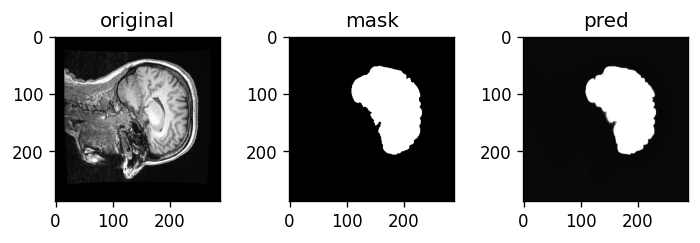

Train: Epoch 6 | Batch: 310 | Combined Loss: 0.08858656883239746 | BCE 0.05608135834336281 | dice_loss 0.03250521421432495
Train: Epoch 6 | Batch: 320 | Combined Loss: 0.08700801432132721 | BCE 0.05562300607562065 | dice_loss 0.03138500452041626
Train: Epoch 6 | Batch: 330 | Combined Loss: 0.08555047959089279 | BCE 0.054915182292461395 | dice_loss 0.030635297298431396
Train: Epoch 6 | Batch: 340 | Combined Loss: 0.085881806910038 | BCE 0.055180348455905914 | dice_loss 0.03070145845413208
Train: Epoch 6 | Batch: 350 | Combined Loss: 0.08589626103639603 | BCE 0.05478668957948685 | dice_loss 0.03110957145690918
Train: Epoch 6 | Batch: 360 | Combined Loss: 0.07394903898239136 | BCE 0.05048328638076782 | dice_loss 0.023465752601623535
Train: Epoch 6 | Batch: 370 | Combined Loss: 0.06366990506649017 | BCE 0.045642297714948654 | dice_loss 0.01802760362625122
Train: Epoch 6 | Batch: 380 | Combined Loss: 0.07069843262434006 | BCE 0.04895531386137009 | dice_loss 0.02174311876296997
Train: Epoch 

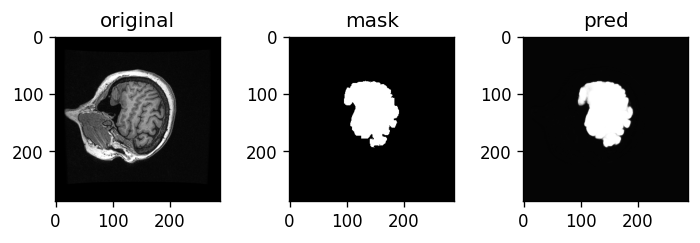

Train: Epoch 6 | Batch: 410 | Combined Loss: 0.0576169453561306 | BCE 0.042219337075948715 | dice_loss 0.015397608280181885
Train: Epoch 6 | Batch: 420 | Combined Loss: 0.0770372524857521 | BCE 0.05108831077814102 | dice_loss 0.025948941707611084
Train: Epoch 6 | Batch: 430 | Combined Loss: 0.06365108489990234 | BCE 0.04535263776779175 | dice_loss 0.018298447132110596
Train: Epoch 6 | Batch: 440 | Combined Loss: 0.0701286792755127 | BCE 0.04833793640136719 | dice_loss 0.021790742874145508
Train: Epoch 6 | Batch: 450 | Combined Loss: 0.060361407697200775 | BCE 0.04343827813863754 | dice_loss 0.016923129558563232
Train: Epoch 6 | Batch: 460 | Combined Loss: 0.07268647849559784 | BCE 0.04888187721371651 | dice_loss 0.02380460500717163
Train: Epoch 6 | Batch: 470 | Combined Loss: 0.07873860001564026 | BCE 0.051663126796483994 | dice_loss 0.027075469493865967
Train: Epoch 6 | Batch: 480 | Combined Loss: 0.07313801348209381 | BCE 0.049080561846494675 | dice_loss 0.024057447910308838
Train: E

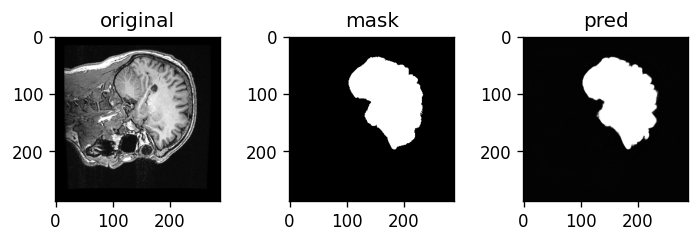

Avg train loss for epoch  --> 0.07822954094427612 | BCE: 0.05227787647646642 | dice_loss: 0.025951664438360764
Val: Epoch 6 | Batch: 0 | Combined Loss: 0.06963951140642166 | BCE 0.04621107131242752 | dice_loss 0.02342844009399414


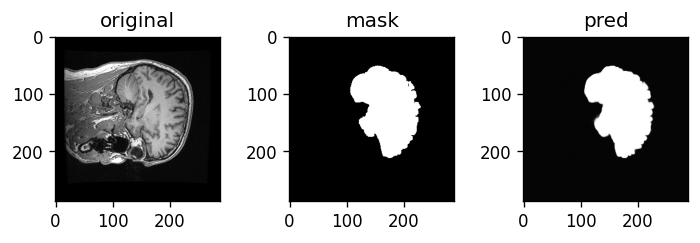

Val: Epoch 6 | Batch: 10 | Combined Loss: 0.0728454515337944 | BCE 0.045985035598278046 | dice_loss 0.026860415935516357
Val: Epoch 6 | Batch: 20 | Combined Loss: 0.06574541330337524 | BCE 0.04523766040802002 | dice_loss 0.020507752895355225
Val: Epoch 6 | Batch: 30 | Combined Loss: 0.06165868788957596 | BCE 0.045090921223163605 | dice_loss 0.016567766666412354


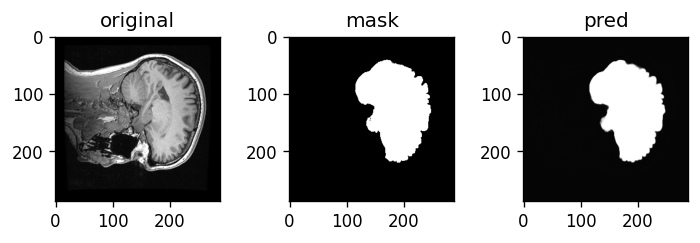

Val: Epoch 6 | Batch: 40 | Combined Loss: 0.06585946679115295 | BCE 0.04613623395562172 | dice_loss 0.019723236560821533
Val: Epoch 6 | Batch: 50 | Combined Loss: 0.06541210412979126 | BCE 0.045675694942474365 | dice_loss 0.019736409187316895
Val: Epoch 6 | Batch: 60 | Combined Loss: 0.06812246888875961 | BCE 0.04582919925451279 | dice_loss 0.022293269634246826


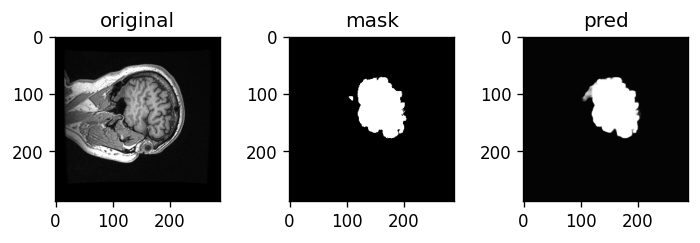

Val: Epoch 6 | Batch: 70 | Combined Loss: 0.06711729615926743 | BCE 0.04536648839712143 | dice_loss 0.021750807762145996
Val: Epoch 6 | Batch: 80 | Combined Loss: 0.06659293174743652 | BCE 0.04494232311844826 | dice_loss 0.021650612354278564
Val: Epoch 6 | Batch: 90 | Combined Loss: 0.06520594656467438 | BCE 0.04691357538104057 | dice_loss 0.018292367458343506


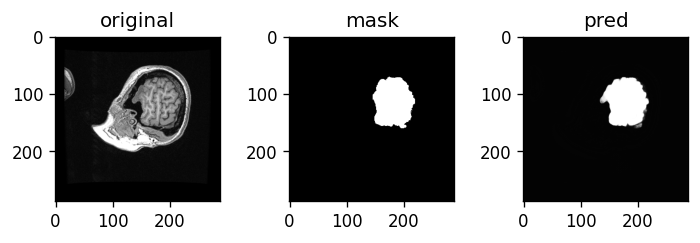

Val: Epoch 6 | Batch: 100 | Combined Loss: 0.06570272892713547 | BCE 0.04602491110563278 | dice_loss 0.019677817821502686
Val: Epoch 6 | Batch: 110 | Combined Loss: 0.06792895495891571 | BCE 0.04702816903591156 | dice_loss 0.02090078592300415
Val: Epoch 6 | Batch: 120 | Combined Loss: 0.07498709857463837 | BCE 0.046153049916028976 | dice_loss 0.028834044933319092


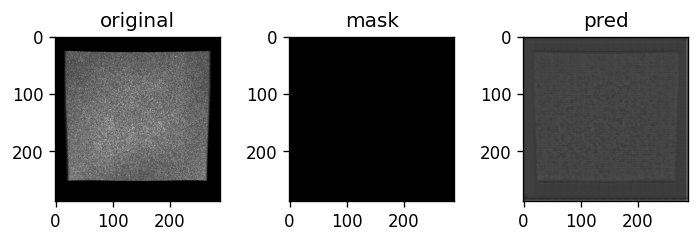

Val: Epoch 6 | Batch: 130 | Combined Loss: 0.06666426360607147 | BCE 0.0460926778614521 | dice_loss 0.020571589469909668
Val: Epoch 6 | Batch: 140 | Combined Loss: 0.06413301825523376 | BCE 0.04570939764380455 | dice_loss 0.018423616886138916
Val: Epoch 6 | Batch: 150 | Combined Loss: 0.07756733894348145 | BCE 0.04633807763457298 | dice_loss 0.031229257583618164


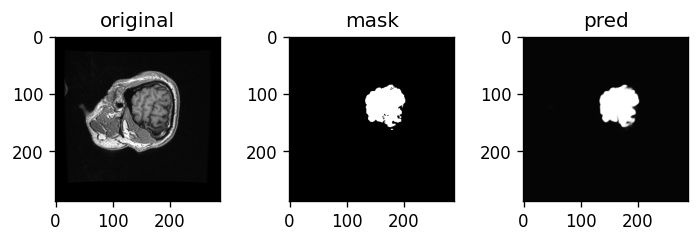

Average val loss for epoch  --> 0.06687201817985625 | BCE: 0.04570262562483549 | dice_loss: 0.0211693923920393
****************************************************************************************************
Train: Epoch 7 | Batch: 0 | Combined Loss: 0.08284367620944977 | BCE 0.052728187292814255 | dice_loss 0.030115485191345215


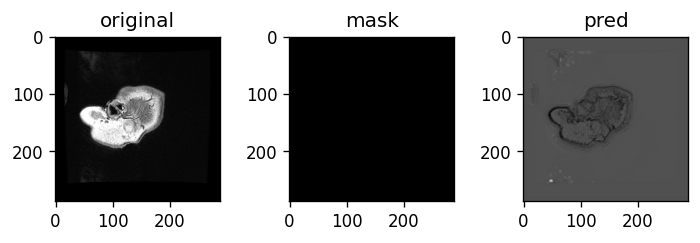

Train: Epoch 7 | Batch: 10 | Combined Loss: 0.06300299614667892 | BCE 0.04472034424543381 | dice_loss 0.018282651901245117
Train: Epoch 7 | Batch: 20 | Combined Loss: 0.06200806424021721 | BCE 0.043649058789014816 | dice_loss 0.018359005451202393
Train: Epoch 7 | Batch: 30 | Combined Loss: 0.06371192634105682 | BCE 0.04473428428173065 | dice_loss 0.018977642059326172
Train: Epoch 7 | Batch: 40 | Combined Loss: 0.056002721190452576 | BCE 0.040424928069114685 | dice_loss 0.01557779312133789
Train: Epoch 7 | Batch: 50 | Combined Loss: 0.05952246114611626 | BCE 0.042764853686094284 | dice_loss 0.016757607460021973
Train: Epoch 7 | Batch: 60 | Combined Loss: 0.05656620115041733 | BCE 0.04081728309392929 | dice_loss 0.015748918056488037
Train: Epoch 7 | Batch: 70 | Combined Loss: 0.06117815151810646 | BCE 0.043560270220041275 | dice_loss 0.017617881298065186
Train: Epoch 7 | Batch: 80 | Combined Loss: 0.05794906988739967 | BCE 0.04161596670746803 | dice_loss 0.01633310317993164
Train: Epoch 

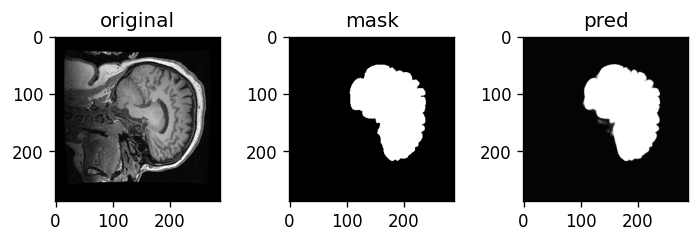

Train: Epoch 7 | Batch: 110 | Combined Loss: 0.06268078833818436 | BCE 0.0437815859913826 | dice_loss 0.018899202346801758
Train: Epoch 7 | Batch: 120 | Combined Loss: 0.05939476937055588 | BCE 0.04177539795637131 | dice_loss 0.01761937141418457
Train: Epoch 7 | Batch: 130 | Combined Loss: 0.06902067363262177 | BCE 0.04616271331906319 | dice_loss 0.022857964038848877
Train: Epoch 7 | Batch: 140 | Combined Loss: 0.05432985723018646 | BCE 0.03922747075557709 | dice_loss 0.015102386474609375
Train: Epoch 7 | Batch: 150 | Combined Loss: 0.06845492124557495 | BCE 0.04541230574250221 | dice_loss 0.023042619228363037
Train: Epoch 7 | Batch: 160 | Combined Loss: 0.07060819864273071 | BCE 0.04704361781477928 | dice_loss 0.023564577102661133
Train: Epoch 7 | Batch: 170 | Combined Loss: 0.0767955407500267 | BCE 0.0492878183722496 | dice_loss 0.0275077223777771
Train: Epoch 7 | Batch: 180 | Combined Loss: 0.06819846481084824 | BCE 0.04581495374441147 | dice_loss 0.022383511066436768
Train: Epoch 7

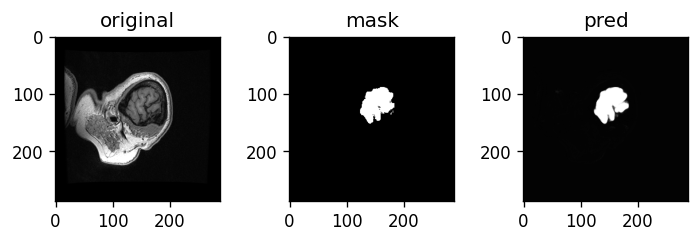

Train: Epoch 7 | Batch: 210 | Combined Loss: 0.07711419463157654 | BCE 0.04885802045464516 | dice_loss 0.02825617790222168
Train: Epoch 7 | Batch: 220 | Combined Loss: 0.061122991144657135 | BCE 0.04202083498239517 | dice_loss 0.019102156162261963
Train: Epoch 7 | Batch: 230 | Combined Loss: 0.06099498271942139 | BCE 0.04256331920623779 | dice_loss 0.018431663513183594
Train: Epoch 7 | Batch: 240 | Combined Loss: 0.0557950921356678 | BCE 0.0399908609688282 | dice_loss 0.0158042311668396
Train: Epoch 7 | Batch: 250 | Combined Loss: 0.045961927622556686 | BCE 0.034273575991392136 | dice_loss 0.01168835163116455
Train: Epoch 7 | Batch: 260 | Combined Loss: 0.05526356026530266 | BCE 0.03951404616236687 | dice_loss 0.01574951410293579
Train: Epoch 7 | Batch: 270 | Combined Loss: 0.06923459470272064 | BCE 0.04608897492289543 | dice_loss 0.023145616054534912
Train: Epoch 7 | Batch: 280 | Combined Loss: 0.05664662644267082 | BCE 0.04034576937556267 | dice_loss 0.016300857067108154
Train: Epoch

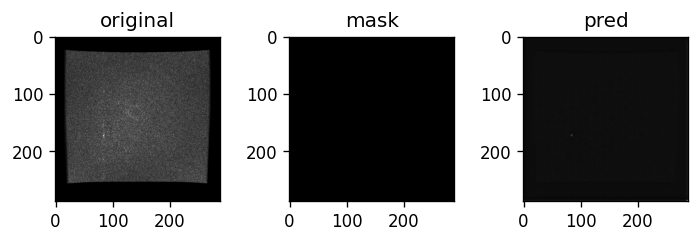

Train: Epoch 7 | Batch: 310 | Combined Loss: 0.05129391327500343 | BCE 0.03711480274796486 | dice_loss 0.014179110527038574
Train: Epoch 7 | Batch: 320 | Combined Loss: 0.051613662391901016 | BCE 0.03674909844994545 | dice_loss 0.014864563941955566
Train: Epoch 7 | Batch: 330 | Combined Loss: 0.06561367958784103 | BCE 0.04422586411237717 | dice_loss 0.021387815475463867
Train: Epoch 7 | Batch: 340 | Combined Loss: 0.05655239149928093 | BCE 0.03910784050822258 | dice_loss 0.01744455099105835
Train: Epoch 7 | Batch: 350 | Combined Loss: 0.04730842635035515 | BCE 0.03515301272273064 | dice_loss 0.012155413627624512
Train: Epoch 7 | Batch: 360 | Combined Loss: 0.06583808362483978 | BCE 0.043923188000917435 | dice_loss 0.021914899349212646
Train: Epoch 7 | Batch: 370 | Combined Loss: 0.05281880125403404 | BCE 0.038102831691503525 | dice_loss 0.014715969562530518
Train: Epoch 7 | Batch: 380 | Combined Loss: 0.05231829732656479 | BCE 0.037397585809230804 | dice_loss 0.014920711517333984
Train

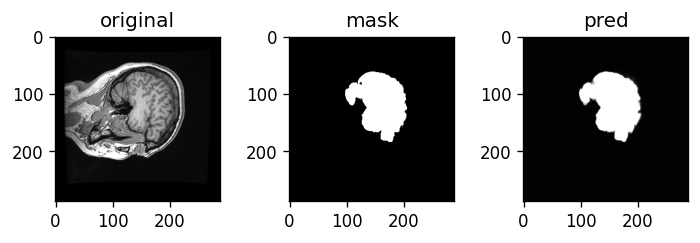

Train: Epoch 7 | Batch: 410 | Combined Loss: 0.06907103955745697 | BCE 0.045001670718193054 | dice_loss 0.024069368839263916
Train: Epoch 7 | Batch: 420 | Combined Loss: 0.057024113833904266 | BCE 0.039739660918712616 | dice_loss 0.01728445291519165
Train: Epoch 7 | Batch: 430 | Combined Loss: 0.04813176393508911 | BCE 0.03466904163360596 | dice_loss 0.013462722301483154
Train: Epoch 7 | Batch: 440 | Combined Loss: 0.04360438510775566 | BCE 0.03181631490588188 | dice_loss 0.01178807020187378
Train: Epoch 7 | Batch: 450 | Combined Loss: 0.04895176738500595 | BCE 0.03540506213903427 | dice_loss 0.01354670524597168
Train: Epoch 7 | Batch: 460 | Combined Loss: 0.055671326816082 | BCE 0.0385468527674675 | dice_loss 0.017124474048614502
Train: Epoch 7 | Batch: 470 | Combined Loss: 0.04897434636950493 | BCE 0.035742830485105515 | dice_loss 0.013231515884399414
Train: Epoch 7 | Batch: 480 | Combined Loss: 0.05504651740193367 | BCE 0.038299042731523514 | dice_loss 0.016747474670410156
Train: Ep

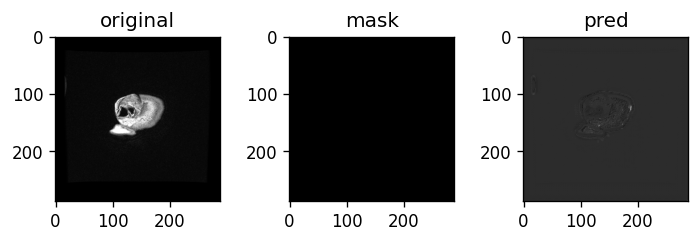

Avg train loss for epoch  --> 0.0619158321336324 | BCE: 0.04230606003034963 | dice_loss: 0.01960977205174714
Val: Epoch 7 | Batch: 0 | Combined Loss: 0.057030823081731796 | BCE 0.041064050048589706 | dice_loss 0.01596677303314209


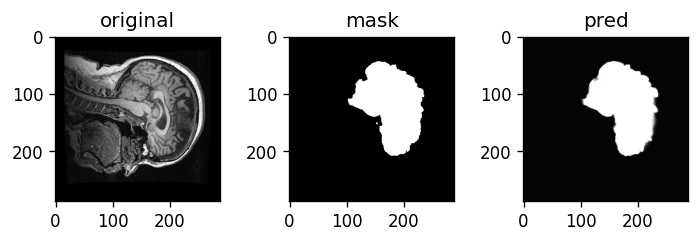

Val: Epoch 7 | Batch: 10 | Combined Loss: 0.06077813729643822 | BCE 0.041425880044698715 | dice_loss 0.019352257251739502
Val: Epoch 7 | Batch: 20 | Combined Loss: 0.06305965781211853 | BCE 0.041670117527246475 | dice_loss 0.021389544010162354
Val: Epoch 7 | Batch: 30 | Combined Loss: 0.05766717717051506 | BCE 0.04126356169581413 | dice_loss 0.016403615474700928


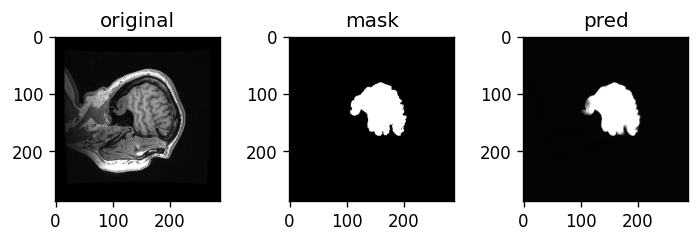

Val: Epoch 7 | Batch: 40 | Combined Loss: 0.05440057814121246 | BCE 0.039458051323890686 | dice_loss 0.014942526817321777
Val: Epoch 7 | Batch: 50 | Combined Loss: 0.054159946739673615 | BCE 0.03904087096452713 | dice_loss 0.015119075775146484
Val: Epoch 7 | Batch: 60 | Combined Loss: 0.05983560532331467 | BCE 0.04055004566907883 | dice_loss 0.01928555965423584


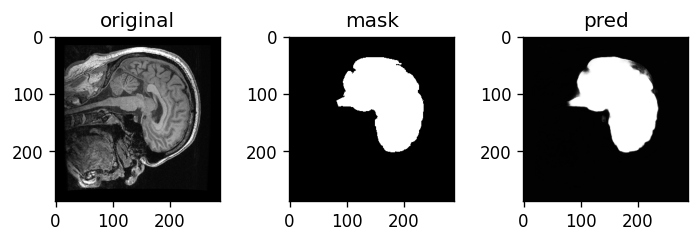

Val: Epoch 7 | Batch: 70 | Combined Loss: 0.0526711642742157 | BCE 0.03970673680305481 | dice_loss 0.012964427471160889
Val: Epoch 7 | Batch: 80 | Combined Loss: 0.056178174912929535 | BCE 0.04034283012151718 | dice_loss 0.015835344791412354
Val: Epoch 7 | Batch: 90 | Combined Loss: 0.06293042749166489 | BCE 0.041545771062374115 | dice_loss 0.02138465642929077


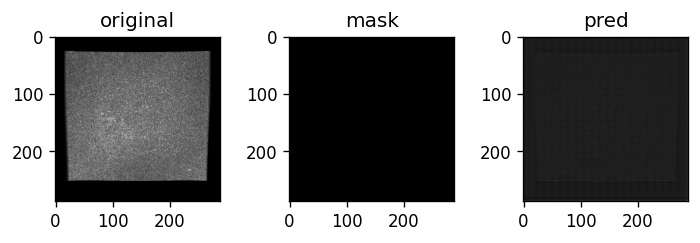

Val: Epoch 7 | Batch: 100 | Combined Loss: 0.062154922634363174 | BCE 0.04060909524559975 | dice_loss 0.021545827388763428
Val: Epoch 7 | Batch: 110 | Combined Loss: 0.05818730592727661 | BCE 0.03975313901901245 | dice_loss 0.01843416690826416
Val: Epoch 7 | Batch: 120 | Combined Loss: 0.06341957300901413 | BCE 0.04402732104063034 | dice_loss 0.01939225196838379


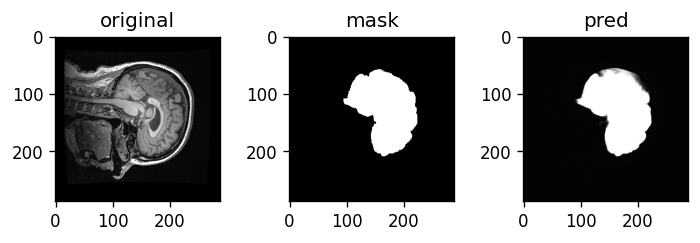

Val: Epoch 7 | Batch: 130 | Combined Loss: 0.05949220061302185 | BCE 0.040752559900283813 | dice_loss 0.018739640712738037
Val: Epoch 7 | Batch: 140 | Combined Loss: 0.058738190680742264 | BCE 0.04161461070179939 | dice_loss 0.01712357997894287
Val: Epoch 7 | Batch: 150 | Combined Loss: 0.060079894959926605 | BCE 0.039846502244472504 | dice_loss 0.0202333927154541


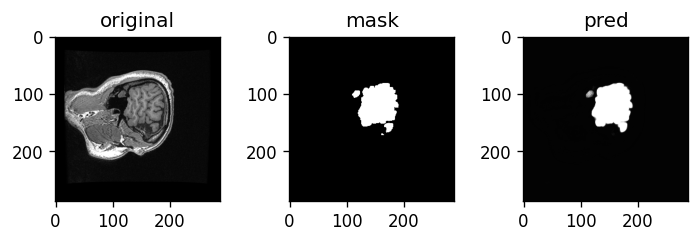

Average val loss for epoch  --> 0.05867969433311373 | BCE: 0.04033216231036931 | dice_loss: 0.01834753192961216
****************************************************************************************************
Train: Epoch 8 | Batch: 0 | Combined Loss: 0.04731489345431328 | BCE 0.03422648832201958 | dice_loss 0.013088405132293701


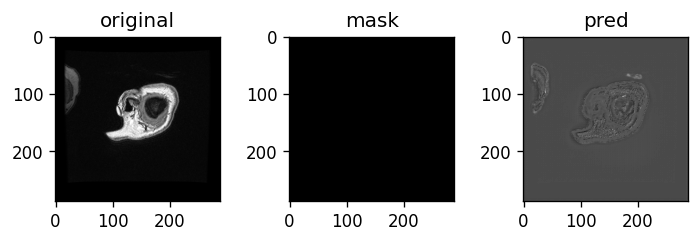

Train: Epoch 8 | Batch: 10 | Combined Loss: 0.04356800764799118 | BCE 0.032261960208415985 | dice_loss 0.011306047439575195
Train: Epoch 8 | Batch: 20 | Combined Loss: 0.04830639436841011 | BCE 0.03500889614224434 | dice_loss 0.013297498226165771
Train: Epoch 8 | Batch: 30 | Combined Loss: 0.053455304354429245 | BCE 0.03758866712450981 | dice_loss 0.015866637229919434
Train: Epoch 8 | Batch: 40 | Combined Loss: 0.055238138884305954 | BCE 0.03831345960497856 | dice_loss 0.016924679279327393
Train: Epoch 8 | Batch: 50 | Combined Loss: 0.053931642323732376 | BCE 0.036527980118989944 | dice_loss 0.01740366220474243
Train: Epoch 8 | Batch: 60 | Combined Loss: 0.047789789736270905 | BCE 0.034405626356601715 | dice_loss 0.01338416337966919
Train: Epoch 8 | Batch: 70 | Combined Loss: 0.0498298779129982 | BCE 0.03529707342386246 | dice_loss 0.014532804489135742
Train: Epoch 8 | Batch: 80 | Combined Loss: 0.05484332516789436 | BCE 0.03777487948536873 | dice_loss 0.017068445682525635
Train: Epoch

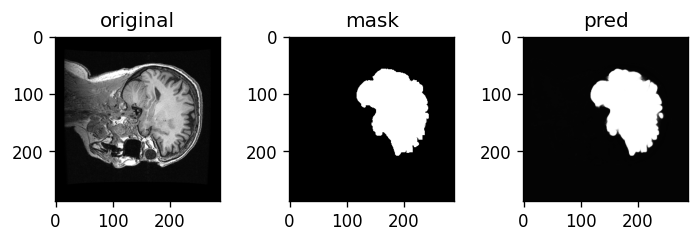

Train: Epoch 8 | Batch: 110 | Combined Loss: 0.049347709864377975 | BCE 0.03486121818423271 | dice_loss 0.014486491680145264
Train: Epoch 8 | Batch: 120 | Combined Loss: 0.047389447689056396 | BCE 0.03398960828781128 | dice_loss 0.013399839401245117
Train: Epoch 8 | Batch: 130 | Combined Loss: 0.043233197182416916 | BCE 0.031655650585889816 | dice_loss 0.0115775465965271
Train: Epoch 8 | Batch: 140 | Combined Loss: 0.052126187831163406 | BCE 0.035780150443315506 | dice_loss 0.0163460373878479
Train: Epoch 8 | Batch: 150 | Combined Loss: 0.045092467218637466 | BCE 0.032495442777872086 | dice_loss 0.01259702444076538
Train: Epoch 8 | Batch: 160 | Combined Loss: 0.04189362749457359 | BCE 0.031264033168554306 | dice_loss 0.010629594326019287
Train: Epoch 8 | Batch: 170 | Combined Loss: 0.04661010578274727 | BCE 0.0337132103741169 | dice_loss 0.012896895408630371
Train: Epoch 8 | Batch: 180 | Combined Loss: 0.05789908021688461 | BCE 0.03845163434743881 | dice_loss 0.0194474458694458
Train: 

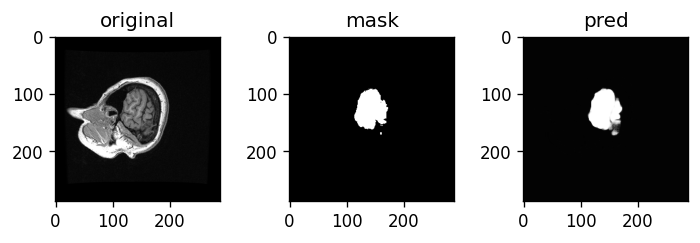

Train: Epoch 8 | Batch: 210 | Combined Loss: 0.047069452702999115 | BCE 0.03348078578710556 | dice_loss 0.013588666915893555
Train: Epoch 8 | Batch: 220 | Combined Loss: 0.06058274954557419 | BCE 0.04010086506605148 | dice_loss 0.020481884479522705
Train: Epoch 8 | Batch: 230 | Combined Loss: 0.05385968089103699 | BCE 0.03711143136024475 | dice_loss 0.016748249530792236
Train: Epoch 8 | Batch: 240 | Combined Loss: 0.0525936596095562 | BCE 0.03655524179339409 | dice_loss 0.01603841781616211
Train: Epoch 8 | Batch: 250 | Combined Loss: 0.07561708986759186 | BCE 0.044474974274635315 | dice_loss 0.031142115592956543
Train: Epoch 8 | Batch: 260 | Combined Loss: 0.04296470433473587 | BCE 0.03114486299455166 | dice_loss 0.011819839477539062
Train: Epoch 8 | Batch: 270 | Combined Loss: 0.04303537309169769 | BCE 0.030740544199943542 | dice_loss 0.01229482889175415
Train: Epoch 8 | Batch: 280 | Combined Loss: 0.047212280333042145 | BCE 0.032992757856845856 | dice_loss 0.014219522476196289
Train:

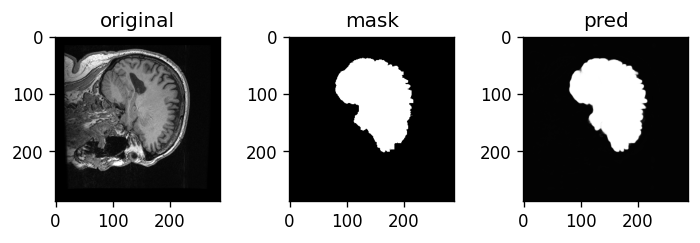

Train: Epoch 8 | Batch: 310 | Combined Loss: 0.05041348561644554 | BCE 0.03491651639342308 | dice_loss 0.015496969223022461
Train: Epoch 8 | Batch: 320 | Combined Loss: 0.06299175322055817 | BCE 0.039985254406929016 | dice_loss 0.02300649881362915
Train: Epoch 8 | Batch: 330 | Combined Loss: 0.061867743730545044 | BCE 0.039622753858566284 | dice_loss 0.02224498987197876
Train: Epoch 8 | Batch: 340 | Combined Loss: 0.05243746563792229 | BCE 0.035601597279310226 | dice_loss 0.01683586835861206
Train: Epoch 8 | Batch: 350 | Combined Loss: 0.04888211190700531 | BCE 0.03337983787059784 | dice_loss 0.01550227403640747
Train: Epoch 8 | Batch: 360 | Combined Loss: 0.044142138212919235 | BCE 0.031799864023923874 | dice_loss 0.012342274188995361
Train: Epoch 8 | Batch: 370 | Combined Loss: 0.05776556581258774 | BCE 0.0378771647810936 | dice_loss 0.01988840103149414
Train: Epoch 8 | Batch: 380 | Combined Loss: 0.047628674656152725 | BCE 0.03281388059258461 | dice_loss 0.014814794063568115
Train: 

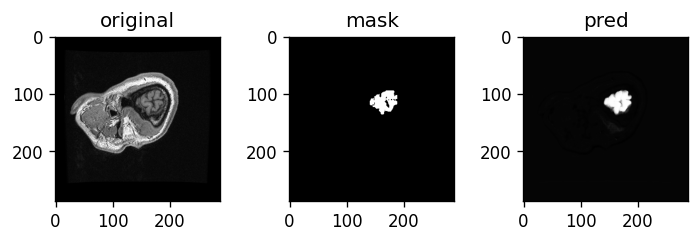

Train: Epoch 8 | Batch: 410 | Combined Loss: 0.04388537257909775 | BCE 0.030660472810268402 | dice_loss 0.013224899768829346
Train: Epoch 8 | Batch: 420 | Combined Loss: 0.04833901673555374 | BCE 0.03284002095460892 | dice_loss 0.015498995780944824
Train: Epoch 8 | Batch: 430 | Combined Loss: 0.05234399437904358 | BCE 0.035264939069747925 | dice_loss 0.017079055309295654
Train: Epoch 8 | Batch: 440 | Combined Loss: 0.05762355774641037 | BCE 0.037197284400463104 | dice_loss 0.020426273345947266
Train: Epoch 8 | Batch: 450 | Combined Loss: 0.05603876709938049 | BCE 0.03646436333656311 | dice_loss 0.019574403762817383
Train: Epoch 8 | Batch: 460 | Combined Loss: 0.047843433916568756 | BCE 0.03187934309244156 | dice_loss 0.015964090824127197
Train: Epoch 8 | Batch: 470 | Combined Loss: 0.04273955523967743 | BCE 0.030148552730679512 | dice_loss 0.012591004371643066
Train: Epoch 8 | Batch: 480 | Combined Loss: 0.0452301949262619 | BCE 0.031588003039360046 | dice_loss 0.013642191886901855
Tra

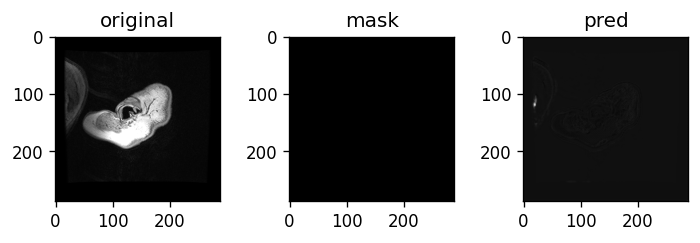

Avg train loss for epoch  --> 0.05240318527364213 | BCE: 0.035505649659473434 | dice_loss: 0.016897535606806457
Val: Epoch 8 | Batch: 0 | Combined Loss: 0.04651815444231033 | BCE 0.03230232745409012 | dice_loss 0.014215826988220215


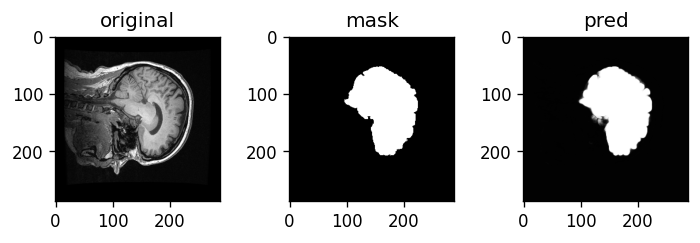

Val: Epoch 8 | Batch: 10 | Combined Loss: 0.0448882132768631 | BCE 0.032270804047584534 | dice_loss 0.012617409229278564
Val: Epoch 8 | Batch: 20 | Combined Loss: 0.04758690297603607 | BCE 0.031104788184165955 | dice_loss 0.016482114791870117
Val: Epoch 8 | Batch: 30 | Combined Loss: 0.059140052646398544 | BCE 0.033544983714818954 | dice_loss 0.02559506893157959


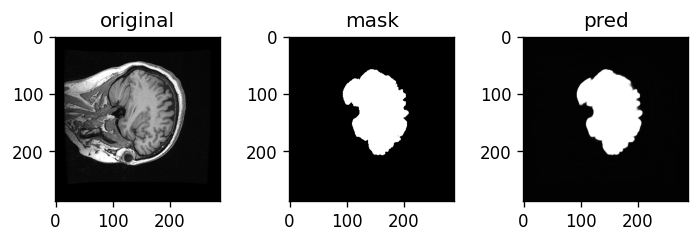

Val: Epoch 8 | Batch: 40 | Combined Loss: 0.05656630918383598 | BCE 0.035100292414426804 | dice_loss 0.02146601676940918
Val: Epoch 8 | Batch: 50 | Combined Loss: 0.047763265669345856 | BCE 0.03203467279672623 | dice_loss 0.01572859287261963
Val: Epoch 8 | Batch: 60 | Combined Loss: 0.05493734031915665 | BCE 0.036833085119724274 | dice_loss 0.018104255199432373


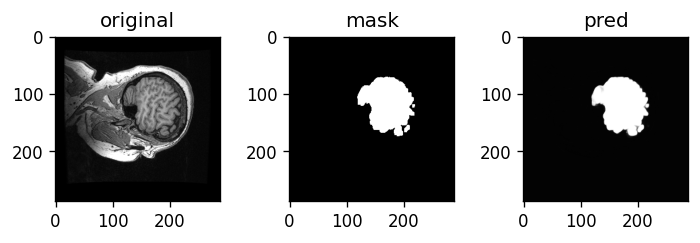

Val: Epoch 8 | Batch: 70 | Combined Loss: 0.04920443147420883 | BCE 0.031142735853791237 | dice_loss 0.018061697483062744
Val: Epoch 8 | Batch: 80 | Combined Loss: 0.0484551303088665 | BCE 0.0315631739795208 | dice_loss 0.016891956329345703
Val: Epoch 8 | Batch: 90 | Combined Loss: 0.045838505029678345 | BCE 0.03245750069618225 | dice_loss 0.013381004333496094


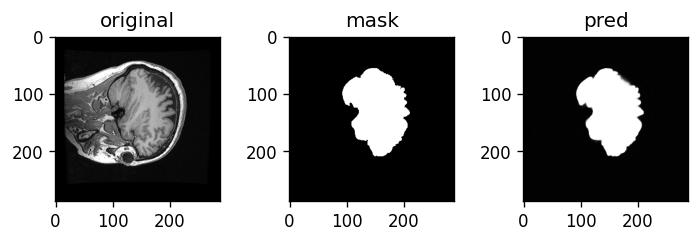

Val: Epoch 8 | Batch: 100 | Combined Loss: 0.04667744040489197 | BCE 0.03328552842140198 | dice_loss 0.01339191198348999
Val: Epoch 8 | Batch: 110 | Combined Loss: 0.05022864788770676 | BCE 0.03229057043790817 | dice_loss 0.017938077449798584
Val: Epoch 8 | Batch: 120 | Combined Loss: 0.04458298534154892 | BCE 0.03113945573568344 | dice_loss 0.013443529605865479


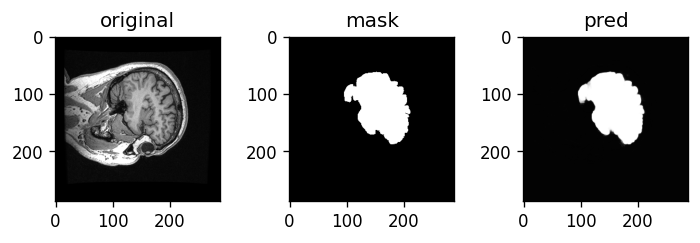

Val: Epoch 8 | Batch: 130 | Combined Loss: 0.04981224611401558 | BCE 0.03455387428402901 | dice_loss 0.015258371829986572
Val: Epoch 8 | Batch: 140 | Combined Loss: 0.0449368990957737 | BCE 0.03166884556412697 | dice_loss 0.013268053531646729
Val: Epoch 8 | Batch: 150 | Combined Loss: 0.04245026409626007 | BCE 0.03154267370700836 | dice_loss 0.010907590389251709


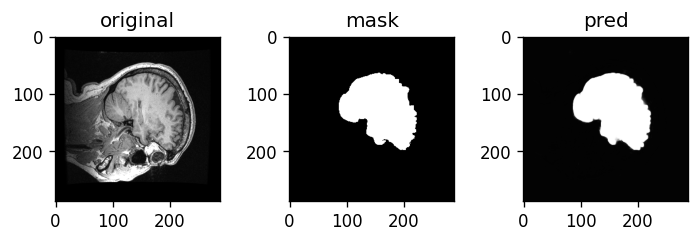

Average val loss for epoch  --> 0.04811578574590385 | BCE: 0.032515289587900044 | dice_loss: 0.015600496158003806
****************************************************************************************************
Train: Epoch 9 | Batch: 0 | Combined Loss: 0.03588841110467911 | BCE 0.026091137900948524 | dice_loss 0.009797275066375732


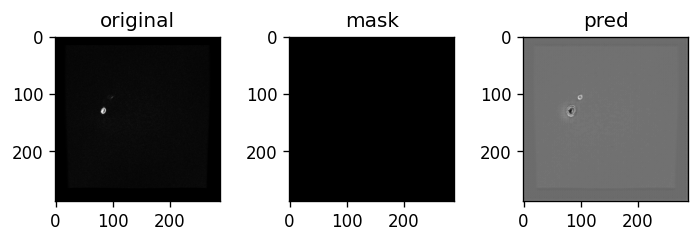

Train: Epoch 9 | Batch: 10 | Combined Loss: 0.038853127509355545 | BCE 0.027920980006456375 | dice_loss 0.01093214750289917
Train: Epoch 9 | Batch: 20 | Combined Loss: 0.05786527693271637 | BCE 0.03704942762851715 | dice_loss 0.02081584930419922
Train: Epoch 9 | Batch: 30 | Combined Loss: 0.041803035885095596 | BCE 0.029658053070306778 | dice_loss 0.012144982814788818
Train: Epoch 9 | Batch: 40 | Combined Loss: 0.0526670403778553 | BCE 0.03475554659962654 | dice_loss 0.01791149377822876
Train: Epoch 9 | Batch: 50 | Combined Loss: 0.050697363913059235 | BCE 0.03367612510919571 | dice_loss 0.017021238803863525
Train: Epoch 9 | Batch: 60 | Combined Loss: 0.047835782170295715 | BCE 0.032668307423591614 | dice_loss 0.015167474746704102
Train: Epoch 9 | Batch: 70 | Combined Loss: 0.054360758513212204 | BCE 0.03523595258593559 | dice_loss 0.01912480592727661
Train: Epoch 9 | Batch: 80 | Combined Loss: 0.03953514248132706 | BCE 0.028339721262454987 | dice_loss 0.01119542121887207
Train: Epoch 

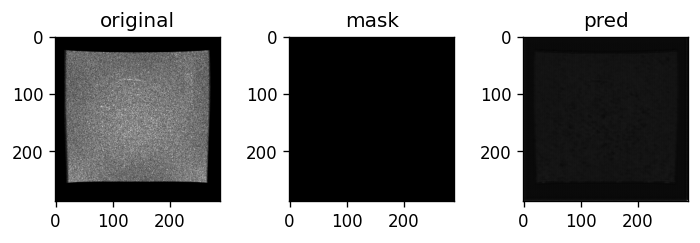

Train: Epoch 9 | Batch: 110 | Combined Loss: 0.04163350164890289 | BCE 0.02964438684284687 | dice_loss 0.011989116668701172
Train: Epoch 9 | Batch: 120 | Combined Loss: 0.04921703413128853 | BCE 0.03295813873410225 | dice_loss 0.01625889539718628
Train: Epoch 9 | Batch: 130 | Combined Loss: 0.042324040085077286 | BCE 0.029635224491357803 | dice_loss 0.012688815593719482
Train: Epoch 9 | Batch: 140 | Combined Loss: 0.0420222282409668 | BCE 0.029260752722620964 | dice_loss 0.012761473655700684
Train: Epoch 9 | Batch: 150 | Combined Loss: 0.039115022867918015 | BCE 0.028133880347013474 | dice_loss 0.010981142520904541
Train: Epoch 9 | Batch: 160 | Combined Loss: 0.043001867830753326 | BCE 0.029796099290251732 | dice_loss 0.013205766677856445
Train: Epoch 9 | Batch: 170 | Combined Loss: 0.04073602706193924 | BCE 0.02886444889008999 | dice_loss 0.011871576309204102
Train: Epoch 9 | Batch: 180 | Combined Loss: 0.04380561411380768 | BCE 0.030914142727851868 | dice_loss 0.01289147138595581
Tra

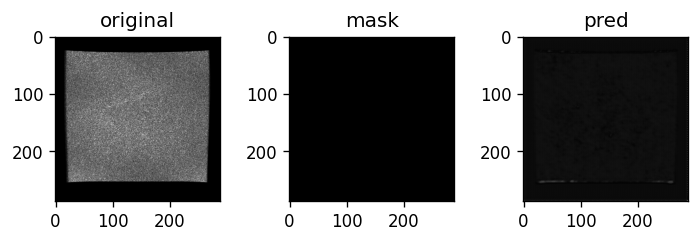

Train: Epoch 9 | Batch: 210 | Combined Loss: 0.03626042976975441 | BCE 0.026118401437997818 | dice_loss 0.010142028331756592
Train: Epoch 9 | Batch: 220 | Combined Loss: 0.04312431067228317 | BCE 0.029614919796586037 | dice_loss 0.013509392738342285
Train: Epoch 9 | Batch: 230 | Combined Loss: 0.042048174887895584 | BCE 0.029469866305589676 | dice_loss 0.012578308582305908
Train: Epoch 9 | Batch: 240 | Combined Loss: 0.05059138685464859 | BCE 0.033007241785526276 | dice_loss 0.017584145069122314
Train: Epoch 9 | Batch: 250 | Combined Loss: 0.04320283979177475 | BCE 0.029610952362418175 | dice_loss 0.013591885566711426
Train: Epoch 9 | Batch: 260 | Combined Loss: 0.03898179531097412 | BCE 0.026860537007451057 | dice_loss 0.012121260166168213
Train: Epoch 9 | Batch: 270 | Combined Loss: 0.036547575145959854 | BCE 0.025454256683588028 | dice_loss 0.011093318462371826
Train: Epoch 9 | Batch: 280 | Combined Loss: 0.039201367646455765 | BCE 0.027420032769441605 | dice_loss 0.0117813348770141

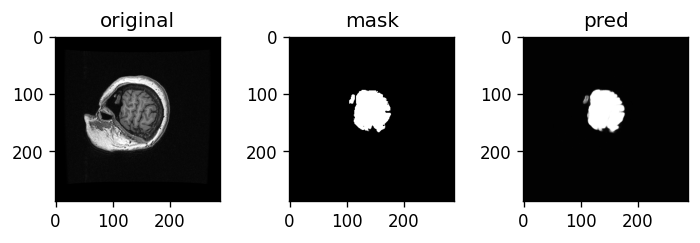

Train: Epoch 9 | Batch: 310 | Combined Loss: 0.03314553201198578 | BCE 0.023498045280575752 | dice_loss 0.009647488594055176
Train: Epoch 9 | Batch: 320 | Combined Loss: 0.05178872123360634 | BCE 0.033310387283563614 | dice_loss 0.018478333950042725
Train: Epoch 9 | Batch: 330 | Combined Loss: 0.05417671054601669 | BCE 0.03342428058385849 | dice_loss 0.020752429962158203
Train: Epoch 9 | Batch: 340 | Combined Loss: 0.04269886761903763 | BCE 0.029727647081017494 | dice_loss 0.012971222400665283
Train: Epoch 9 | Batch: 350 | Combined Loss: 0.0438578724861145 | BCE 0.029572131112217903 | dice_loss 0.014285743236541748
Train: Epoch 9 | Batch: 360 | Combined Loss: 0.04614391550421715 | BCE 0.030896451324224472 | dice_loss 0.015247464179992676
Train: Epoch 9 | Batch: 370 | Combined Loss: 0.04054366797208786 | BCE 0.028070742264389992 | dice_loss 0.012472927570343018
Train: Epoch 9 | Batch: 380 | Combined Loss: 0.03566285967826843 | BCE 0.02524241805076599 | dice_loss 0.010420441627502441
Tra

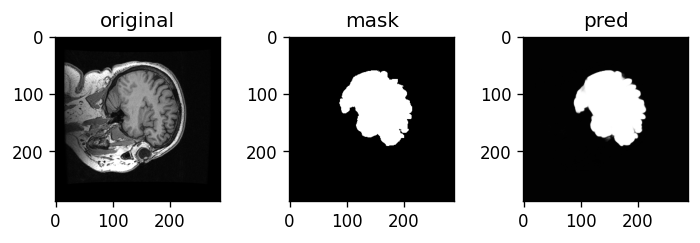

Train: Epoch 9 | Batch: 410 | Combined Loss: 0.04561502858996391 | BCE 0.030162345618009567 | dice_loss 0.015452682971954346
Train: Epoch 9 | Batch: 420 | Combined Loss: 0.03560469299554825 | BCE 0.025209644809365273 | dice_loss 0.010395050048828125
Train: Epoch 9 | Batch: 430 | Combined Loss: 0.04104151949286461 | BCE 0.027902748435735703 | dice_loss 0.013138771057128906
Train: Epoch 9 | Batch: 440 | Combined Loss: 0.04705209285020828 | BCE 0.030217895284295082 | dice_loss 0.01683419942855835
Train: Epoch 9 | Batch: 450 | Combined Loss: 0.04143746197223663 | BCE 0.028030171990394592 | dice_loss 0.013407289981842041
Train: Epoch 9 | Batch: 460 | Combined Loss: 0.04003289341926575 | BCE 0.027177246287465096 | dice_loss 0.0128556489944458
Train: Epoch 9 | Batch: 470 | Combined Loss: 0.04287039488554001 | BCE 0.028736820444464684 | dice_loss 0.014133572578430176
Train: Epoch 9 | Batch: 480 | Combined Loss: 0.039742209017276764 | BCE 0.026541927829384804 | dice_loss 0.01320028305053711
Tra

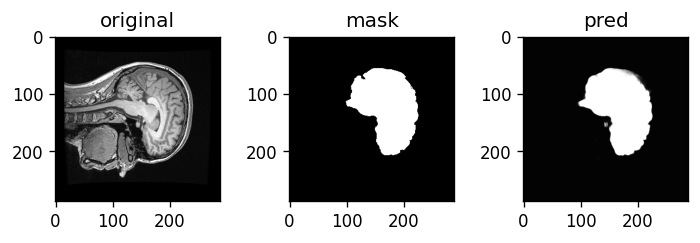

Avg train loss for epoch  --> 0.04322048607227124 | BCE: 0.02936613857893369 | dice_loss: 0.013854347552235418
Val: Epoch 9 | Batch: 0 | Combined Loss: 0.04594200849533081 | BCE 0.02733314223587513 | dice_loss 0.01860886812210083


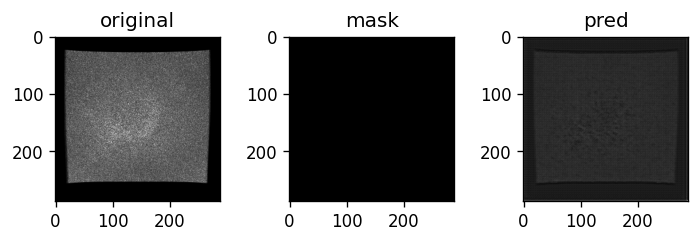

Val: Epoch 9 | Batch: 10 | Combined Loss: 0.036017127335071564 | BCE 0.02597225457429886 | dice_loss 0.010044872760772705
Val: Epoch 9 | Batch: 20 | Combined Loss: 0.03892575949430466 | BCE 0.026861779391765594 | dice_loss 0.012063980102539062
Val: Epoch 9 | Batch: 30 | Combined Loss: 0.04292411729693413 | BCE 0.027424585074186325 | dice_loss 0.015499532222747803


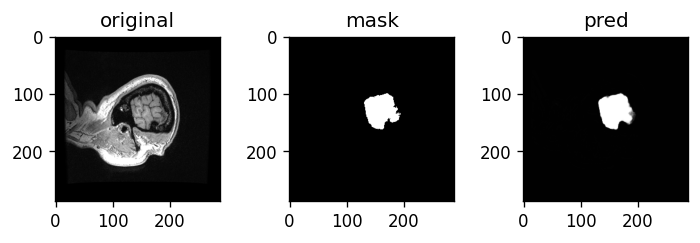

Val: Epoch 9 | Batch: 40 | Combined Loss: 0.04166315123438835 | BCE 0.028227370232343674 | dice_loss 0.013435781002044678
Val: Epoch 9 | Batch: 50 | Combined Loss: 0.03956564515829086 | BCE 0.026241803541779518 | dice_loss 0.013323843479156494
Val: Epoch 9 | Batch: 60 | Combined Loss: 0.04161900654435158 | BCE 0.026910189539194107 | dice_loss 0.01470881700515747


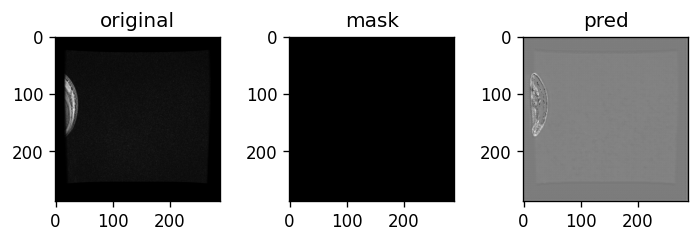

Val: Epoch 9 | Batch: 70 | Combined Loss: 0.04024180769920349 | BCE 0.027792783454060555 | dice_loss 0.012449026107788086
Val: Epoch 9 | Batch: 80 | Combined Loss: 0.04012497514486313 | BCE 0.02767260931432247 | dice_loss 0.012452363967895508
Val: Epoch 9 | Batch: 90 | Combined Loss: 0.04524071142077446 | BCE 0.027407776564359665 | dice_loss 0.017832934856414795


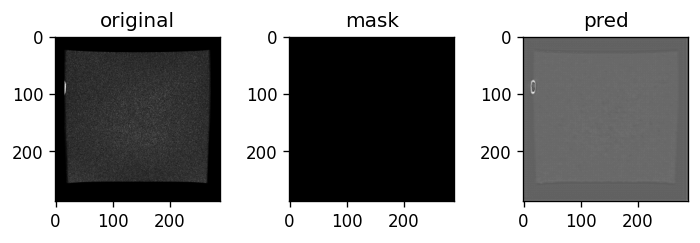

Val: Epoch 9 | Batch: 100 | Combined Loss: 0.03967798873782158 | BCE 0.026805471628904343 | dice_loss 0.012872517108917236
Val: Epoch 9 | Batch: 110 | Combined Loss: 0.03863842412829399 | BCE 0.025356363505125046 | dice_loss 0.013282060623168945
Val: Epoch 9 | Batch: 120 | Combined Loss: 0.04223048686981201 | BCE 0.026622295379638672 | dice_loss 0.01560819149017334


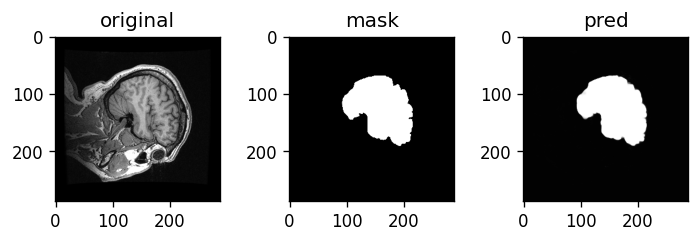

Val: Epoch 9 | Batch: 130 | Combined Loss: 0.03690250962972641 | BCE 0.02649679034948349 | dice_loss 0.01040571928024292
Val: Epoch 9 | Batch: 140 | Combined Loss: 0.039407335221767426 | BCE 0.027386153116822243 | dice_loss 0.012021183967590332
Val: Epoch 9 | Batch: 150 | Combined Loss: 0.038882166147232056 | BCE 0.026048867031931877 | dice_loss 0.01283329725265503


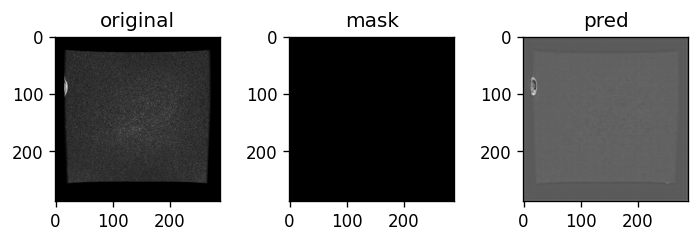

Average val loss for epoch  --> 0.03973344163969159 | BCE: 0.026853403309360147 | dice_loss: 0.012880038470029831
****************************************************************************************************
Train: Epoch 10 | Batch: 0 | Combined Loss: 0.041228555142879486 | BCE 0.02776106260716915 | dice_loss 0.013467490673065186


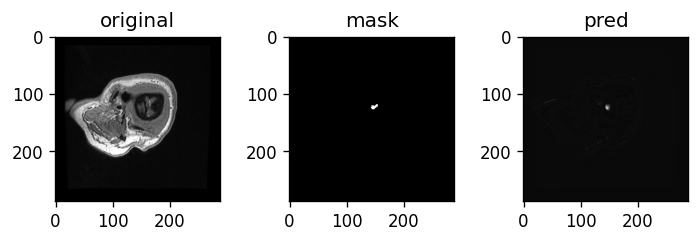

Train: Epoch 10 | Batch: 10 | Combined Loss: 0.036758169531822205 | BCE 0.02567581832408905 | dice_loss 0.011082351207733154
Train: Epoch 10 | Batch: 20 | Combined Loss: 0.03341708332300186 | BCE 0.024021662771701813 | dice_loss 0.009395420551300049
Train: Epoch 10 | Batch: 30 | Combined Loss: 0.03297246992588043 | BCE 0.023260191082954407 | dice_loss 0.009712278842926025
Train: Epoch 10 | Batch: 40 | Combined Loss: 0.04095413535833359 | BCE 0.027498086914420128 | dice_loss 0.01345604658126831
Train: Epoch 10 | Batch: 50 | Combined Loss: 0.03923087567090988 | BCE 0.027077369391918182 | dice_loss 0.0121535062789917
Train: Epoch 10 | Batch: 60 | Combined Loss: 0.038238752633333206 | BCE 0.026818502694368362 | dice_loss 0.011420249938964844
Train: Epoch 10 | Batch: 70 | Combined Loss: 0.03480032831430435 | BCE 0.024681130424141884 | dice_loss 0.010119199752807617
Train: Epoch 10 | Batch: 80 | Combined Loss: 0.04721302539110184 | BCE 0.029985254630446434 | dice_loss 0.017227768898010254
Tr

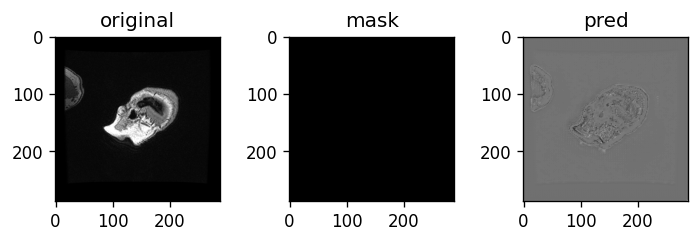

Train: Epoch 10 | Batch: 110 | Combined Loss: 0.03625473007559776 | BCE 0.02587803825736046 | dice_loss 0.010376691818237305
Train: Epoch 10 | Batch: 120 | Combined Loss: 0.0369802787899971 | BCE 0.025287099182605743 | dice_loss 0.011693179607391357
Train: Epoch 10 | Batch: 130 | Combined Loss: 0.03127789869904518 | BCE 0.0226290263235569 | dice_loss 0.008648872375488281
Train: Epoch 10 | Batch: 140 | Combined Loss: 0.035797249525785446 | BCE 0.024519573897123337 | dice_loss 0.01127767562866211
Train: Epoch 10 | Batch: 150 | Combined Loss: 0.04528387635946274 | BCE 0.029569290578365326 | dice_loss 0.015714585781097412
Train: Epoch 10 | Batch: 160 | Combined Loss: 0.031992752104997635 | BCE 0.02219124510884285 | dice_loss 0.009801506996154785
Train: Epoch 10 | Batch: 170 | Combined Loss: 0.03417768329381943 | BCE 0.02344556897878647 | dice_loss 0.010732114315032959
Train: Epoch 10 | Batch: 180 | Combined Loss: 0.03370688110589981 | BCE 0.023809948936104774 | dice_loss 0.0098969340324401

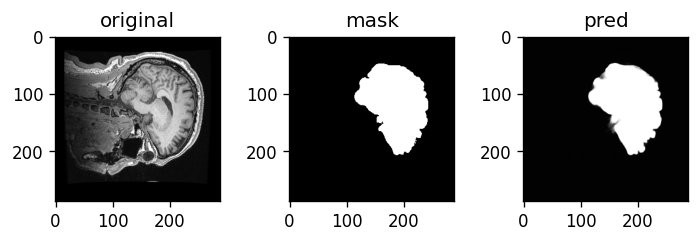

Train: Epoch 10 | Batch: 210 | Combined Loss: 0.03592957183718681 | BCE 0.02429778501391411 | dice_loss 0.011631786823272705
Train: Epoch 10 | Batch: 220 | Combined Loss: 0.0390060693025589 | BCE 0.0260323453694582 | dice_loss 0.01297372579574585
Train: Epoch 10 | Batch: 230 | Combined Loss: 0.0362236350774765 | BCE 0.0251186341047287 | dice_loss 0.011105000972747803
Train: Epoch 10 | Batch: 240 | Combined Loss: 0.03104676678776741 | BCE 0.021641988307237625 | dice_loss 0.009404778480529785
Train: Epoch 10 | Batch: 250 | Combined Loss: 0.037378087639808655 | BCE 0.025187984108924866 | dice_loss 0.012190103530883789
Train: Epoch 10 | Batch: 260 | Combined Loss: 0.03204295039176941 | BCE 0.022462936118245125 | dice_loss 0.009580016136169434
Train: Epoch 10 | Batch: 270 | Combined Loss: 0.032653313130140305 | BCE 0.02226148173213005 | dice_loss 0.010391831398010254
Train: Epoch 10 | Batch: 280 | Combined Loss: 0.031146207824349403 | BCE 0.021951476112008095 | dice_loss 0.00919473171234130

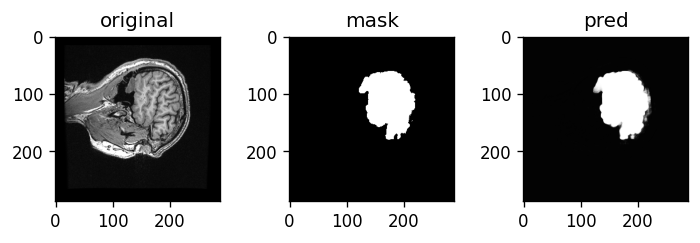

Train: Epoch 10 | Batch: 310 | Combined Loss: 0.04527071863412857 | BCE 0.02845023013651371 | dice_loss 0.01682049036026001
Train: Epoch 10 | Batch: 320 | Combined Loss: 0.035036250948905945 | BCE 0.023614270612597466 | dice_loss 0.01142197847366333
Train: Epoch 10 | Batch: 330 | Combined Loss: 0.03445246443152428 | BCE 0.023010339587926865 | dice_loss 0.011442124843597412
Train: Epoch 10 | Batch: 340 | Combined Loss: 0.03756088763475418 | BCE 0.025741344317793846 | dice_loss 0.011819541454315186
Train: Epoch 10 | Batch: 350 | Combined Loss: 0.031583696603775024 | BCE 0.02154836244881153 | dice_loss 0.010035336017608643
Train: Epoch 10 | Batch: 360 | Combined Loss: 0.033813588321208954 | BCE 0.022969717159867287 | dice_loss 0.010843873023986816
Train: Epoch 10 | Batch: 370 | Combined Loss: 0.04136960953474045 | BCE 0.026229253038764 | dice_loss 0.015140354633331299
Train: Epoch 10 | Batch: 380 | Combined Loss: 0.02986396849155426 | BCE 0.02033419907093048 | dice_loss 0.0095297694206237

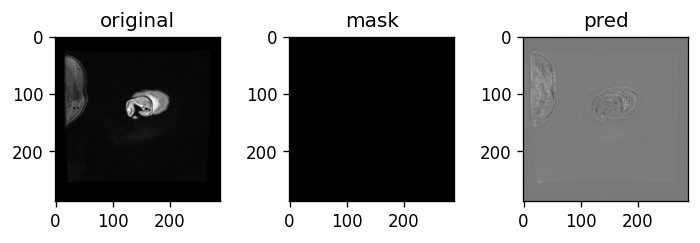

Train: Epoch 10 | Batch: 410 | Combined Loss: 0.02965186908841133 | BCE 0.020559538155794144 | dice_loss 0.009092330932617188
Train: Epoch 10 | Batch: 420 | Combined Loss: 0.03305300697684288 | BCE 0.022379305213689804 | dice_loss 0.010673701763153076
Train: Epoch 10 | Batch: 430 | Combined Loss: 0.031054038554430008 | BCE 0.02135409787297249 | dice_loss 0.00969994068145752
Train: Epoch 10 | Batch: 440 | Combined Loss: 0.03152565658092499 | BCE 0.021584495902061462 | dice_loss 0.009941160678863525
Train: Epoch 10 | Batch: 450 | Combined Loss: 0.032764166593551636 | BCE 0.021784335374832153 | dice_loss 0.010979831218719482
Train: Epoch 10 | Batch: 460 | Combined Loss: 0.02981223724782467 | BCE 0.020729323849081993 | dice_loss 0.009082913398742676
Train: Epoch 10 | Batch: 470 | Combined Loss: 0.03566204011440277 | BCE 0.023627446964383125 | dice_loss 0.012034595012664795
Train: Epoch 10 | Batch: 480 | Combined Loss: 0.034742571413517 | BCE 0.023607885465025902 | dice_loss 0.0111346840858

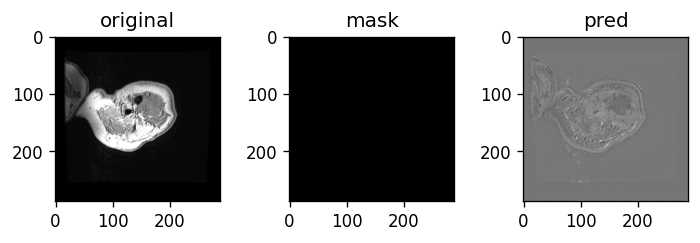

Avg train loss for epoch  --> 0.03651786328701987 | BCE: 0.024600813459796398 | dice_loss: 0.011917049823542357
Val: Epoch 10 | Batch: 0 | Combined Loss: 0.03518284112215042 | BCE 0.024306485429406166 | dice_loss 0.010876357555389404


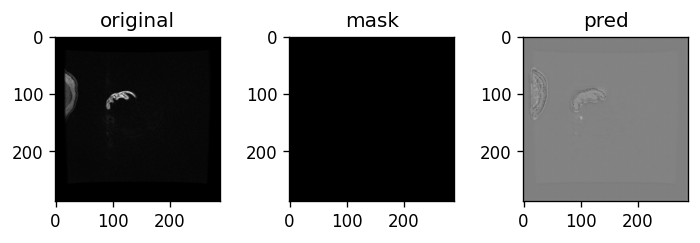

Val: Epoch 10 | Batch: 10 | Combined Loss: 0.03282977640628815 | BCE 0.023097528144717216 | dice_loss 0.009732246398925781
Val: Epoch 10 | Batch: 20 | Combined Loss: 0.03438429906964302 | BCE 0.02351294830441475 | dice_loss 0.010871350765228271
Val: Epoch 10 | Batch: 30 | Combined Loss: 0.03816495090723038 | BCE 0.023860076442360878 | dice_loss 0.014304876327514648


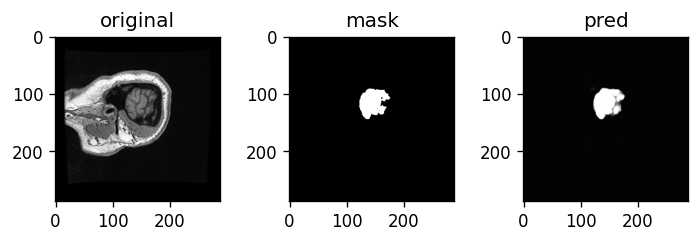

Val: Epoch 10 | Batch: 40 | Combined Loss: 0.0357082337141037 | BCE 0.023465201258659363 | dice_loss 0.012243032455444336
Val: Epoch 10 | Batch: 50 | Combined Loss: 0.032174549996852875 | BCE 0.022876465693116188 | dice_loss 0.009298086166381836
Val: Epoch 10 | Batch: 60 | Combined Loss: 0.03344756364822388 | BCE 0.022451279684901237 | dice_loss 0.01099628210067749


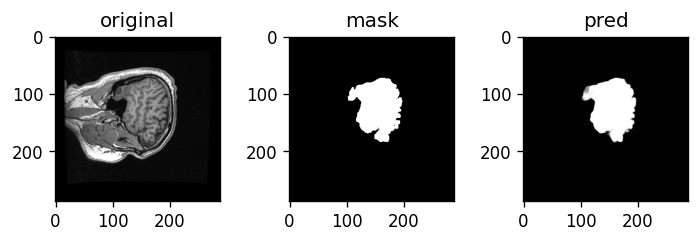

Val: Epoch 10 | Batch: 70 | Combined Loss: 0.036749206483364105 | BCE 0.02299090474843979 | dice_loss 0.013758301734924316
Val: Epoch 10 | Batch: 80 | Combined Loss: 0.033445656299591064 | BCE 0.022695956751704216 | dice_loss 0.0107496976852417
Val: Epoch 10 | Batch: 90 | Combined Loss: 0.034769780933856964 | BCE 0.02303571254014969 | dice_loss 0.011734068393707275


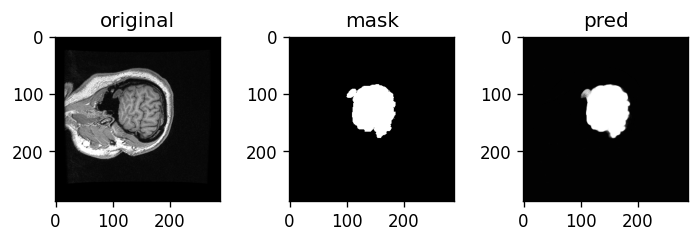

Val: Epoch 10 | Batch: 100 | Combined Loss: 0.04460693150758743 | BCE 0.02647913247346878 | dice_loss 0.018127799034118652
Val: Epoch 10 | Batch: 110 | Combined Loss: 0.041403088718652725 | BCE 0.0259040929377079 | dice_loss 0.015498995780944824
Val: Epoch 10 | Batch: 120 | Combined Loss: 0.03772827982902527 | BCE 0.023409336805343628 | dice_loss 0.01431894302368164


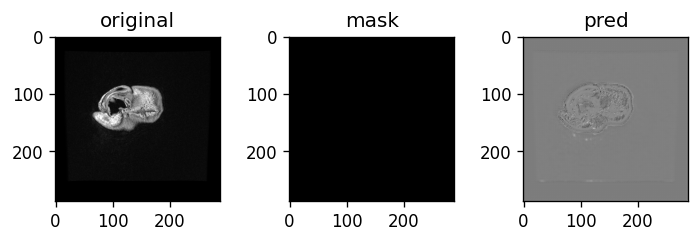

Val: Epoch 10 | Batch: 130 | Combined Loss: 0.031877826899290085 | BCE 0.023070883005857468 | dice_loss 0.008806943893432617
Val: Epoch 10 | Batch: 140 | Combined Loss: 0.038992591202259064 | BCE 0.024192100390791893 | dice_loss 0.014800488948822021
Val: Epoch 10 | Batch: 150 | Combined Loss: 0.03457530215382576 | BCE 0.023533958941698074 | dice_loss 0.011041343212127686


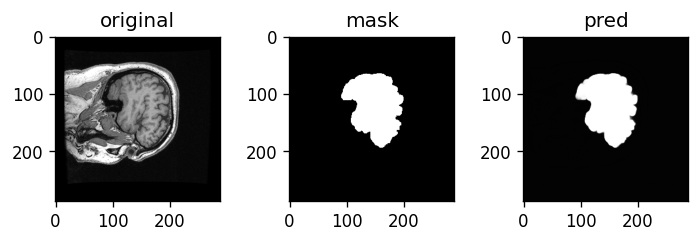

Average val loss for epoch  --> 0.035763627744745466 | BCE: 0.023797357687726617 | dice_loss: 0.011966270208358765
****************************************************************************************************
Train: Epoch 11 | Batch: 0 | Combined Loss: 0.03484739363193512 | BCE 0.02274651825428009 | dice_loss 0.01210087537765503


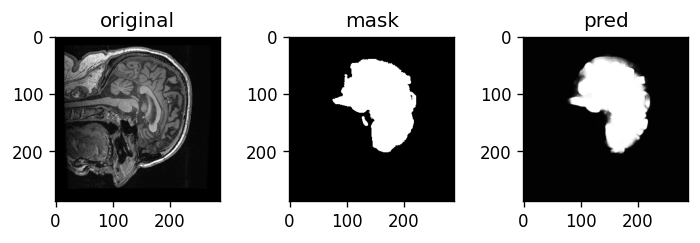

Train: Epoch 11 | Batch: 10 | Combined Loss: 0.03649233281612396 | BCE 0.023893103003501892 | dice_loss 0.01259922981262207
Train: Epoch 11 | Batch: 20 | Combined Loss: 0.03217576816678047 | BCE 0.020986247807741165 | dice_loss 0.011189520359039307
Train: Epoch 11 | Batch: 30 | Combined Loss: 0.0347638875246048 | BCE 0.022587135434150696 | dice_loss 0.012176752090454102
Train: Epoch 11 | Batch: 40 | Combined Loss: 0.038058895617723465 | BCE 0.02456774190068245 | dice_loss 0.013491153717041016
Train: Epoch 11 | Batch: 50 | Combined Loss: 0.03441835567355156 | BCE 0.023031603544950485 | dice_loss 0.011386752128601074
Train: Epoch 11 | Batch: 60 | Combined Loss: 0.03314188867807388 | BCE 0.02212468348443508 | dice_loss 0.011017203330993652
Train: Epoch 11 | Batch: 70 | Combined Loss: 0.03616466373205185 | BCE 0.023661872372031212 | dice_loss 0.012502789497375488
Train: Epoch 11 | Batch: 80 | Combined Loss: 0.03705716133117676 | BCE 0.02444666437804699 | dice_loss 0.01261049509048462
Train

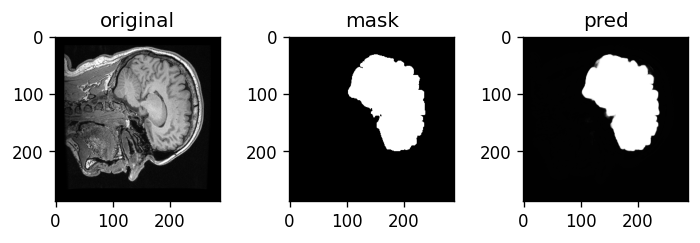

Train: Epoch 11 | Batch: 110 | Combined Loss: 0.029912639409303665 | BCE 0.020044613629579544 | dice_loss 0.009868025779724121
Train: Epoch 11 | Batch: 120 | Combined Loss: 0.031052809208631516 | BCE 0.021187227219343185 | dice_loss 0.00986558198928833
Train: Epoch 11 | Batch: 130 | Combined Loss: 0.03282921016216278 | BCE 0.021807776764035225 | dice_loss 0.011021435260772705
Train: Epoch 11 | Batch: 140 | Combined Loss: 0.042496487498283386 | BCE 0.02555154263973236 | dice_loss 0.016944944858551025
Train: Epoch 11 | Batch: 150 | Combined Loss: 0.031875867396593094 | BCE 0.02184106782078743 | dice_loss 0.010034799575805664
Train: Epoch 11 | Batch: 160 | Combined Loss: 0.028214575722813606 | BCE 0.019407453015446663 | dice_loss 0.008807122707366943
Train: Epoch 11 | Batch: 170 | Combined Loss: 0.029044006019830704 | BCE 0.019569966942071915 | dice_loss 0.009474039077758789
Train: Epoch 11 | Batch: 180 | Combined Loss: 0.041993264108896255 | BCE 0.02609861269593239 | dice_loss 0.01589465

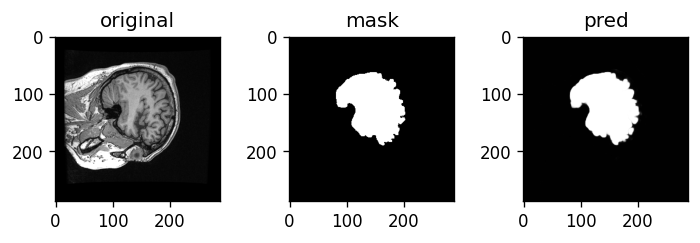

Train: Epoch 11 | Batch: 210 | Combined Loss: 0.03015315718948841 | BCE 0.020283998921513557 | dice_loss 0.009869158267974854
Train: Epoch 11 | Batch: 220 | Combined Loss: 0.03079664520919323 | BCE 0.020525632426142693 | dice_loss 0.010271012783050537
Train: Epoch 11 | Batch: 230 | Combined Loss: 0.038884736597537994 | BCE 0.025091206654906273 | dice_loss 0.013793528079986572
Train: Epoch 11 | Batch: 240 | Combined Loss: 0.024639632552862167 | BCE 0.017362620681524277 | dice_loss 0.007277011871337891
Train: Epoch 11 | Batch: 250 | Combined Loss: 0.03241460770368576 | BCE 0.021243922412395477 | dice_loss 0.011170685291290283
Train: Epoch 11 | Batch: 260 | Combined Loss: 0.030901486054062843 | BCE 0.020340854302048683 | dice_loss 0.01056063175201416
Train: Epoch 11 | Batch: 270 | Combined Loss: 0.03246508538722992 | BCE 0.021312398836016655 | dice_loss 0.011152684688568115
Train: Epoch 11 | Batch: 280 | Combined Loss: 0.02474771998822689 | BCE 0.017338981851935387 | dice_loss 0.007408738

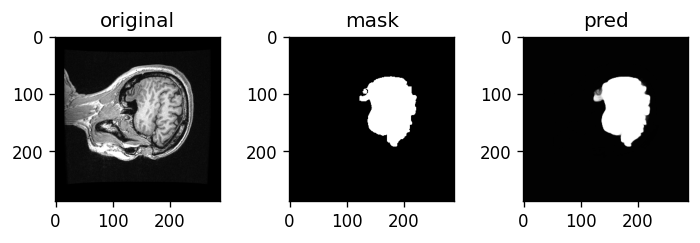

Train: Epoch 11 | Batch: 310 | Combined Loss: 0.032205238938331604 | BCE 0.020801620557904243 | dice_loss 0.01140362024307251
Train: Epoch 11 | Batch: 320 | Combined Loss: 0.03382767736911774 | BCE 0.02133728377521038 | dice_loss 0.012490391731262207
Train: Epoch 11 | Batch: 330 | Combined Loss: 0.028644366189837456 | BCE 0.01962028257548809 | dice_loss 0.009024083614349365
Train: Epoch 11 | Batch: 340 | Combined Loss: 0.029450541362166405 | BCE 0.020229345187544823 | dice_loss 0.009221196174621582
Train: Epoch 11 | Batch: 350 | Combined Loss: 0.02758275903761387 | BCE 0.018488043919205666 | dice_loss 0.009094715118408203
Train: Epoch 11 | Batch: 360 | Combined Loss: 0.027516420930624008 | BCE 0.01857953891158104 | dice_loss 0.008936882019042969
Train: Epoch 11 | Batch: 370 | Combined Loss: 0.02934817038476467 | BCE 0.01956871710717678 | dice_loss 0.00977945327758789
Train: Epoch 11 | Batch: 380 | Combined Loss: 0.03021196275949478 | BCE 0.02041391283273697 | dice_loss 0.00979804992675

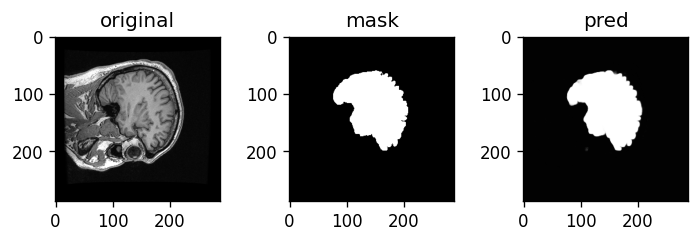

Train: Epoch 11 | Batch: 410 | Combined Loss: 0.03329792618751526 | BCE 0.020862968638539314 | dice_loss 0.012434959411621094
Train: Epoch 11 | Batch: 420 | Combined Loss: 0.032720211893320084 | BCE 0.020839158445596695 | dice_loss 0.011881053447723389
Train: Epoch 11 | Batch: 430 | Combined Loss: 0.026111401617527008 | BCE 0.01764027029275894 | dice_loss 0.008471131324768066
Train: Epoch 11 | Batch: 440 | Combined Loss: 0.029728371649980545 | BCE 0.019478101283311844 | dice_loss 0.010250270366668701
Train: Epoch 11 | Batch: 450 | Combined Loss: 0.027458488941192627 | BCE 0.01817190647125244 | dice_loss 0.009286582469940186
Train: Epoch 11 | Batch: 460 | Combined Loss: 0.02844303287565708 | BCE 0.019068235531449318 | dice_loss 0.009374797344207764
Train: Epoch 11 | Batch: 470 | Combined Loss: 0.03458470106124878 | BCE 0.021336494013667107 | dice_loss 0.013248205184936523
Train: Epoch 11 | Batch: 480 | Combined Loss: 0.03157447278499603 | BCE 0.019718332216143608 | dice_loss 0.011856138

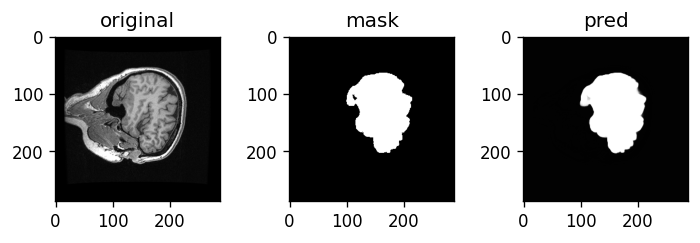

Avg train loss for epoch  --> 0.03184126259707533 | BCE: 0.020932617553108532 | dice_loss: 0.010908645014517864
Val: Epoch 11 | Batch: 0 | Combined Loss: 0.028361253440380096 | BCE 0.01844661682844162 | dice_loss 0.009914636611938477


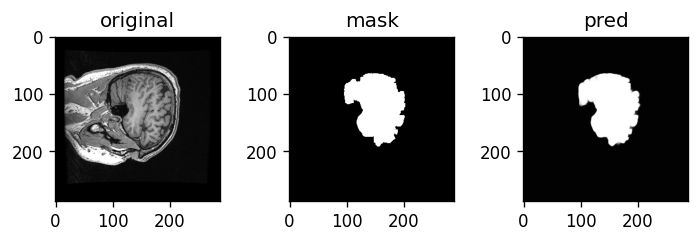

Val: Epoch 11 | Batch: 10 | Combined Loss: 0.03321484476327896 | BCE 0.016881024464964867 | dice_loss 0.016333818435668945
Val: Epoch 11 | Batch: 20 | Combined Loss: 0.030049776658415794 | BCE 0.019031381234526634 | dice_loss 0.01101839542388916
Val: Epoch 11 | Batch: 30 | Combined Loss: 0.031835369765758514 | BCE 0.02021842636168003 | dice_loss 0.011616945266723633


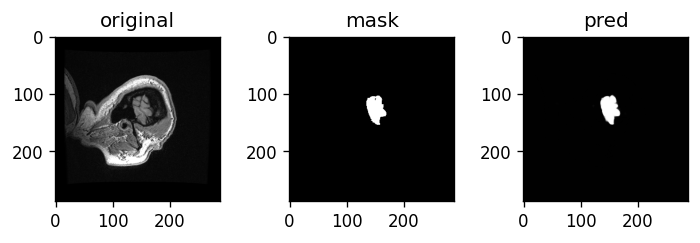

Val: Epoch 11 | Batch: 40 | Combined Loss: 0.03010004200041294 | BCE 0.019045645371079445 | dice_loss 0.011054396629333496
Val: Epoch 11 | Batch: 50 | Combined Loss: 0.02649473398923874 | BCE 0.01787882298231125 | dice_loss 0.00861591100692749
Val: Epoch 11 | Batch: 60 | Combined Loss: 0.029100626707077026 | BCE 0.019068211317062378 | dice_loss 0.010032415390014648


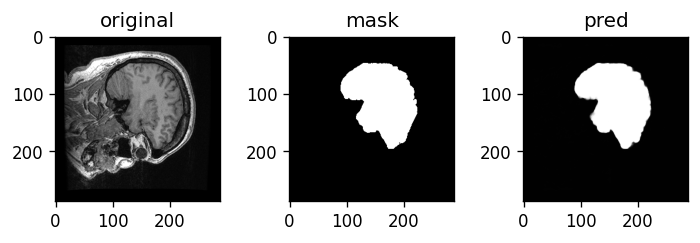

Val: Epoch 11 | Batch: 70 | Combined Loss: 0.028041020035743713 | BCE 0.019306138157844543 | dice_loss 0.00873488187789917
Val: Epoch 11 | Batch: 80 | Combined Loss: 0.029685543850064278 | BCE 0.018221603706479073 | dice_loss 0.011463940143585205
Val: Epoch 11 | Batch: 90 | Combined Loss: 0.027317654341459274 | BCE 0.018085550516843796 | dice_loss 0.009232103824615479


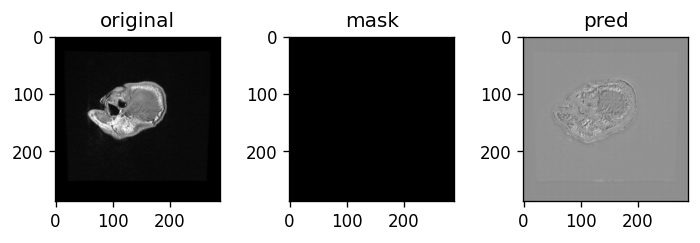

Val: Epoch 11 | Batch: 100 | Combined Loss: 0.028408482670783997 | BCE 0.01849396526813507 | dice_loss 0.009914517402648926
Val: Epoch 11 | Batch: 110 | Combined Loss: 0.031377047300338745 | BCE 0.019712179899215698 | dice_loss 0.011664867401123047
Val: Epoch 11 | Batch: 120 | Combined Loss: 0.029945621266961098 | BCE 0.01879269815981388 | dice_loss 0.011152923107147217


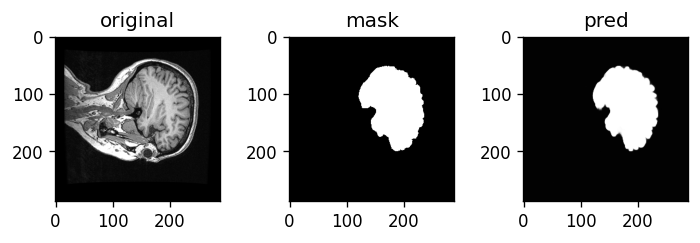

Val: Epoch 11 | Batch: 130 | Combined Loss: 0.0306511539965868 | BCE 0.019775452092289925 | dice_loss 0.010875701904296875
Val: Epoch 11 | Batch: 140 | Combined Loss: 0.02671213075518608 | BCE 0.01860405132174492 | dice_loss 0.008108079433441162
Val: Epoch 11 | Batch: 150 | Combined Loss: 0.029408367350697517 | BCE 0.019069166854023933 | dice_loss 0.010339200496673584


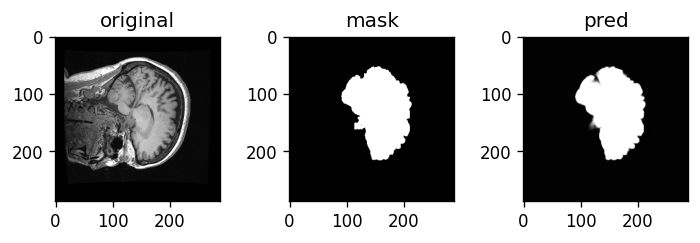

Average val loss for epoch  --> 0.02964148629689589 | BCE: 0.018853334221057595 | dice_loss: 0.010788151994347572
****************************************************************************************************
Train: Epoch 12 | Batch: 0 | Combined Loss: 0.03360197693109512 | BCE 0.02198580466210842 | dice_loss 0.011616170406341553


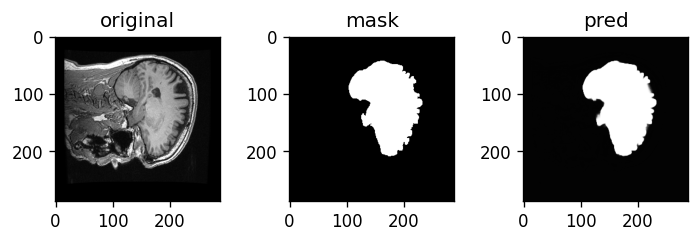

Train: Epoch 12 | Batch: 10 | Combined Loss: 0.02564997412264347 | BCE 0.017109164968132973 | dice_loss 0.008540809154510498
Train: Epoch 12 | Batch: 20 | Combined Loss: 0.027577398344874382 | BCE 0.017853615805506706 | dice_loss 0.009723782539367676
Train: Epoch 12 | Batch: 30 | Combined Loss: 0.030067745596170425 | BCE 0.019689444452524185 | dice_loss 0.01037830114364624
Train: Epoch 12 | Batch: 40 | Combined Loss: 0.02430247887969017 | BCE 0.017049845308065414 | dice_loss 0.007252633571624756
Train: Epoch 12 | Batch: 50 | Combined Loss: 0.030571354553103447 | BCE 0.01940150372684002 | dice_loss 0.011169850826263428
Train: Epoch 12 | Batch: 60 | Combined Loss: 0.026733549311757088 | BCE 0.017406495288014412 | dice_loss 0.009327054023742676
Train: Epoch 12 | Batch: 70 | Combined Loss: 0.03284263610839844 | BCE 0.020569205284118652 | dice_loss 0.012273430824279785
Train: Epoch 12 | Batch: 80 | Combined Loss: 0.026195300742983818 | BCE 0.017179204151034355 | dice_loss 0.0090160965919494

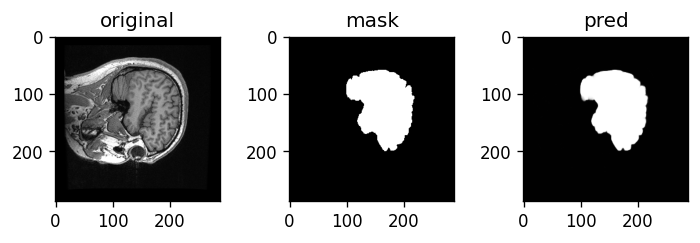

Train: Epoch 12 | Batch: 110 | Combined Loss: 0.025132790207862854 | BCE 0.017034009099006653 | dice_loss 0.008098781108856201
Train: Epoch 12 | Batch: 120 | Combined Loss: 0.028365107253193855 | BCE 0.018226059153676033 | dice_loss 0.010139048099517822
Train: Epoch 12 | Batch: 130 | Combined Loss: 0.030542153865098953 | BCE 0.019142169505357742 | dice_loss 0.011399984359741211
Train: Epoch 12 | Batch: 140 | Combined Loss: 0.027990959584712982 | BCE 0.017711304128170013 | dice_loss 0.010279655456542969
Train: Epoch 12 | Batch: 150 | Combined Loss: 0.02477116324007511 | BCE 0.017036447301506996 | dice_loss 0.007734715938568115
Train: Epoch 12 | Batch: 160 | Combined Loss: 0.026931406930088997 | BCE 0.01786029525101185 | dice_loss 0.009071111679077148
Train: Epoch 12 | Batch: 170 | Combined Loss: 0.031030114740133286 | BCE 0.01943093165755272 | dice_loss 0.011599183082580566
Train: Epoch 12 | Batch: 180 | Combined Loss: 0.029205992817878723 | BCE 0.018912866711616516 | dice_loss 0.010293

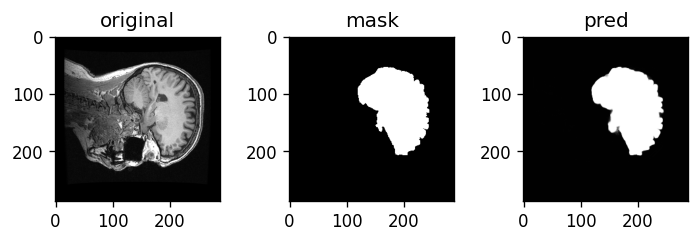

Train: Epoch 12 | Batch: 210 | Combined Loss: 0.02723497338593006 | BCE 0.017600836232304573 | dice_loss 0.009634137153625488
Train: Epoch 12 | Batch: 220 | Combined Loss: 0.0247411597520113 | BCE 0.016135917976498604 | dice_loss 0.008605241775512695
Train: Epoch 12 | Batch: 230 | Combined Loss: 0.028160322457551956 | BCE 0.01760702207684517 | dice_loss 0.010553300380706787
Train: Epoch 12 | Batch: 240 | Combined Loss: 0.030707543715834618 | BCE 0.018911486491560936 | dice_loss 0.011796057224273682
Train: Epoch 12 | Batch: 250 | Combined Loss: 0.02983127161860466 | BCE 0.01893548294901848 | dice_loss 0.010895788669586182
Train: Epoch 12 | Batch: 260 | Combined Loss: 0.026011012494564056 | BCE 0.01691713184118271 | dice_loss 0.009093880653381348
Train: Epoch 12 | Batch: 270 | Combined Loss: 0.023929784074425697 | BCE 0.015980729833245277 | dice_loss 0.00794905424118042
Train: Epoch 12 | Batch: 280 | Combined Loss: 0.026240887120366096 | BCE 0.016695084050297737 | dice_loss 0.00954580307

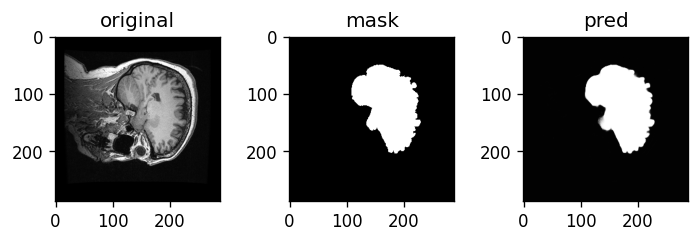

Train: Epoch 12 | Batch: 310 | Combined Loss: 0.02466856688261032 | BCE 0.016171924769878387 | dice_loss 0.008496642112731934
Train: Epoch 12 | Batch: 320 | Combined Loss: 0.027675393968820572 | BCE 0.017381135374307632 | dice_loss 0.01029425859451294
Train: Epoch 12 | Batch: 330 | Combined Loss: 0.02634495496749878 | BCE 0.016685903072357178 | dice_loss 0.009659051895141602
Train: Epoch 12 | Batch: 340 | Combined Loss: 0.029245467856526375 | BCE 0.018550070002675056 | dice_loss 0.010695397853851318
Train: Epoch 12 | Batch: 350 | Combined Loss: 0.028897013515233994 | BCE 0.017911221832036972 | dice_loss 0.010985791683197021
Train: Epoch 12 | Batch: 360 | Combined Loss: 0.0279788076877594 | BCE 0.017233818769454956 | dice_loss 0.010744988918304443
Train: Epoch 12 | Batch: 370 | Combined Loss: 0.028347454965114594 | BCE 0.0181020125746727 | dice_loss 0.010245442390441895
Train: Epoch 12 | Batch: 380 | Combined Loss: 0.031225131824612617 | BCE 0.018851684406399727 | dice_loss 0.0123734474

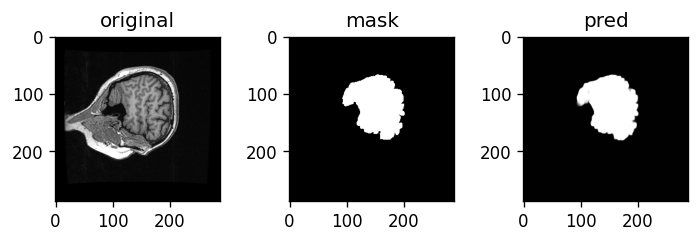

Train: Epoch 12 | Batch: 410 | Combined Loss: 0.024104664102196693 | BCE 0.016167649999260902 | dice_loss 0.007937014102935791
Train: Epoch 12 | Batch: 420 | Combined Loss: 0.032454878091812134 | BCE 0.01969197392463684 | dice_loss 0.012762904167175293
Train: Epoch 12 | Batch: 430 | Combined Loss: 0.029538143426179886 | BCE 0.018459070473909378 | dice_loss 0.011079072952270508
Train: Epoch 12 | Batch: 440 | Combined Loss: 0.022273872047662735 | BCE 0.014559242874383926 | dice_loss 0.007714629173278809
Train: Epoch 12 | Batch: 450 | Combined Loss: 0.02175164222717285 | BCE 0.01466274168342352 | dice_loss 0.007088899612426758
Train: Epoch 12 | Batch: 460 | Combined Loss: 0.02438429370522499 | BCE 0.01548454537987709 | dice_loss 0.0088997483253479
Train: Epoch 12 | Batch: 470 | Combined Loss: 0.026193570345640182 | BCE 0.01650465652346611 | dice_loss 0.009688913822174072
Train: Epoch 12 | Batch: 480 | Combined Loss: 0.028859294950962067 | BCE 0.018224753439426422 | dice_loss 0.01063454151

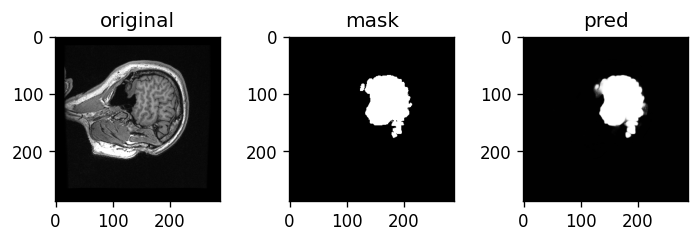

Avg train loss for epoch  --> 0.027741557233801235 | BCE: 0.017825193673725655 | dice_loss: 0.009916363497496593
Val: Epoch 12 | Batch: 0 | Combined Loss: 0.023571504279971123 | BCE 0.015714121982455254 | dice_loss 0.00785738229751587


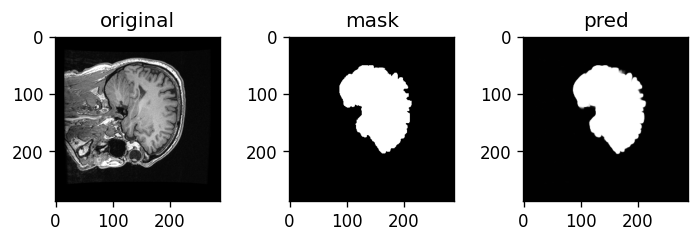

Val: Epoch 12 | Batch: 10 | Combined Loss: 0.03465009108185768 | BCE 0.021938804537057877 | dice_loss 0.012711286544799805
Val: Epoch 12 | Batch: 20 | Combined Loss: 0.025631604716181755 | BCE 0.01627647690474987 | dice_loss 0.009355127811431885
Val: Epoch 12 | Batch: 30 | Combined Loss: 0.026018278673291206 | BCE 0.015267090871930122 | dice_loss 0.010751187801361084


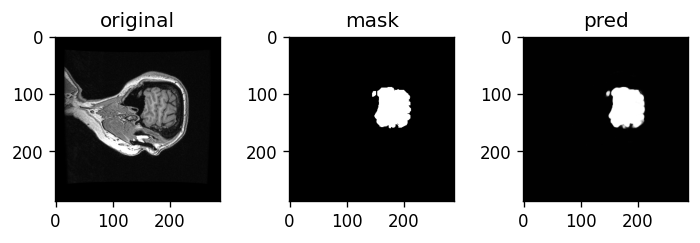

Val: Epoch 12 | Batch: 40 | Combined Loss: 0.02549264393746853 | BCE 0.01465061865746975 | dice_loss 0.01084202527999878
Val: Epoch 12 | Batch: 50 | Combined Loss: 0.02689467743039131 | BCE 0.014606463722884655 | dice_loss 0.012288212776184082
Val: Epoch 12 | Batch: 60 | Combined Loss: 0.02780342847108841 | BCE 0.017144806683063507 | dice_loss 0.010658621788024902


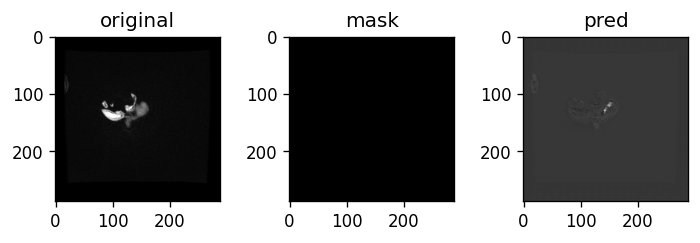

Val: Epoch 12 | Batch: 70 | Combined Loss: 0.03388345241546631 | BCE 0.021000860258936882 | dice_loss 0.012882590293884277
Val: Epoch 12 | Batch: 80 | Combined Loss: 0.026037439703941345 | BCE 0.01629255712032318 | dice_loss 0.009744882583618164
Val: Epoch 12 | Batch: 90 | Combined Loss: 0.025699332356452942 | BCE 0.016527250409126282 | dice_loss 0.00917208194732666


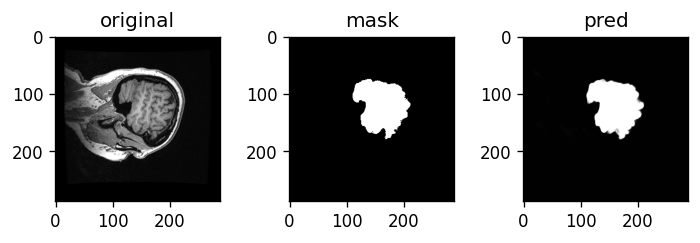

Val: Epoch 12 | Batch: 100 | Combined Loss: 0.030067212879657745 | BCE 0.017531998455524445 | dice_loss 0.0125352144241333
Val: Epoch 12 | Batch: 110 | Combined Loss: 0.025451626628637314 | BCE 0.015331235714256763 | dice_loss 0.010120391845703125
Val: Epoch 12 | Batch: 120 | Combined Loss: 0.031531933695077896 | BCE 0.016992393881082535 | dice_loss 0.014539539813995361


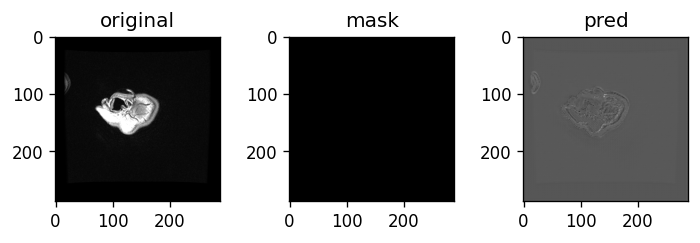

Val: Epoch 12 | Batch: 130 | Combined Loss: 0.026137426495552063 | BCE 0.016411975026130676 | dice_loss 0.009725451469421387
Val: Epoch 12 | Batch: 140 | Combined Loss: 0.02976912632584572 | BCE 0.01842964068055153 | dice_loss 0.01133948564529419
Val: Epoch 12 | Batch: 150 | Combined Loss: 0.027814749628305435 | BCE 0.017078999429941177 | dice_loss 0.010735750198364258


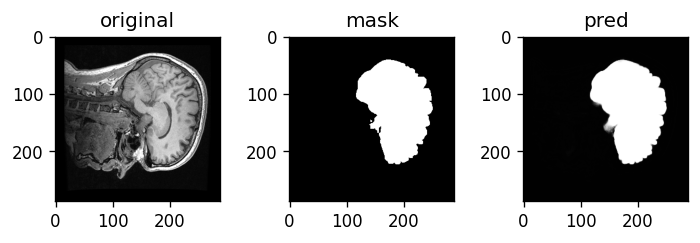

Average val loss for epoch  --> 0.027056828571949153 | BCE: 0.01647306612576358 | dice_loss: 0.01058376245200634
****************************************************************************************************
Train: Epoch 13 | Batch: 0 | Combined Loss: 0.02612551487982273 | BCE 0.01636185683310032 | dice_loss 0.009763658046722412


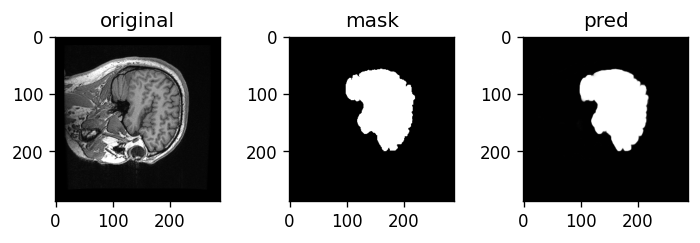

Train: Epoch 13 | Batch: 10 | Combined Loss: 0.029494835063815117 | BCE 0.01836348883807659 | dice_loss 0.011131346225738525
Train: Epoch 13 | Batch: 20 | Combined Loss: 0.0257016159594059 | BCE 0.016859564930200577 | dice_loss 0.008842051029205322
Train: Epoch 13 | Batch: 30 | Combined Loss: 0.02395673468708992 | BCE 0.015367765910923481 | dice_loss 0.008588969707489014
Train: Epoch 13 | Batch: 40 | Combined Loss: 0.023390498012304306 | BCE 0.014801708050072193 | dice_loss 0.008588790893554688
Train: Epoch 13 | Batch: 50 | Combined Loss: 0.028548143804073334 | BCE 0.01761706918478012 | dice_loss 0.010931074619293213
Train: Epoch 13 | Batch: 60 | Combined Loss: 0.029233844950795174 | BCE 0.017324360087513924 | dice_loss 0.01190948486328125
Train: Epoch 13 | Batch: 70 | Combined Loss: 0.027257656678557396 | BCE 0.016861354932188988 | dice_loss 0.010396301746368408
Train: Epoch 13 | Batch: 80 | Combined Loss: 0.027195101603865623 | BCE 0.01717502437531948 | dice_loss 0.010020077228546143

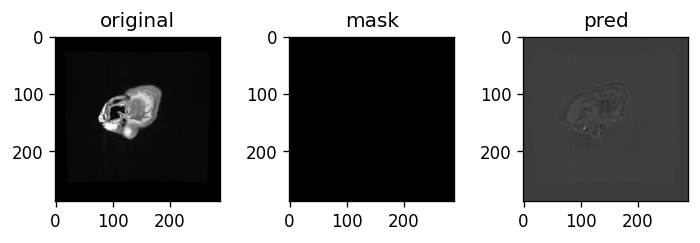

Train: Epoch 13 | Batch: 110 | Combined Loss: 0.02694353647530079 | BCE 0.016851933673024178 | dice_loss 0.010091602802276611
Train: Epoch 13 | Batch: 120 | Combined Loss: 0.02263057604432106 | BCE 0.014397922903299332 | dice_loss 0.008232653141021729
Train: Epoch 13 | Batch: 130 | Combined Loss: 0.02330118604004383 | BCE 0.015092791989445686 | dice_loss 0.008208394050598145
Train: Epoch 13 | Batch: 140 | Combined Loss: 0.02247157134115696 | BCE 0.01435014046728611 | dice_loss 0.00812143087387085
Train: Epoch 13 | Batch: 150 | Combined Loss: 0.032943740487098694 | BCE 0.018839195370674133 | dice_loss 0.01410454511642456
Train: Epoch 13 | Batch: 160 | Combined Loss: 0.024861957877874374 | BCE 0.015365268103778362 | dice_loss 0.009496688842773438
Train: Epoch 13 | Batch: 170 | Combined Loss: 0.02333936095237732 | BCE 0.014863939024508 | dice_loss 0.008475422859191895
Train: Epoch 13 | Batch: 180 | Combined Loss: 0.030437113717198372 | BCE 0.01763087697327137 | dice_loss 0.012806236743927

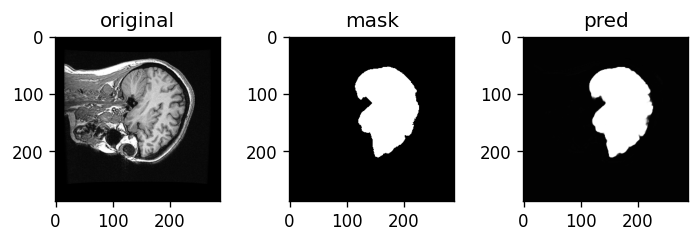

Train: Epoch 13 | Batch: 210 | Combined Loss: 0.02500322461128235 | BCE 0.01520815584808588 | dice_loss 0.009795069694519043
Train: Epoch 13 | Batch: 220 | Combined Loss: 0.026417767629027367 | BCE 0.016139065846800804 | dice_loss 0.010278701782226562
Train: Epoch 13 | Batch: 230 | Combined Loss: 0.025769496336579323 | BCE 0.01583709754049778 | dice_loss 0.009932398796081543
Train: Epoch 13 | Batch: 240 | Combined Loss: 0.024867668747901917 | BCE 0.015127970837056637 | dice_loss 0.009739696979522705
Train: Epoch 13 | Batch: 250 | Combined Loss: 0.025351176038384438 | BCE 0.015296170487999916 | dice_loss 0.010055005550384521
Train: Epoch 13 | Batch: 260 | Combined Loss: 0.024394463747739792 | BCE 0.015739332884550095 | dice_loss 0.008655130863189697
Train: Epoch 13 | Batch: 270 | Combined Loss: 0.024242814630270004 | BCE 0.015022809617221355 | dice_loss 0.009220004081726074
Train: Epoch 13 | Batch: 280 | Combined Loss: 0.024768978357315063 | BCE 0.015021889470517635 | dice_loss 0.009747

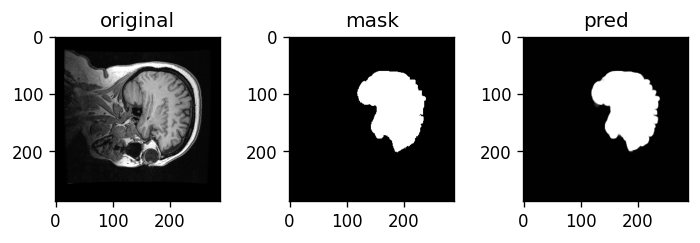

Train: Epoch 13 | Batch: 310 | Combined Loss: 0.02287924848496914 | BCE 0.01460534892976284 | dice_loss 0.008273899555206299
Train: Epoch 13 | Batch: 320 | Combined Loss: 0.025428131222724915 | BCE 0.01576007902622223 | dice_loss 0.009668052196502686
Train: Epoch 13 | Batch: 330 | Combined Loss: 0.022658303380012512 | BCE 0.014805511571466923 | dice_loss 0.007852792739868164
Train: Epoch 13 | Batch: 340 | Combined Loss: 0.021861694753170013 | BCE 0.013868534006178379 | dice_loss 0.007993161678314209
Train: Epoch 13 | Batch: 350 | Combined Loss: 0.028837386518716812 | BCE 0.017161373049020767 | dice_loss 0.011676013469696045
Train: Epoch 13 | Batch: 360 | Combined Loss: 0.026957416906952858 | BCE 0.01588752306997776 | dice_loss 0.011069893836975098
Train: Epoch 13 | Batch: 370 | Combined Loss: 0.022833378985524178 | BCE 0.014532061293721199 | dice_loss 0.008301317691802979
Train: Epoch 13 | Batch: 380 | Combined Loss: 0.024748463183641434 | BCE 0.01483650878071785 | dice_loss 0.00991195

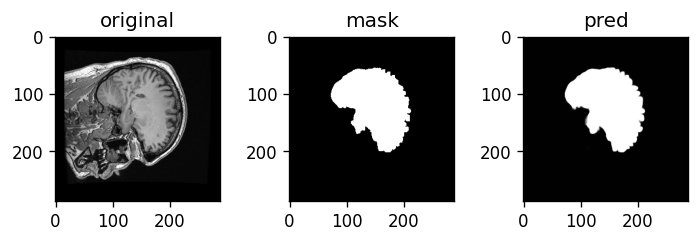

Train: Epoch 13 | Batch: 410 | Combined Loss: 0.023333312943577766 | BCE 0.014396967366337776 | dice_loss 0.00893634557723999
Train: Epoch 13 | Batch: 420 | Combined Loss: 0.026226680725812912 | BCE 0.015709202736616135 | dice_loss 0.010517477989196777
Train: Epoch 13 | Batch: 430 | Combined Loss: 0.020184267312288284 | BCE 0.013100375421345234 | dice_loss 0.007083892822265625
Train: Epoch 13 | Batch: 440 | Combined Loss: 0.023309189826250076 | BCE 0.014280397444963455 | dice_loss 0.009028792381286621
Train: Epoch 13 | Batch: 450 | Combined Loss: 0.022834468632936478 | BCE 0.013818013481795788 | dice_loss 0.009016454219818115
Train: Epoch 13 | Batch: 460 | Combined Loss: 0.0224924199283123 | BCE 0.014127981849014759 | dice_loss 0.008364439010620117
Train: Epoch 13 | Batch: 470 | Combined Loss: 0.025183867663145065 | BCE 0.014928231947124004 | dice_loss 0.010255634784698486
Train: Epoch 13 | Batch: 480 | Combined Loss: 0.022315887734293938 | BCE 0.013790754601359367 | dice_loss 0.008525

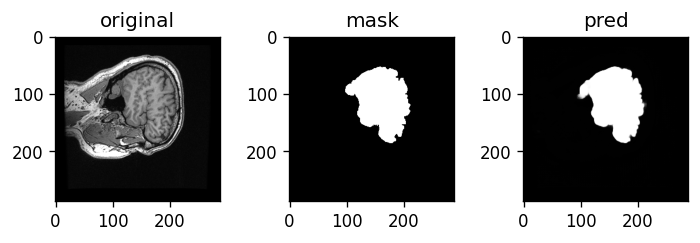

Avg train loss for epoch  --> 0.024865974465996143 | BCE: 0.015394868527947678 | dice_loss: 0.009471105963816284
Val: Epoch 13 | Batch: 0 | Combined Loss: 0.02495582588016987 | BCE 0.016128020361065865 | dice_loss 0.008827805519104004


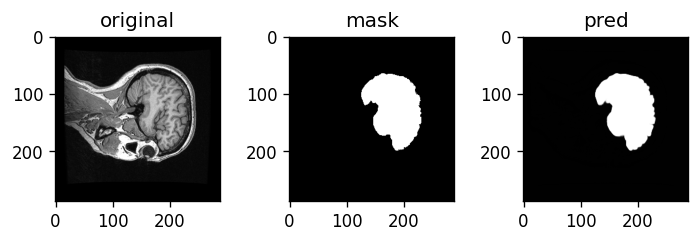

Val: Epoch 13 | Batch: 10 | Combined Loss: 0.024486612528562546 | BCE 0.014239680953323841 | dice_loss 0.01024693250656128
Val: Epoch 13 | Batch: 20 | Combined Loss: 0.022246399894356728 | BCE 0.0125871691852808 | dice_loss 0.009659230709075928
Val: Epoch 13 | Batch: 30 | Combined Loss: 0.022910375148057938 | BCE 0.0140202222391963 | dice_loss 0.008890151977539062


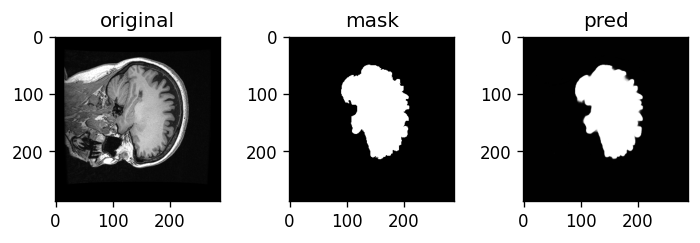

Val: Epoch 13 | Batch: 40 | Combined Loss: 0.03230353444814682 | BCE 0.019156478345394135 | dice_loss 0.013147056102752686
Val: Epoch 13 | Batch: 50 | Combined Loss: 0.027065422385931015 | BCE 0.015401984564960003 | dice_loss 0.011663436889648438
Val: Epoch 13 | Batch: 60 | Combined Loss: 0.022673822939395905 | BCE 0.01371774822473526 | dice_loss 0.008956074714660645


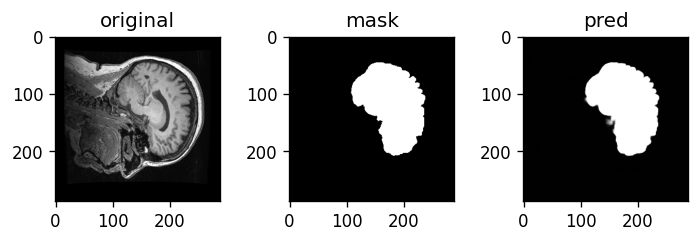

Val: Epoch 13 | Batch: 70 | Combined Loss: 0.028963610529899597 | BCE 0.017199918627738953 | dice_loss 0.011763691902160645
Val: Epoch 13 | Batch: 80 | Combined Loss: 0.027795396745204926 | BCE 0.015562496148049831 | dice_loss 0.01223289966583252
Val: Epoch 13 | Batch: 90 | Combined Loss: 0.02381615713238716 | BCE 0.01366423349827528 | dice_loss 0.010151922702789307


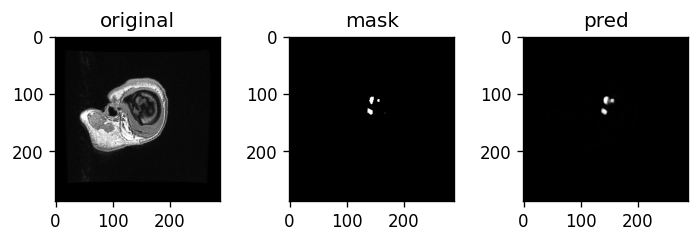

Val: Epoch 13 | Batch: 100 | Combined Loss: 0.025742636993527412 | BCE 0.015275107696652412 | dice_loss 0.010467529296875
Val: Epoch 13 | Batch: 110 | Combined Loss: 0.02638103812932968 | BCE 0.015725158154964447 | dice_loss 0.010655879974365234
Val: Epoch 13 | Batch: 120 | Combined Loss: 0.024964775890111923 | BCE 0.014644172973930836 | dice_loss 0.010320603847503662


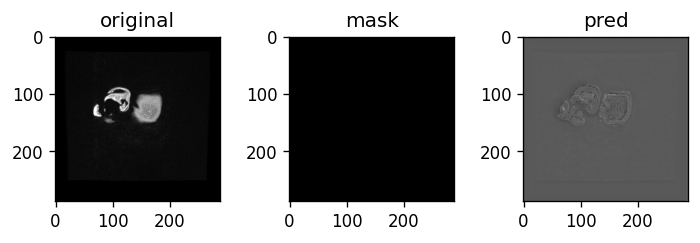

Val: Epoch 13 | Batch: 130 | Combined Loss: 0.027494963258504868 | BCE 0.015870388597249985 | dice_loss 0.011624574661254883
Val: Epoch 13 | Batch: 140 | Combined Loss: 0.02894751913845539 | BCE 0.01585070975124836 | dice_loss 0.013096809387207031
Val: Epoch 13 | Batch: 150 | Combined Loss: 0.028986698016524315 | BCE 0.015579288825392723 | dice_loss 0.013407409191131592


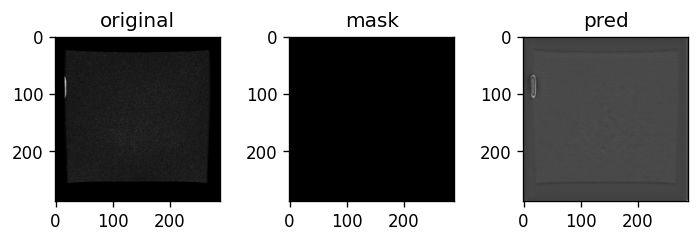

Average val loss for epoch  --> 0.025627302983775736 | BCE: 0.015024009638000279 | dice_loss: 0.010603293403983116
****************************************************************************************************
Train: Epoch 14 | Batch: 0 | Combined Loss: 0.0283676665276289 | BCE 0.015956012532114983 | dice_loss 0.012411653995513916


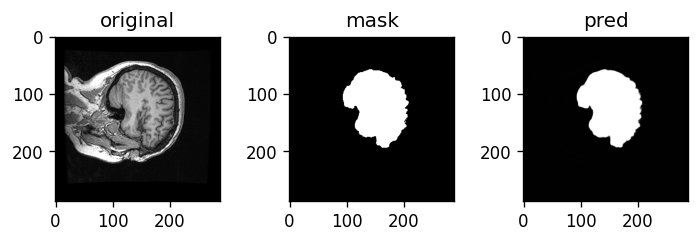

Train: Epoch 14 | Batch: 10 | Combined Loss: 0.023533141240477562 | BCE 0.014042412862181664 | dice_loss 0.009490728378295898
Train: Epoch 14 | Batch: 20 | Combined Loss: 0.021193990483880043 | BCE 0.01324666477739811 | dice_loss 0.007947325706481934
Train: Epoch 14 | Batch: 30 | Combined Loss: 0.027448927983641624 | BCE 0.016092991456389427 | dice_loss 0.011355936527252197
Train: Epoch 14 | Batch: 40 | Combined Loss: 0.024249443784356117 | BCE 0.014449546113610268 | dice_loss 0.00979989767074585
Train: Epoch 14 | Batch: 50 | Combined Loss: 0.023984193801879883 | BCE 0.014184893108904362 | dice_loss 0.009799301624298096
Train: Epoch 14 | Batch: 60 | Combined Loss: 0.01988399401307106 | BCE 0.012547616846859455 | dice_loss 0.00733637809753418
Train: Epoch 14 | Batch: 70 | Combined Loss: 0.053061652928590775 | BCE 0.02846001461148262 | dice_loss 0.024601638317108154
Train: Epoch 14 | Batch: 80 | Combined Loss: 0.027567412704229355 | BCE 0.01558562833815813 | dice_loss 0.01198178529739379

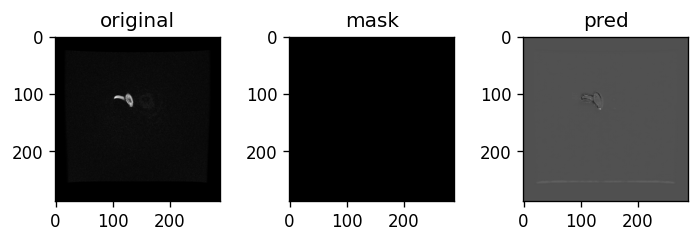

Train: Epoch 14 | Batch: 110 | Combined Loss: 0.02955349162220955 | BCE 0.01684238389134407 | dice_loss 0.012711107730865479
Train: Epoch 14 | Batch: 120 | Combined Loss: 0.023000666871666908 | BCE 0.013703057542443275 | dice_loss 0.009297609329223633
Train: Epoch 14 | Batch: 130 | Combined Loss: 0.03165730834007263 | BCE 0.016804369166493416 | dice_loss 0.014852941036224365
Train: Epoch 14 | Batch: 140 | Combined Loss: 0.02251465432345867 | BCE 0.013756586238741875 | dice_loss 0.008758068084716797
Train: Epoch 14 | Batch: 150 | Combined Loss: 0.025415897369384766 | BCE 0.014627874828875065 | dice_loss 0.010788023471832275
Train: Epoch 14 | Batch: 160 | Combined Loss: 0.030167313292622566 | BCE 0.017474325373768806 | dice_loss 0.01269298791885376
Train: Epoch 14 | Batch: 170 | Combined Loss: 0.020598331466317177 | BCE 0.01262066699564457 | dice_loss 0.007977664470672607
Train: Epoch 14 | Batch: 180 | Combined Loss: 0.026099342852830887 | BCE 0.014776964671909809 | dice_loss 0.011322379

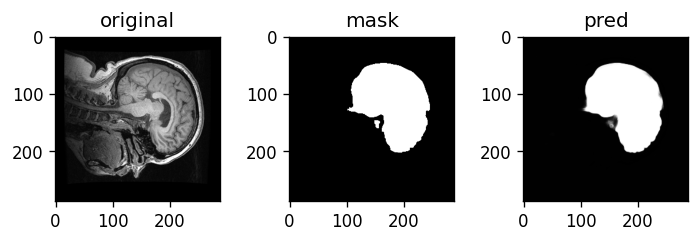

Train: Epoch 14 | Batch: 210 | Combined Loss: 0.022946137934923172 | BCE 0.01343889907002449 | dice_loss 0.009507238864898682
Train: Epoch 14 | Batch: 220 | Combined Loss: 0.023826315999031067 | BCE 0.013865665532648563 | dice_loss 0.009960651397705078
Train: Epoch 14 | Batch: 230 | Combined Loss: 0.024023475125432014 | BCE 0.014081122353672981 | dice_loss 0.009942352771759033
Train: Epoch 14 | Batch: 240 | Combined Loss: 0.02410353161394596 | BCE 0.013744065538048744 | dice_loss 0.010359466075897217
Train: Epoch 14 | Batch: 250 | Combined Loss: 0.024343641474843025 | BCE 0.013803573325276375 | dice_loss 0.01054006814956665
Train: Epoch 14 | Batch: 260 | Combined Loss: 0.02761644870042801 | BCE 0.0157439187169075 | dice_loss 0.011872529983520508
Train: Epoch 14 | Batch: 270 | Combined Loss: 0.022608444094657898 | BCE 0.013666256330907345 | dice_loss 0.008942186832427979
Train: Epoch 14 | Batch: 280 | Combined Loss: 0.023346466943621635 | BCE 0.013573093339800835 | dice_loss 0.009773373

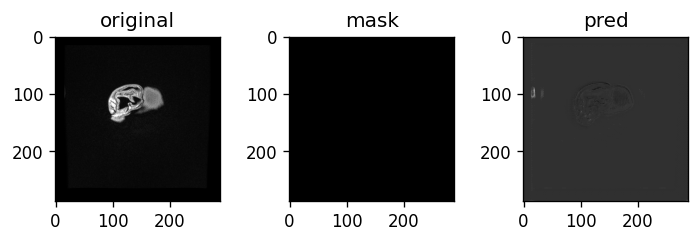

Train: Epoch 14 | Batch: 310 | Combined Loss: 0.022868536412715912 | BCE 0.013309561647474766 | dice_loss 0.00955897569656372
Train: Epoch 14 | Batch: 320 | Combined Loss: 0.01885441690683365 | BCE 0.01184634119272232 | dice_loss 0.007008075714111328
Train: Epoch 14 | Batch: 330 | Combined Loss: 0.019199421629309654 | BCE 0.01178978942334652 | dice_loss 0.007409632205963135
Train: Epoch 14 | Batch: 340 | Combined Loss: 0.024885762482881546 | BCE 0.013938713818788528 | dice_loss 0.010947048664093018
Train: Epoch 14 | Batch: 350 | Combined Loss: 0.01890142634510994 | BCE 0.011627989821135998 | dice_loss 0.007273435592651367
Train: Epoch 14 | Batch: 360 | Combined Loss: 0.021743031218647957 | BCE 0.012699218466877937 | dice_loss 0.00904381275177002
Train: Epoch 14 | Batch: 370 | Combined Loss: 0.02098935842514038 | BCE 0.012617767788469791 | dice_loss 0.008371591567993164
Train: Epoch 14 | Batch: 380 | Combined Loss: 0.019100036472082138 | BCE 0.011976984329521656 | dice_loss 0.0071230530

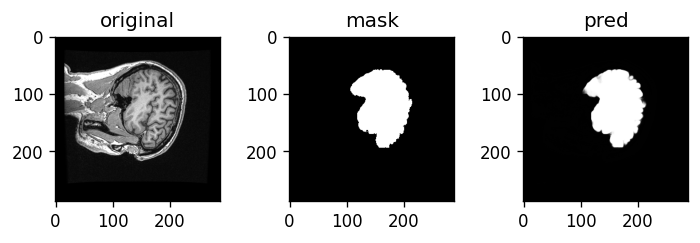

Train: Epoch 14 | Batch: 410 | Combined Loss: 0.021516812965273857 | BCE 0.012477768585085869 | dice_loss 0.009039044380187988
Train: Epoch 14 | Batch: 420 | Combined Loss: 0.02084079384803772 | BCE 0.012519209645688534 | dice_loss 0.008321583271026611
Train: Epoch 14 | Batch: 430 | Combined Loss: 0.019434811547398567 | BCE 0.011930527165532112 | dice_loss 0.007504284381866455
Train: Epoch 14 | Batch: 440 | Combined Loss: 0.018462948501110077 | BCE 0.01146345492452383 | dice_loss 0.006999492645263672
Train: Epoch 14 | Batch: 450 | Combined Loss: 0.02059115469455719 | BCE 0.012377218343317509 | dice_loss 0.008213937282562256
Train: Epoch 14 | Batch: 460 | Combined Loss: 0.021563056856393814 | BCE 0.012822572141885757 | dice_loss 0.008740484714508057
Train: Epoch 14 | Batch: 470 | Combined Loss: 0.025505568832159042 | BCE 0.014105823822319508 | dice_loss 0.01139974594116211
Train: Epoch 14 | Batch: 480 | Combined Loss: 0.023317761719226837 | BCE 0.013396628201007843 | dice_loss 0.0099211

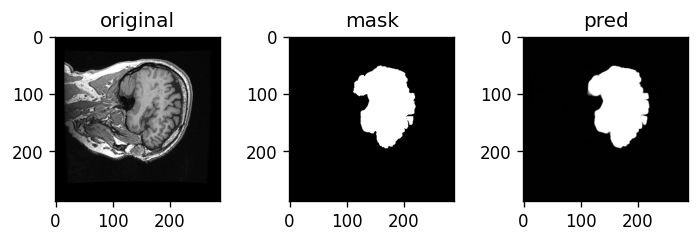

Avg train loss for epoch  --> 0.023683023212013744 | BCE: 0.013837817785782894 | dice_loss: 0.009845205446476993
Val: Epoch 14 | Batch: 0 | Combined Loss: 0.02033311314880848 | BCE 0.012203099206089973 | dice_loss 0.008130013942718506


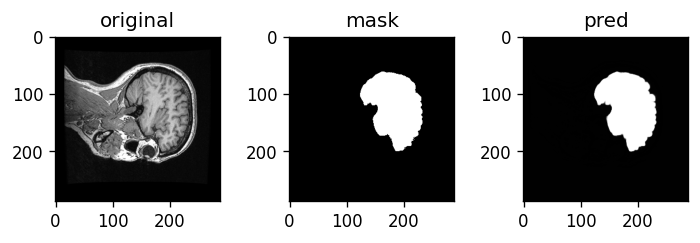

Val: Epoch 14 | Batch: 10 | Combined Loss: 0.020569780841469765 | BCE 0.013443449512124062 | dice_loss 0.007126331329345703
Val: Epoch 14 | Batch: 20 | Combined Loss: 0.0225745290517807 | BCE 0.012808487750589848 | dice_loss 0.009766042232513428
Val: Epoch 14 | Batch: 30 | Combined Loss: 0.02013641782104969 | BCE 0.012465836480259895 | dice_loss 0.007670581340789795


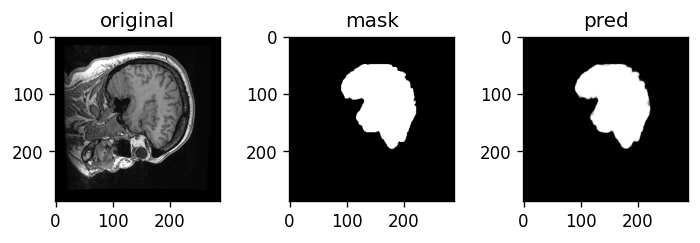

Val: Epoch 14 | Batch: 40 | Combined Loss: 0.020288214087486267 | BCE 0.01235102117061615 | dice_loss 0.007937192916870117
Val: Epoch 14 | Batch: 50 | Combined Loss: 0.02169465832412243 | BCE 0.012851176783442497 | dice_loss 0.008843481540679932
Val: Epoch 14 | Batch: 60 | Combined Loss: 0.02094373106956482 | BCE 0.010612815618515015 | dice_loss 0.010330915451049805


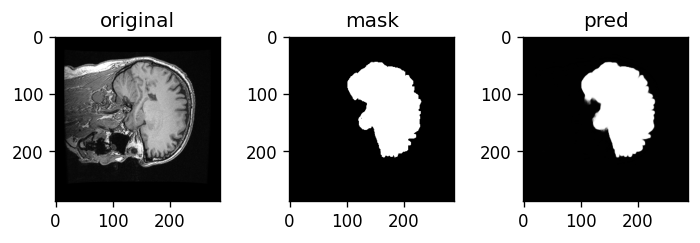

Val: Epoch 14 | Batch: 70 | Combined Loss: 0.019610974937677383 | BCE 0.011086496524512768 | dice_loss 0.008524477481842041
Val: Epoch 14 | Batch: 80 | Combined Loss: 0.02247145026922226 | BCE 0.011306366883218288 | dice_loss 0.011165082454681396
Val: Epoch 14 | Batch: 90 | Combined Loss: 0.023119650781154633 | BCE 0.013102077879011631 | dice_loss 0.010017573833465576


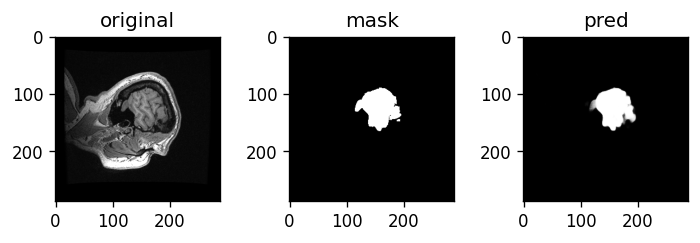

Val: Epoch 14 | Batch: 100 | Combined Loss: 0.02250184677541256 | BCE 0.013997932896018028 | dice_loss 0.008503913879394531
Val: Epoch 14 | Batch: 110 | Combined Loss: 0.020607460290193558 | BCE 0.012772727757692337 | dice_loss 0.00783473253250122
Val: Epoch 14 | Batch: 120 | Combined Loss: 0.022863639518618584 | BCE 0.01370478980243206 | dice_loss 0.009158849716186523


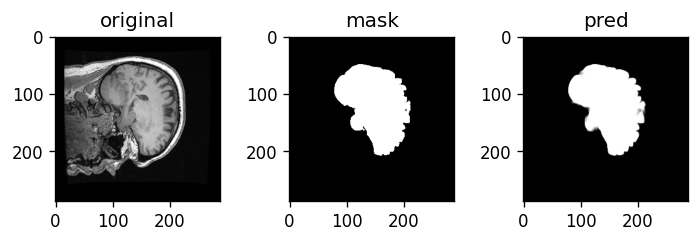

Val: Epoch 14 | Batch: 130 | Combined Loss: 0.025832662358880043 | BCE 0.014869341626763344 | dice_loss 0.0109633207321167
Val: Epoch 14 | Batch: 140 | Combined Loss: 0.0220441073179245 | BCE 0.011767670512199402 | dice_loss 0.010276436805725098
Val: Epoch 14 | Batch: 150 | Combined Loss: 0.022789575159549713 | BCE 0.012591815553605556 | dice_loss 0.010197758674621582


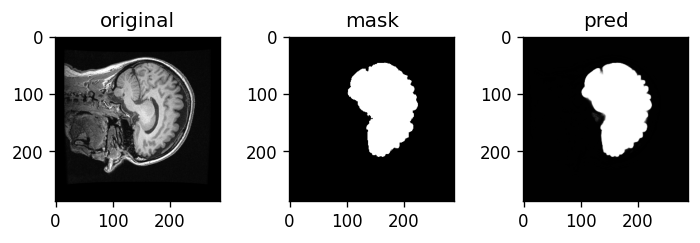

Average val loss for epoch  --> 0.021806713473051787 | BCE: 0.012435142934555188 | dice_loss: 0.009371570497751235
****************************************************************************************************


In [ ]:
train_loss_dict = {}
val_loss_dict = {}
train_loss_means = []
val_loss_means = []

train_BCE_loss_means = []
val_BCE_loss_means = []
train_dice_loss_means = []
val_dice_loss_means = []

for epoch in range(no_of_epochs):

  model, optimizer, loss_hist, BCE_loss_hist, dice_loss_hist = train(model, train_loader, optimizer, loss_func, epoch, device)

  print("Avg train loss for epoch  -->", mean(loss_hist),"| BCE:",mean(BCE_loss_hist),"| dice_loss:",mean(dice_loss_hist))
  train_loss_means.append(mean(loss_hist))
  train_BCE_loss_means.append(mean(BCE_loss_hist))
  train_dice_loss_means.append(mean(dice_loss_hist))

  train_loss_dict[epoch] = loss_hist

  val_loss_hist, val_BCE_loss_hist, val_dice_loss_hist = val(model, val_loader, loss_func, epoch, device)

  print("Average val loss for epoch  -->", mean(val_loss_hist),"| BCE:",mean(val_BCE_loss_hist),"| dice_loss:",mean(val_dice_loss_hist))

  val_loss_means.append(mean(val_loss_hist))
  val_BCE_loss_means.append(mean(val_BCE_loss_hist))
  val_dice_loss_means.append(mean(val_dice_loss_hist))

  val_loss_dict[epoch] = val_loss_hist

  print("****************************************************************************************************")

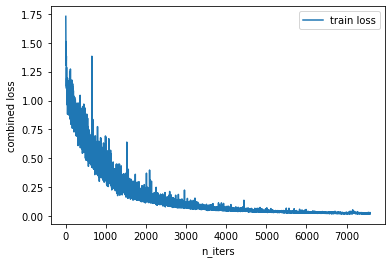

In [ ]:
tl = []
vl = []
for k,v in train_loss_dict.items():
  tl.extend(v)

for k,v in val_loss_dict.items():
  vl.extend(v)

plt.plot( tl , label = 'train loss')
#plt.plot( vl , label = 'val loss')
plt.legend()
plt.xlabel('n_iters')
plt.ylabel('combined loss')
plt.savefig('/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/loss_plots/training_loss')


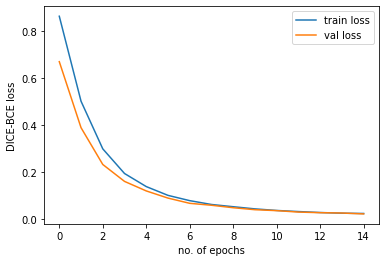

In [ ]:
plt.plot( train_loss_means , label = 'train loss')
plt.plot( val_loss_means , label = 'val loss')
plt.legend()
plt.xlabel('no. of epochs')
plt.ylabel('DICE-BCE loss')


plt.savefig('/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/loss_plots/dice_bce_loss')

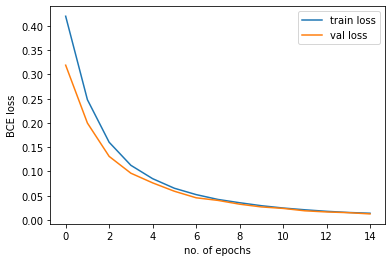

In [ ]:
plt.plot( train_BCE_loss_means , label = 'train loss')
plt.plot( val_BCE_loss_means , label = 'val loss')
plt.legend()
plt.xlabel('no. of epochs')
plt.ylabel('BCE loss')
plt.savefig('/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/loss_plots/bce_loss')

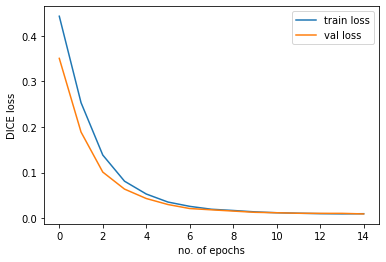

In [ ]:
plt.plot( train_dice_loss_means , label = 'train loss')
plt.plot( val_dice_loss_means , label = 'val loss')
plt.legend()
plt.xlabel('no. of epochs')
plt.ylabel('DICE loss')
plt.savefig('/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/loss_plots/dice_loss')

In [ ]:
train_loss_dict.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14])

In [ ]:
stats_dict = { }

In [ ]:
stats_dict['train_loss_dict'] = train_loss_dict
stats_dict['train_loss_means'] = train_loss_means
stats_dict['train_BCE_loss_means'] = train_BCE_loss_means
stats_dict['train_dice_loss_means'] = train_dice_loss_means

In [ ]:
stats_dict['val_loss_dict'] = val_loss_dict
stats_dict['val_loss_means'] = val_loss_means
stats_dict['val_BCE_loss_means'] = val_BCE_loss_means
stats_dict['val_dice_loss_means'] = val_dice_loss_means

In [ ]:
import pickle

file_to_store = open("/content/gdrive/MyDrive/unsup-segmentation/results/segmenter/segmenter_stats_dict.pkl", "wb")

pickle.dump(stats_dict, file_to_store)


file_to_store.close()

# Save Model

In [ ]:
#torch.save(model,'/content/gdrive/MyDrive/VMIA_Lab_Data/GE3/ge3_updated_train70_25epochs_combinedloss.pkl')

In [ ]:
torch.save(model,'/content/gdrive/MyDrive/unsup-segmentation/models/segmenter/segmenter_clipped_080222_v1.pkl') #VMIA_Lab_Data/GE3/ge3_updated_train70_25epochs_combinedloss.pkl')

In [ ]:
m1 = torch.load('/content/gdrive/MyDrive/unsup-segmentation/models/segmenter/segmenter_clipped_080222_v1.pkl')

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


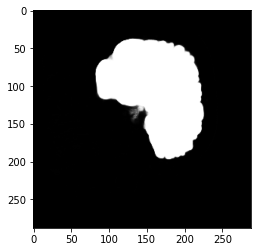

In [ ]:
plt.imshow( m1(torch.unsqueeze(train_data[1100:1104][0].float(), axis = 1).to(device))[1][0].detach().cpu(), cmap ='gray' )

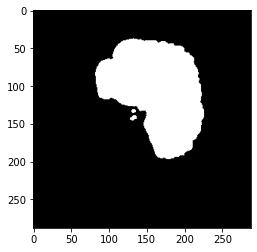

In [ ]:
plt.imshow( torch.unsqueeze(train_data[1100:1104][1].float(), axis = 1).to(device)[1][0].detach().cpu(), cmap ='gray' )